In [1]:
import numpy as np
from itertools import combinations, product, permutations
import warnings
import time
from idQ import is_parallel, is_strictly_less_than, is_less_equal_than, generate_binary_vectors, generate_permutations, get_D_l, height_of_Q, distances2U, preserve_partial_order
from idQ import contains_identity_submatrix, topo_order, identifiability
from idQ import representative_node_set, item_node_set, Phi_mat, T_mat
from idQ import check_three_column_submatrices
import random
from expr_function import random_generate_Q, generate_canonical_matrices, binary_matrix_to_string, sort_lexicographically, random_generate_Q, prop_check, sort_binary_matrix
import sys

import itertools
import cProfile
import random
from idQ import T_mat, get_D_l, get_D
import networkx as nx
import matplotlib.pyplot as plt

In [2]:
import numpy as np
import itertools
import networkx as nx
import matplotlib.pyplot as plt
from idQ import representative_node_set  # Assumes this function is defined elsewhere

def draw_G_K4(Q):
    """
    Draw the extended Hasse diagram G(Q) for a given Q (with K=4).
    
    This function draws the full Hasse diagram on {0,1}^4 (using fixed node positions),
    then restricts it to the latent nodes in the representative set R(Q).
    It also adds item nodes for each row of Q, labeling them with the exact binary vector,
    and positions each item node directly below the latent node corresponding to that vector.
    
    Parameters:
        Q (np.ndarray): A binary matrix of shape (J,4).
    """
    # Fixed positions for the full Hasse diagram on {0,1}^4.
    positions = {
        '1000': (2, 2), '0100': (4, 2), '0010': (6, 2), '0001': (8, 2),
        '1100': (1, 4), '1010': (3, 4), '1001': (5, 4),
        '0110': (7, 4), '0101': (9, 4), '0011': (11, 4),
        '1110': (2, 6), '1101': (4, 6), '1011': (6, 6), '0111': (8, 6),
        '1111': (5, 8)
    }
    
    # Create the full Hasse diagram as a directed graph.
    G = nx.DiGraph()
    for node in positions.keys():
        G.add_node(node)
    
    edges = [
        ('1000', '1100'), ('1000', '1010'), ('1000', '1001'),
        ('0100', '1100'), ('0100', '0110'), ('0100', '0101'),
        ('0010', '1010'), ('0010', '0110'), ('0010', '0011'),
        ('0001', '1001'), ('0001', '0101'), ('0001', '0011'),
        ('1100', '1110'), ('1100', '1101'),
        ('1010', '1110'), ('1010', '1011'),
        ('1001', '1101'), ('1001', '1011'),
        ('0110', '1110'), ('0110', '0111'),
        ('0101', '1101'), ('0101', '0111'),
        ('0011', '1011'), ('0011', '0111'),
        ('1110', '1111'),
        ('1101', '1111'),
        ('1011', '1111'),
        ('0111', '1111')
    ]
    G.add_edges_from(edges)
    
    # Compute the representative node set R(Q).
    rep_set_tuples = representative_node_set(Q)
    # Convert each tuple to a string (e.g., (1,0,0,0) -> "1000").
    rep_set = {''.join(map(str, t)) for t in rep_set_tuples}
    
    # Remove from G any latent node not in rep_set.
    nodes_to_remove = [node for node in G.nodes if node not in rep_set]
    G.remove_nodes_from(nodes_to_remove)
    
    # Create a new graph H that will contain both latent and item nodes.
    H = nx.DiGraph()
    H.add_nodes_from(G.nodes(data=True))
    H.add_edges_from(G.edges(data=True))
    
    # Create and add item nodes.
    # For each row j of Q, create an item node labeled with its binary vector,
    # and place it directly below the corresponding latent node.
    J = Q.shape[0]
    item_positions = {}
    for j in range(J):
        vec_str = ''.join(map(str, Q[j]))
        item_node = f'item_{j}'
        H.add_node(item_node, label=vec_str, type='item')
        # If the latent node exists, position the item node directly below it.
        if vec_str in positions:
            x, y = positions[vec_str]
            # Offset vertically (e.g., 1 unit below).
            item_positions[item_node] = (x, y - 1)
        else:
            # Otherwise, assign a default position.
            item_positions[item_node] = (j, 0)
        # Add a directed edge from the item node to the corresponding latent node.
        if vec_str in H.nodes:
            H.add_edge(item_node, vec_str)
        else:
            print(f"Warning: latent node for vector {vec_str} not found in H.")
    
    # Merge positions: latent nodes use positions from the fixed dictionary, and item nodes use item_positions.
    pos = {}
    for node in H.nodes():
        if node in positions:
            pos[node] = positions[node]
        elif node in item_positions:
            pos[node] = item_positions[node]
    
    # Draw the graph.
    plt.figure(figsize=(8, 6))
    # Draw latent nodes (circles).
    latent_nodes = [n for n in H.nodes() if n in positions]
    nx.draw_networkx_nodes(H, pos, nodelist=latent_nodes, node_color='skyblue', node_shape='o', node_size=800)
    # Draw item nodes (squares) using the label attribute.
    item_nodes = [n for n in H.nodes() if H.nodes[n].get('type') == 'item']
    nx.draw_networkx_nodes(H, pos, nodelist=item_nodes, node_color='lightgreen', node_shape='s', node_size=800)
    # Draw edges.
    nx.draw_networkx_edges(H, pos, arrowstyle='->', arrowsize=15)
    # Build labels: for latent nodes, label is the node name; for item nodes, label is the 'label' attribute.
    labels = {}
    for node in H.nodes():
        if H.nodes[node].get('type') == 'item':
            labels[node] = H.nodes[node].get('label')
        else:
            labels[node] = node
    nx.draw_networkx_labels(H, pos, labels, font_size=10)
    
    plt.axis('off')
    plt.title(r"$G(Q)$")
    plt.show()


In [3]:
def draw_G_K5(Q):

    # Define node positions (copied from your LaTeX diagram)
    positions = {
        '10000': (6.5,2), '01000': (8.5,2), '00100': (10.5,2), '00010': (12.5,2), '00001': (14.5,2),
        '11000': (2,4), '10100': (4,4), '10010': (6,4), '10001': (8,4), '01100': (10,4), '01010': (12,4), '01001': (14,4), '00110': (16,4), '00101': (18,4), '00011': (20,4),
        '11100': (2,6), '11010': (4,6), '11001': (6,6), '10110': (8,6), '10101': (10,6), '10011': (12,6), '01110': (14,6), '01101': (16,6), '01011': (18,6), '00111': (20,6),
        '11110': (6.5,8), '11101': (8.5,8), '11011': (10.5,8), '10111': (12.5,8), '01111': (14.5,8),
        '11111': (10.5,10)
    }

    # Create graph
    G = nx.DiGraph()

    # Add nodes to the graph
    for node in positions.keys():
        G.add_node(node)

    # Define edges (manually from your LaTeX diagram)
    edges = [
        ('10000', '11000'), ('10000', '10100'), ('10000', '10010'), ('10000', '10001'),
        ('01000', '11000'), ('01000', '01100'), ('01000', '01010'), ('01000', '01001'),
        ('00100', '10100'), ('00100', '01100'), ('00100', '00110'), ('00100', '00101'),
        ('00010', '10010'), ('00010', '01010'), ('00010', '00110'), ('00010', '00011'),
        ('00001', '10001'), ('00001', '01001'), ('00001', '00101'), ('00001', '00011'),
        ('11000', '11100'), ('11000', '11010'), ('11000', '11001'),
        ('10100', '11100'), ('10100', '10110'), ('10100', '10101'),
        ('10010', '11010'), ('10010', '10110'), ('10010', '10011'),
        ('10001', '11001'), ('10001', '10101'), ('10001', '10011'),
        ('01100', '11100'), ('01100', '01110'), ('01100', '01101'),
        ('01010', '11010'), ('01010', '01110'), ('01010', '01011'),
        ('01001', '11001'), ('01001', '01101'), ('01001', '01011'),
        ('00110', '10110'), ('00110', '01110'), ('00110', '00111'),
        ('00101', '10101'), ('00101', '01101'), ('00101', '00111'),
        ('00011', '10011'), ('00011', '01011'), ('00011', '00111'),
        ('11100', '11110'), ('11100', '11101'),
        ('11010', '11110'), ('11010', '11011'),
        ('11001', '11101'), ('11001', '11011'),
        ('10110', '11110'), ('10110', '10111'),
        ('10101', '11101'), ('10101', '10111'),
        ('10011', '11011'), ('10011', '10111'),
        ('01110', '11110'), ('01110', '01111'),
        ('01101', '11101'), ('01101', '01111'),
        ('01011', '11011'), ('01011', '01111'),
        ('00111', '10111'), ('00111', '01111'),
        ('11110', '11111'),
        ('11101', '11111'),
        ('11011', '11111'),
        ('10111', '11111'),
        ('01111', '11111')
    ]

    # Add edges to the graph
    G.add_edges_from(edges)
    
    # Convert Q to a list of strings
    Q_str = ["".join(map(str, row)) for row in Q.tolist()]
    
    # Define node colors
    node_colors = ['red' if node in Q_str else 'white' for node in G.nodes()]

    # Draw the graph
    nx.draw(G, pos=positions, with_labels=True, node_color=node_colors, node_size=1500)

    # Add text "q_i" beneath each node in Q_str
    for i, node in enumerate(Q_str, 1):
        plt.text(positions[node][0], positions[node][1] - 0.75, f'$q_{i}$', horizontalalignment='center', fontsize=14)

    # Draw the graph
    nx.draw(G, pos=positions, with_labels=True, node_color='lightblue', node_size=1500)
    plt.title('Hasse Diagram for Power Set')
    plt.show()

In [10]:
for Q in generate_canonical_matrices(4, 3):
    idd, Q_bar = identifiability(Q = Q)
    if idd:
        1
#         print(f"id: {Q}")
#         cor3check = check_three_column_submatrices(Q)
#         if cor3check is None:
#             print(f"This id Q meets the 3 column check.")
#         if not contains_identity_submatrix(Q):
#             print(f"And this Q has no I.")
    else:
        print(Q)
        print(idd)
        print(Q_bar)
        cor3check = check_three_column_submatrices(Q)
        if cor3check is not None:
            print("This not id Q indeed violate check 3.")

Q_reduced is identifiable (direct_check).
Q is identifiable.
Q_reduced is not identifiable (two-column check).
[[0 0 1]
 [0 1 0]
 [0 1 1]
 [1 0 1]]
0
[[0 0 1]
 [0 1 0]
 [0 1 1]
 [1 0 0]]
This not id Q indeed violate check 3.
Q_reduced is not identifiable (two-column check).
[[0 0 1]
 [0 1 0]
 [0 1 1]
 [1 1 1]]
0
[[0 0 1]
 [0 1 0]
 [0 1 1]
 [1 0 1]]
This not id Q indeed violate check 3.
Q_reduced is identifiable (direct_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is not identifiable (two-column check).
[[0 0 1]
 [0 1 0]
 [1 0 1]
 [1 1 1]]
0
[[0 0 1]
 [0 1 0]
 [1 0 0]
 [1 1 0]]
This not id Q indeed violate check 3.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is trivially not identifiable (one column).
[[0 0 1]
 [0 1 1]
 [1 0 1]
 [1 1 1]]
0
[[0 0 0]
 [0 1 0]
 [1 0 0]
 [1 1 0]]
This not id Q indeed violate check 3.
Q_reduced is not identifiable (two-column ch

In [4]:
J = 5
K = 4

In [5]:
all_matrices = generate_canonical_matrices(J = J, K = K)
len(all_matrices)

218

<!-- ###  A topological sort is a nonunique permutation of the nodes such that an edge from u to v implies that u appears before v in the topological sort order. -->

In [15]:
len(generate_canonical_matrices(5, 4))

218

In [17]:
len(generate_canonical_matrices(6, 4))

372

In [18]:
len(generate_canonical_matrices(7, 4))

507

In [33]:
len(generate_canonical_matrices(4, 3))

10

In [34]:
len(generate_canonical_matrices2(4, 3))

10

In [35]:
len(generate_canonical_matrices2(5, 3))

6

In [36]:
len(generate_canonical_matrices(5, 3))

6

In [37]:
len(generate_canonical_matrices3(5, 3))

17

# Generate all identifiable Q that does not contain an identity.

## id_Q54_withoutI: identifiable Q without Identity matrix.
## nid_Q54_id2: Not identifiable Q that satisfies: any two columns contain an I.

Q is trivially not identifiable. Q contains a zero column.
Q is trivially not identifiable. Q contains a zero column.
Q is identifiable
Q is trivially not identifiable. Q contains a zero column.
Q is trivially not identifiable. Q contains a zero column.
Q is identifiable
Q is identifiable
Q is identifiable


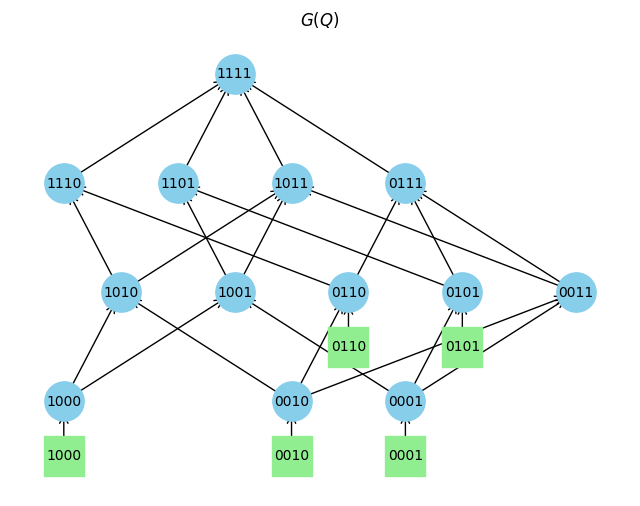

Q is identifiable


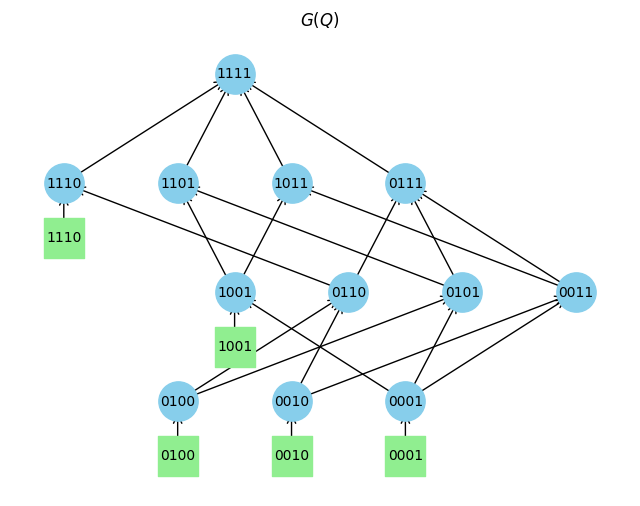

Q is identifiable


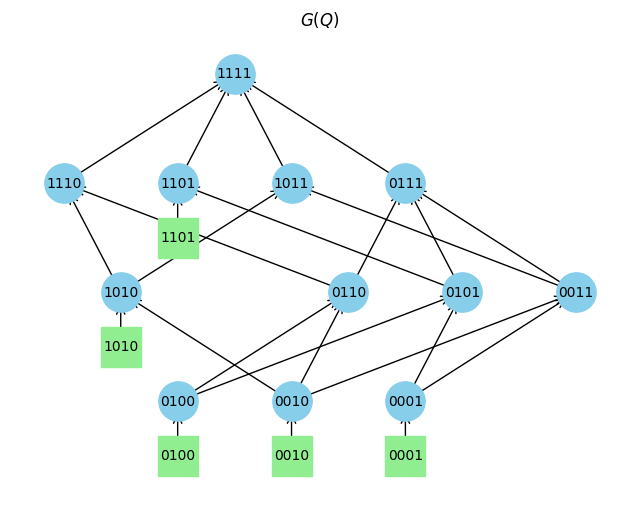

Q is identifiable


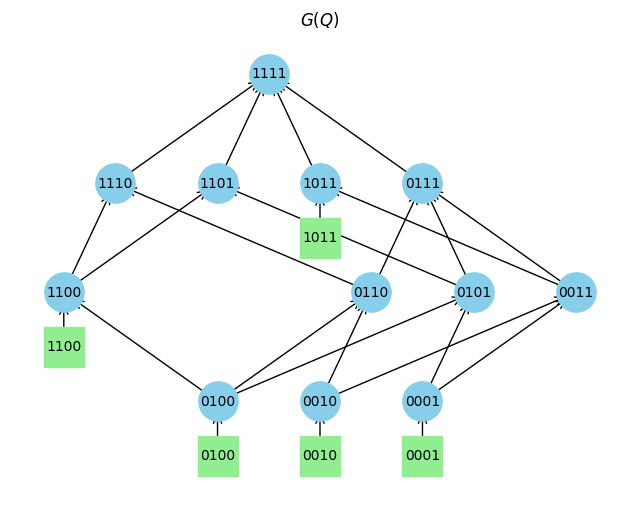

Q is trivially not identifiable. Q contains a zero column.
Q is identifiable


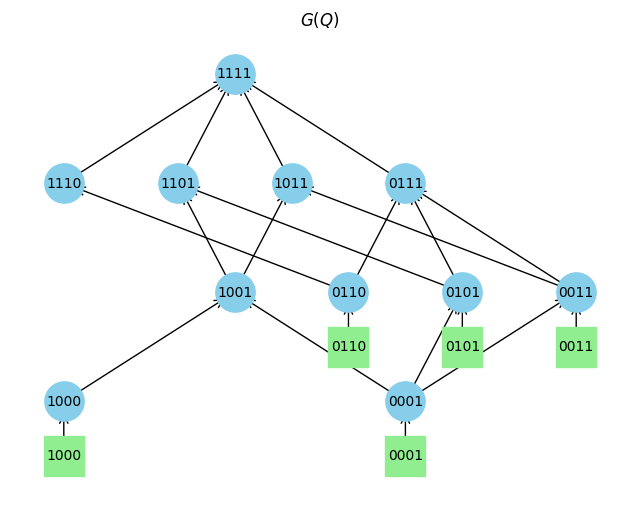

Q is identifiable


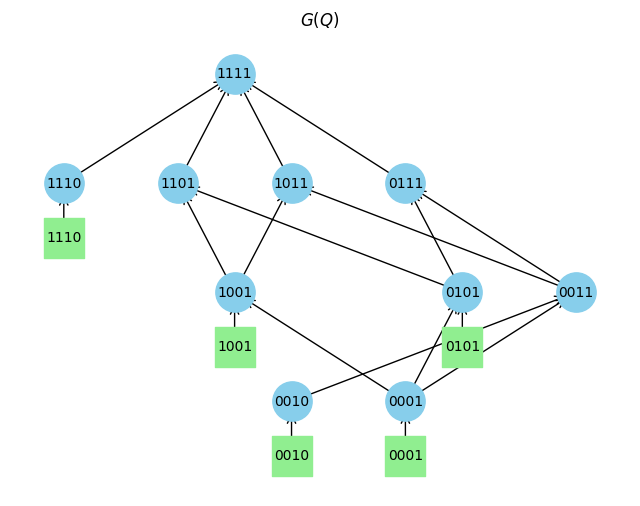

Q is identifiable


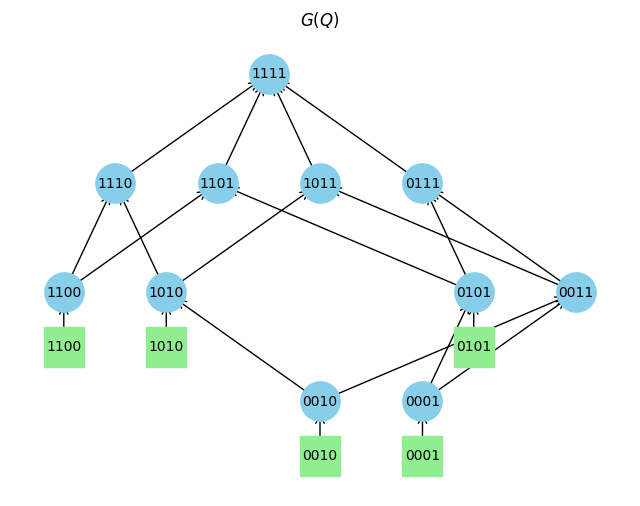

Q is identifiable


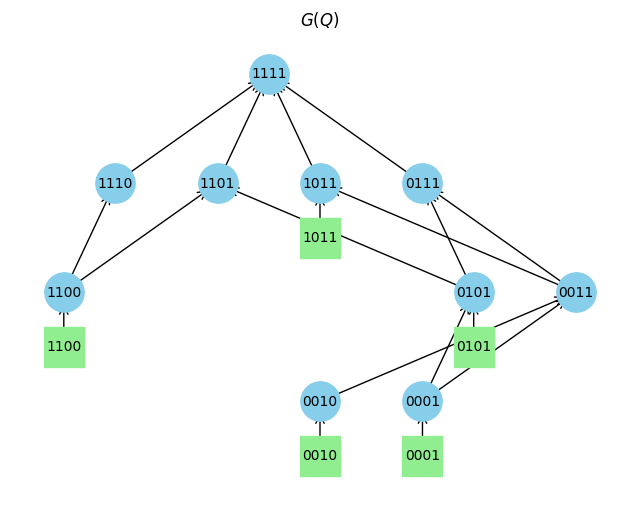

Q is identifiable


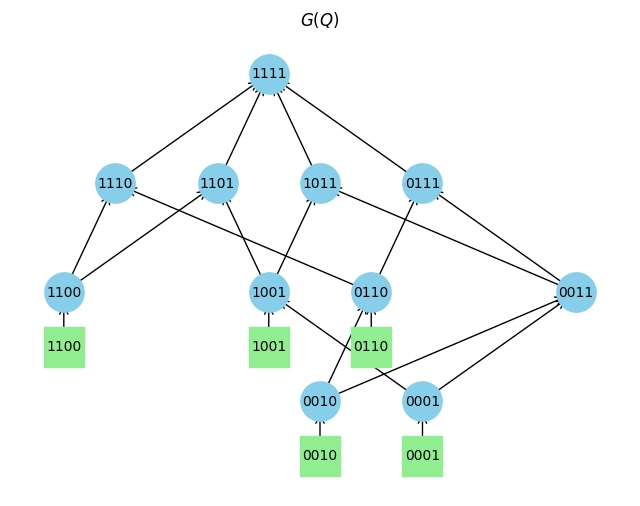

Q is identifiable


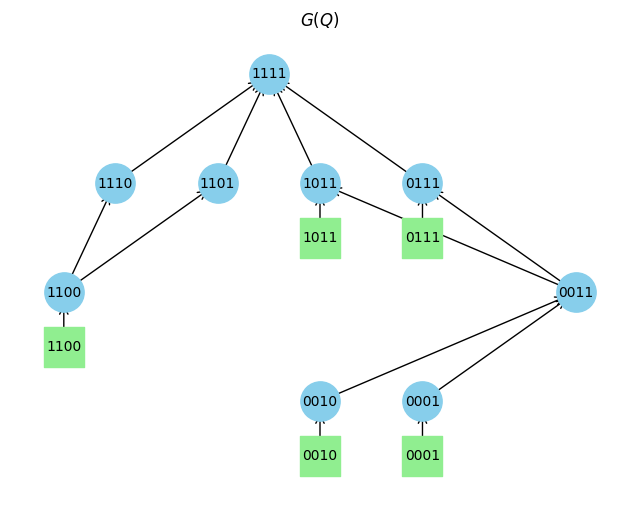

Q is trivially not identifiable. Q contains a zero column.
Q is trivially not identifiable. Q contains a one column.
Q is trivially not identifiable. Q contains a one column.
Q is trivially not identifiable. Q contains a one column.
Q is identifiable


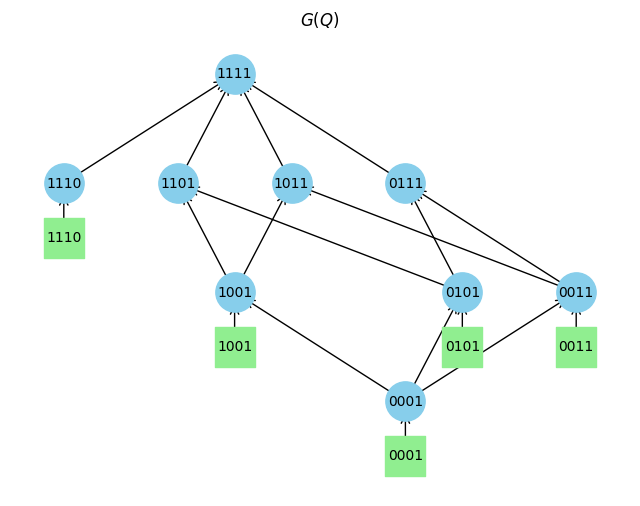

Q is trivially not identifiable. Q contains a one column.
Q is identifiable


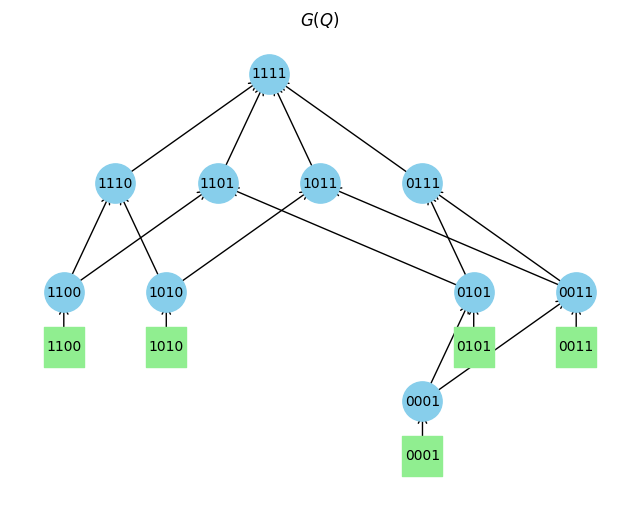

Q is trivially not identifiable. Q contains a one column.
Q is trivially not identifiable. Q contains a one column.
Q is identifiable


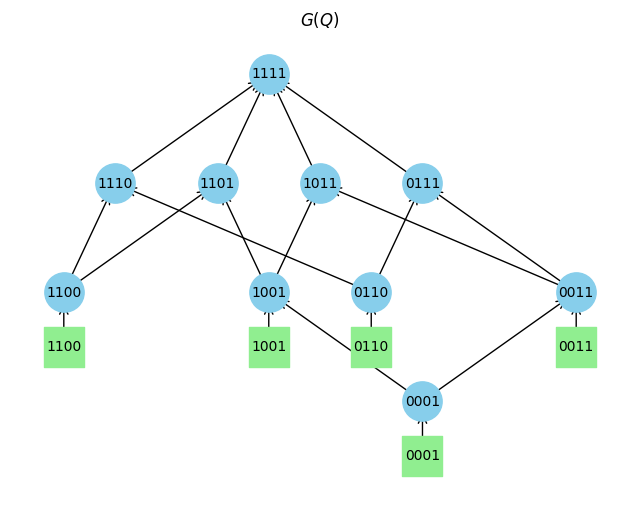

Q is identifiable


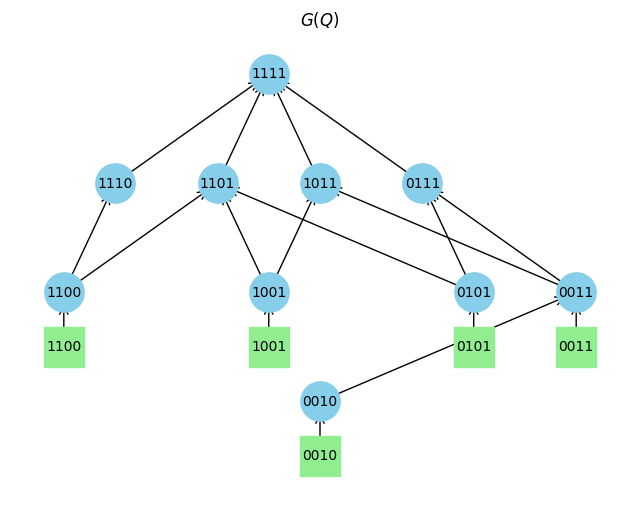

Q is identifiable


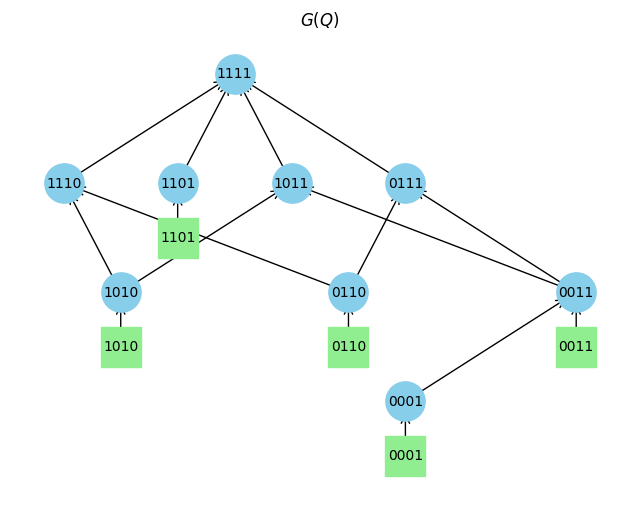

Q is identifiable


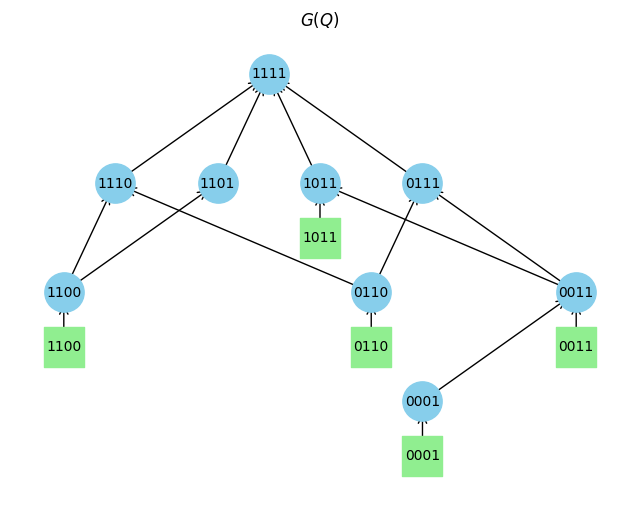

Q is trivially not identifiable. Q contains a one column.
Q is trivially not identifiable. Q contains a one column.
Q is trivially not identifiable. Q contains a one column.
Q is trivially not identifiable. Q contains a one column.
Q is identifiable


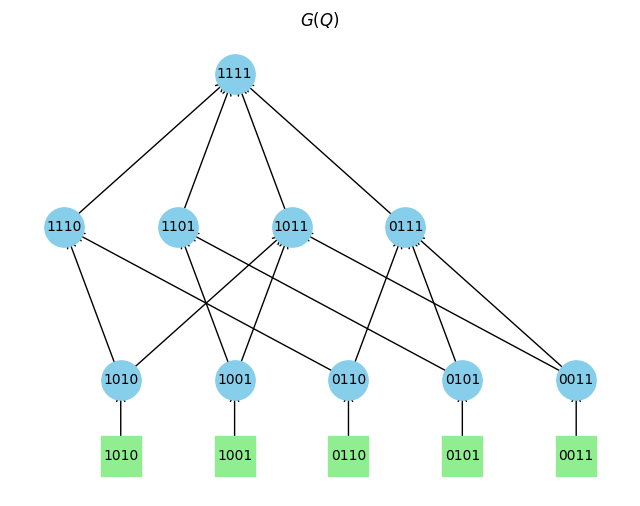

Q is identifiable


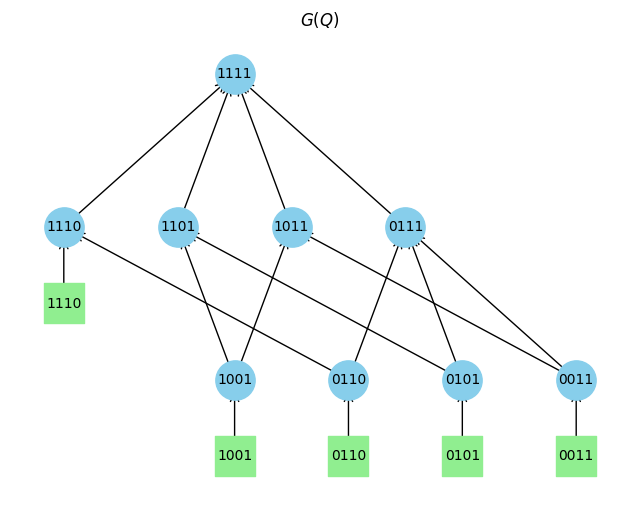

Q is identifiable


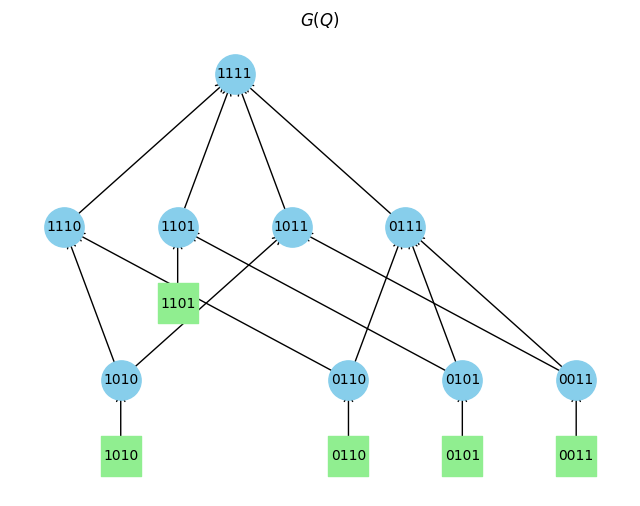

Q is identifiable


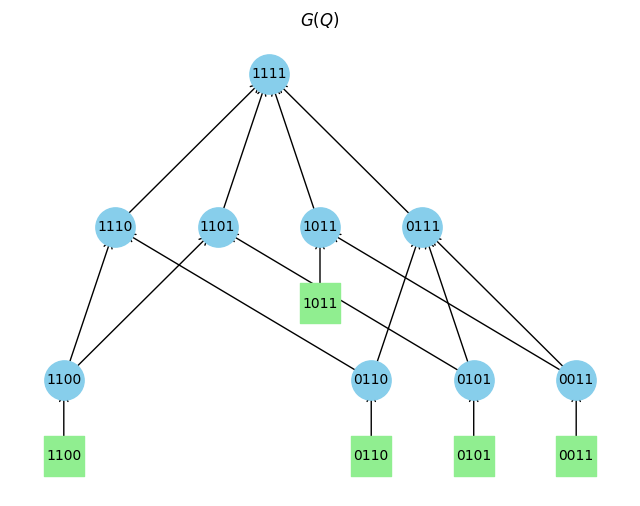

Q is trivially not identifiable. Q contains a one column.
Q is not identifiable
Q is trivially not identifiable. Q contains a one column.
Q is not identifiable
Q is trivially not identifiable. Q contains a one column.
Q is trivially not identifiable. Q contains a one column.
Q is not identifiable
Q is not identifiable
Q is not identifiable
Q is not identifiable
Q is trivially not identifiable. Q contains a one column.
Q is trivially not identifiable. Q contains a one column.


In [43]:
id_Q54 = []
id_Q54_withoutI = []
nid_Q54_id2 = []
nid_Q54_id3 = []
nid_Q54_ncol = []
for Q in generate_canonical_matrices(5, 4):
    idd, Q_bar = identifiability(Q = Q)
    if idd:
        id_Q54.append(Q)
        if not contains_identity_submatrix(Q):
            id_Q54_withoutI.append(Q)
            draw_G_K4(Q)
    else:
        if check_three_column_submatrices(Q) is None:
            nid_Q54_id3.append(Q)

array([[0, 0, 0, 1],
       [0, 0, 1, 0],
       [0, 0, 1, 1],
       [0, 1, 0, 0],
       [0, 1, 1, 1]])

In [21]:
Q = generate_canonical_matrices(5, 4)[1]

In [48]:
Q = generate_canonical_matrices(5, 4)[1]

# Step 1: Remove zero and identical rows.
Q_unique, mapping_zero_identical = remove_zero_identical(Q)
print("Removed zero and identical rows. Q_unique shape:", Q_unique)

# Step 2: Remove generated rows.
Q_reduced, mapping_generated = remove_generated_rows(Q_unique)
print("Removed generated rows. Q_reduced shape:", Q_reduced)


Removed zero and identical rows. Q_unique shape: [[0 0 0 1]
 [0 0 1 0]
 [0 0 1 1]
 [0 1 0 0]
 [0 1 1 1]]
Removed generated rows. Q_reduced shape: [[0 0 0 1]
 [0 0 1 0]
 [0 1 0 0]]


In [49]:

# All subsequent candidate generation is performed on Q_reduced.
# Step 3: Check for trivial non-identifiability on Q_reduced.
for k in range(Q_reduced.shape[1]):
    if np.all(Q_reduced[:, k] == 0):
        Q_reduced_bar = Q_reduced.copy()
        Q_reduced_bar[:, k] = 1
        print("Q_reduced is trivially not identifiable (zero column).")
        print(Q_reduced_bar)
        Q_unique_bar = lift_Q_generated(Q_unique, Q_reduced_bar, mapping_generated)
        Q_bar = lift_Q_zero_identical(Q, Q_unique_bar, mapping_zero_identical)

Q_reduced is trivially not identifiable (zero column).
[[1 0 0 1]
 [1 0 1 0]
 [1 1 0 0]]


In [17]:
identifiability(Q = generate_canonical_matrices(5, 4)[1])

Removed zero and identical rows. Q_unique shape: (5, 4)
Removed generated rows. Q_reduced shape: (3, 4)
Q_reduced is trivially not identifiable (zero column).


(0,
 array([[1, 0, 0, 1],
        [1, 0, 1, 0],
        [1, 0, 1, 1],
        [1, 1, 0, 0],
        [1, 1, 1, 1]]))

Q_reduced is trivially not identifiable (zero column).
Q_reduced is trivially not identifiable (zero column).
Q_reduced is identifiable (direct_check).
Q is identifiable.
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (zero column).
Q_reduced is trivially not identifiable (zero column).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not id

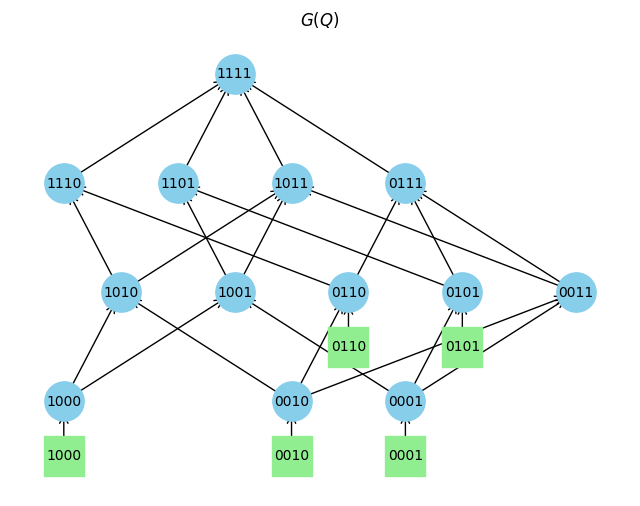

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


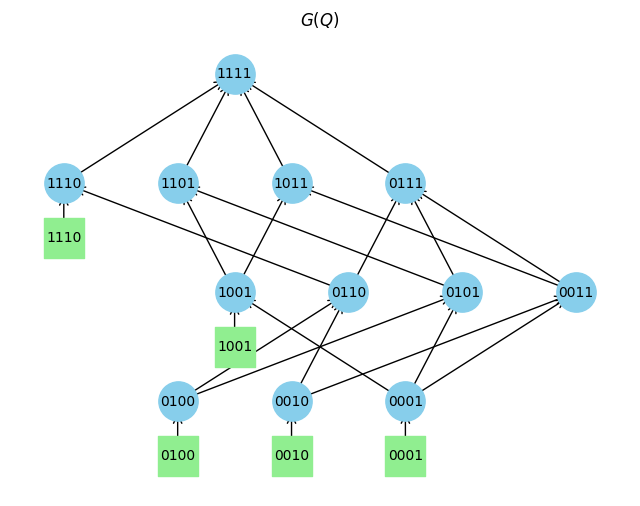

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


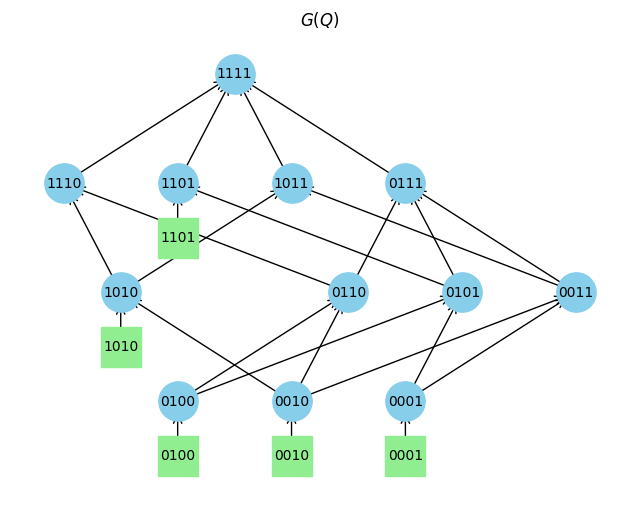

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


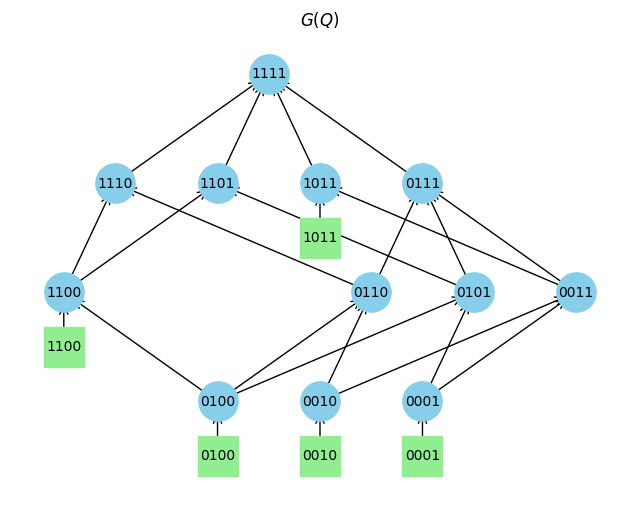

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (zero column).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


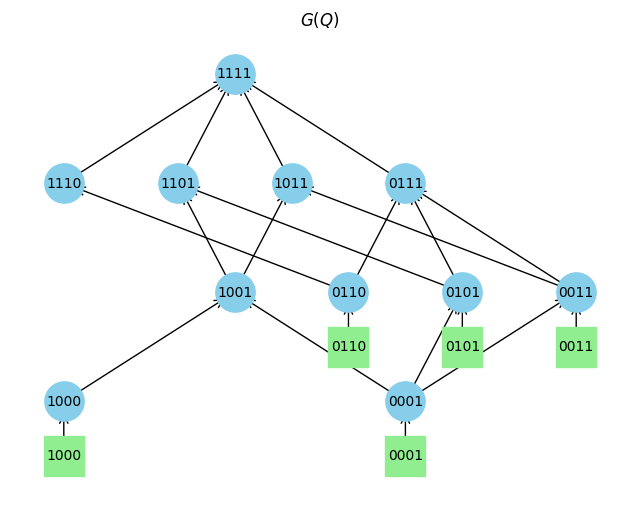

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


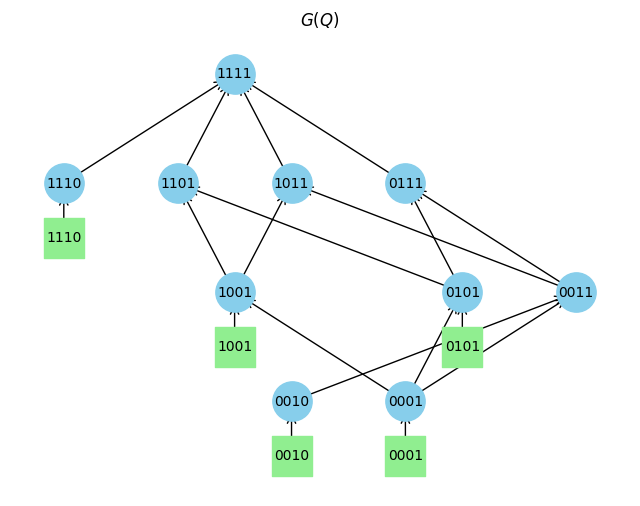

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


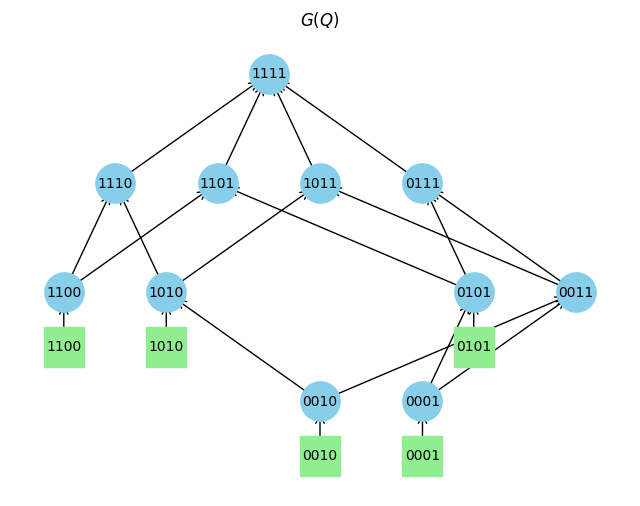

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


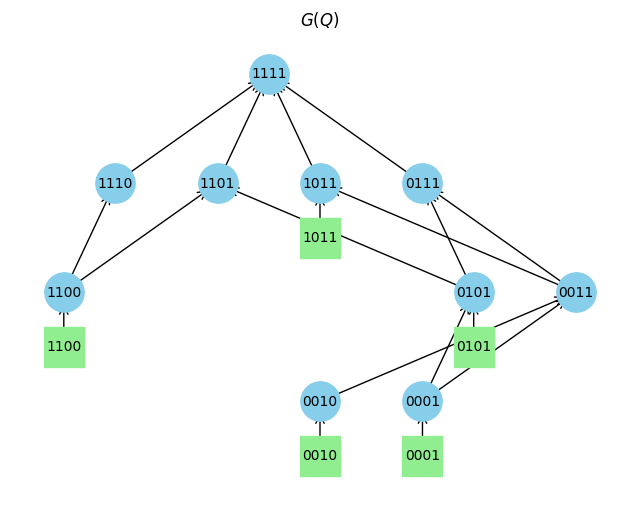

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


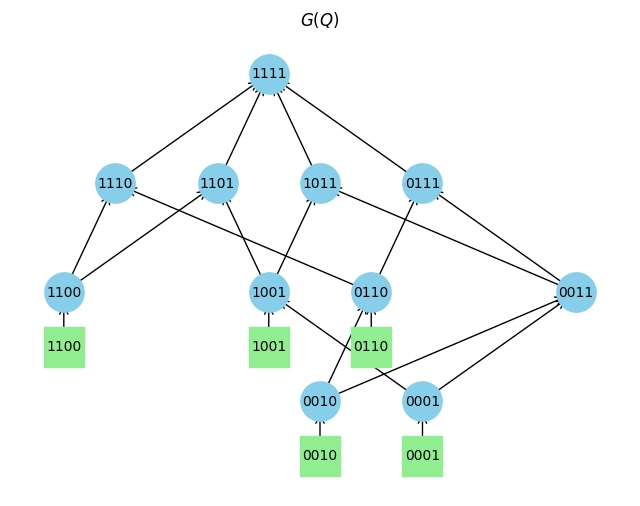

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


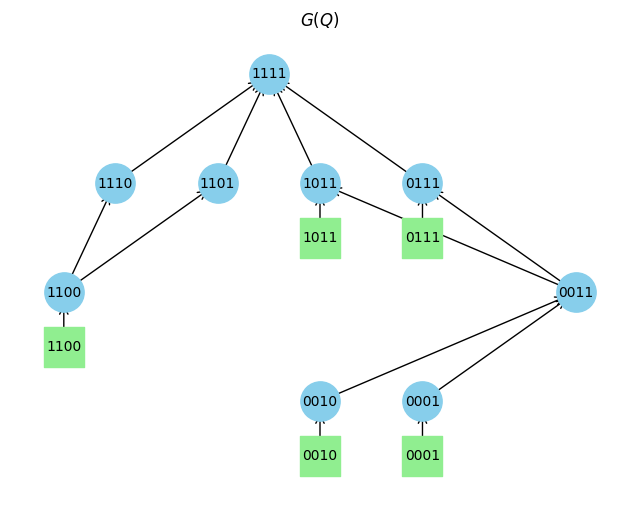

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (zero column).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiab

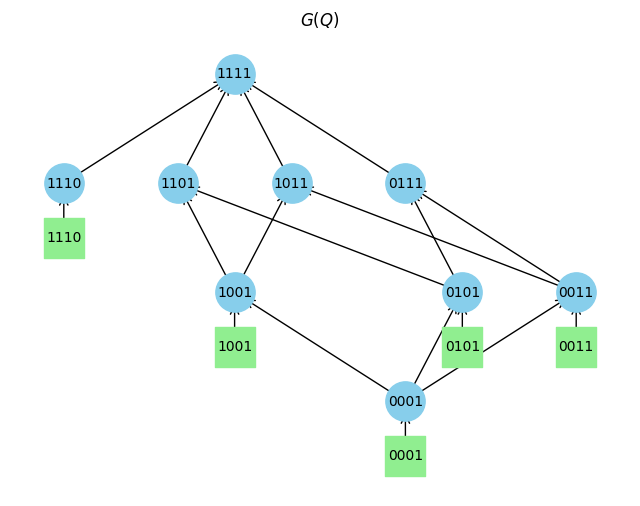

Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


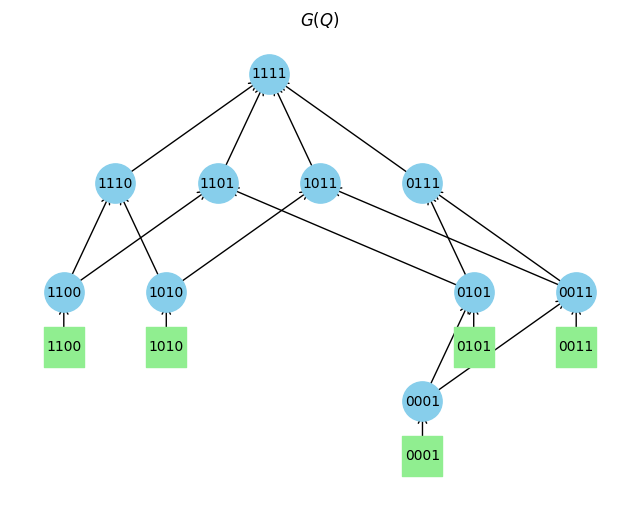

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


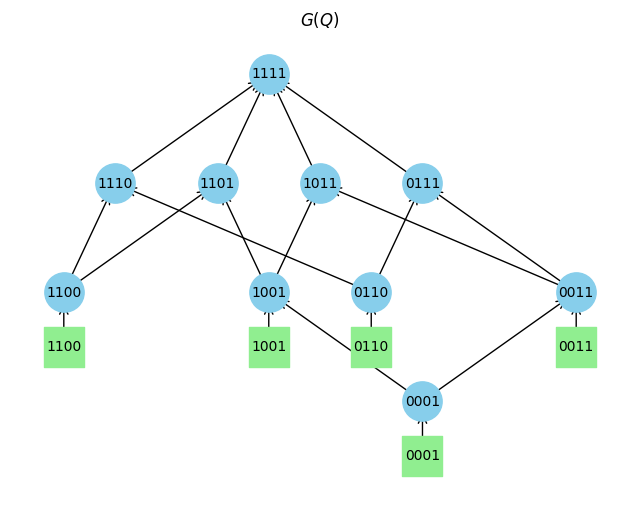

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


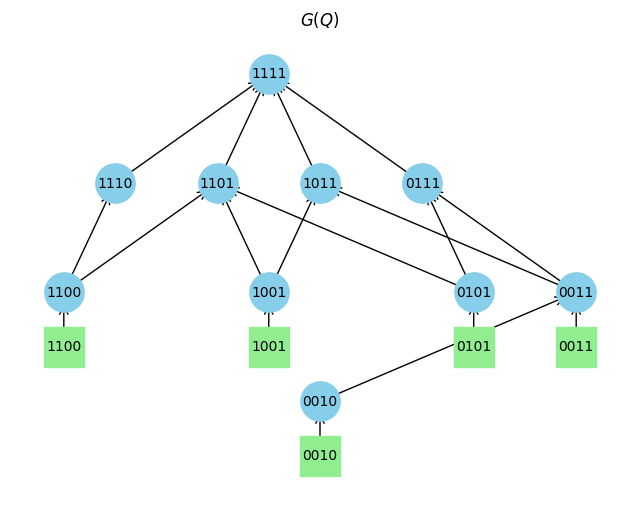

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


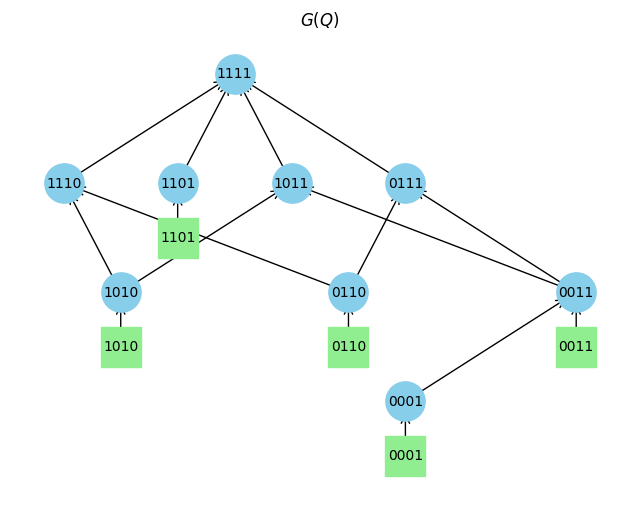

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


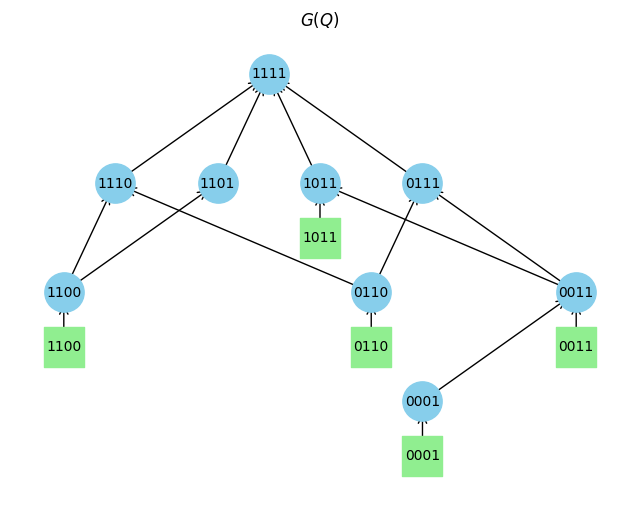

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-col

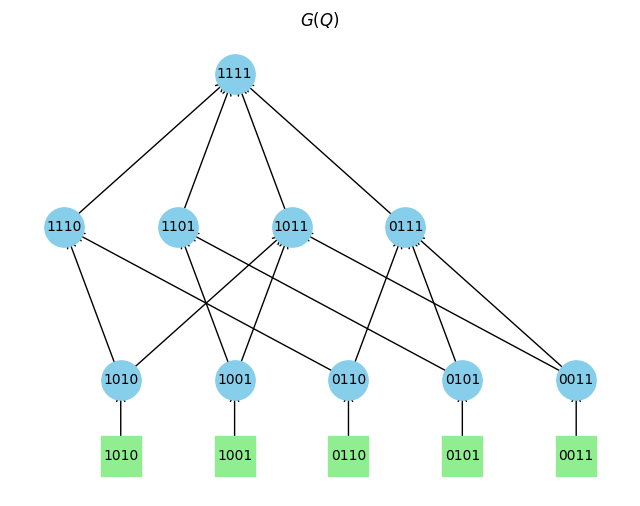

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


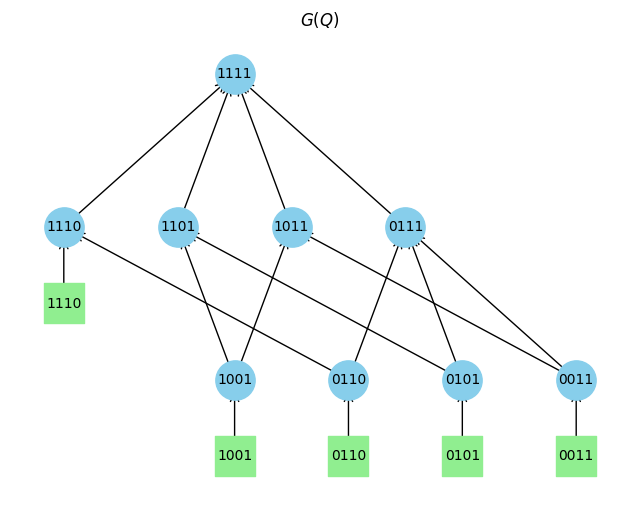

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


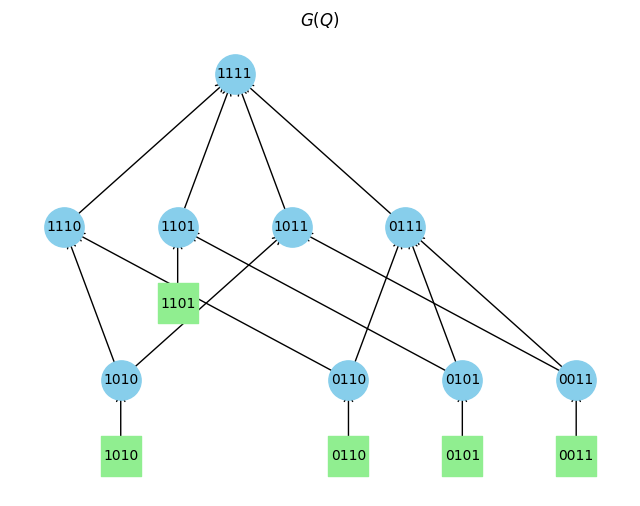

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


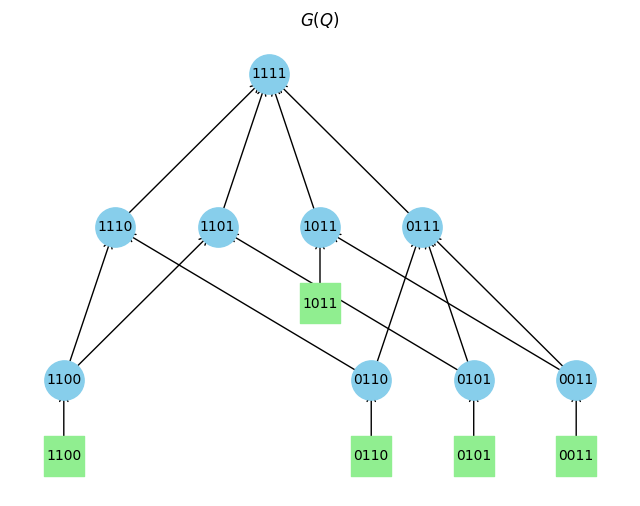

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable.
Q_reduced is not identifiable (brute_check_id).
Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable.
Q_reduced is not identifiable (brute_check_id).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable.
Q_reduced is not identifiable (brute_check_id).
Q_reduced is not identifiable.
Q_reduced is not

In [6]:
id_Q54 = []
id_Q54_withoutI = []
nid_Q54_id2 = []
nid_Q54_id3 = []
nid_Q54_ncol = []
for Q in generate_canonical_matrices(5, 4):
    idd, Q_bar = identifiability(Q = Q)
    if idd:
        id_Q54.append(Q)
        if not contains_identity_submatrix(Q):
            id_Q54_withoutI.append(Q)
            draw_G_K4(Q)
    else:
        if check_three_column_submatrices(Q) is None:
            nid_Q54_id3.append(Q)

In [7]:
len(id_Q54_withoutI)

20

In [15]:
id_Q54_withoutI

[array([[0, 0, 0, 1],
        [0, 0, 1, 0],
        [0, 1, 0, 1],
        [0, 1, 1, 0],
        [1, 0, 0, 0]]),
 array([[0, 0, 0, 1],
        [0, 0, 1, 0],
        [0, 1, 0, 0],
        [1, 0, 0, 1],
        [1, 1, 1, 0]]),
 array([[0, 0, 0, 1],
        [0, 0, 1, 0],
        [0, 1, 0, 0],
        [1, 0, 1, 0],
        [1, 1, 0, 1]]),
 array([[0, 0, 0, 1],
        [0, 0, 1, 0],
        [0, 1, 0, 0],
        [1, 0, 1, 1],
        [1, 1, 0, 0]]),
 array([[0, 0, 0, 1],
        [0, 0, 1, 1],
        [0, 1, 0, 1],
        [0, 1, 1, 0],
        [1, 0, 0, 0]]),
 array([[0, 0, 0, 1],
        [0, 0, 1, 0],
        [0, 1, 0, 1],
        [1, 0, 0, 1],
        [1, 1, 1, 0]]),
 array([[0, 0, 0, 1],
        [0, 0, 1, 0],
        [0, 1, 0, 1],
        [1, 0, 1, 0],
        [1, 1, 0, 0]]),
 array([[0, 0, 0, 1],
        [0, 0, 1, 0],
        [0, 1, 0, 1],
        [1, 0, 1, 1],
        [1, 1, 0, 0]]),
 array([[0, 0, 0, 1],
        [0, 0, 1, 0],
        [0, 1, 1, 0],
        [1, 0, 0, 1],
        [1, 1, 0

In [19]:
import csv
csv_filename = "identifiable_Q/identifiable_Q_K4_J5.csv"

with open(csv_filename, "w", newline="") as csvfile:
    writer = csv.writer(csvfile)
    for idx, matrix in enumerate(id_Q54_withoutI):
        # Write a header for each matrix.
        writer.writerow([f"Matrix {idx}"])
        # Write each row of the matrix.
        for row in matrix:
            writer.writerow(row.tolist())
        # Write a blank row as a separator.
        writer.writerow([])


In [46]:
from idQ import canonicalize
def generate_unique_Q_bars2(subQ_bars, Q, replacement_indices):
    
    """
    Generate candidate Q_bar matrices from the Cartesian product subQ_bars,
    yielding only one representative per permutation equivalence class.
    The canonical form of Q is added to the 'seen' set so that any candidate
    equivalent to Q is automatically filtered out.
    
    Parameters:
        subQ_bars (iterable): Cartesian product of candidate replacement rows.
        Q (np.ndarray): The input Q-matrix.
        replacement_indices (list): Indices of rows in Q to be replaced.
    
    Yields:
        np.ndarray: A candidate Q_bar that is not permutation equivalent to Q.
    """
    
    seen = set()
    canonical_Q = canonicalize(Q)
    seen.add(canonical_Q.tostring())
    
    for subQ_bar_replacements in subQ_bars:
        # Check if the candidate for replacements is empty:
        if len(subQ_bar_replacements) == 0:
            continue  # skip this candidate
        
        Q_bar = Q.copy()
        candidate = np.array(subQ_bar_replacements)
        # Ensure candidate has the correct shape. If candidate.ndim == 1, reshape it.
        if candidate.ndim == 1:
            candidate = candidate.reshape(1, -1)
        
        Q_bar[replacement_indices, :] = candidate
        can_form = canonicalize(Q_bar)
        key = can_form.tostring()
        if key not in seen:
            seen.add(key)
            yield Q_bar

In [47]:
import time
import itertools
import numpy as np

import time
import itertools
import numpy as np

def brute_check_id2(Q_reduced):
    """
    Perform candidate generation on the reduced matrix Q_reduced to check identifiability.
    
    Q_reduced is the matrix obtained after removing all-zero, duplicate, 
    and generated rows. The function enumerates candidate Q_reduced_bar 
    matrices by modifying the replaceable rows of Q_reduced.
    
    Returns:
        (status, Q_reduced_bar) where:
          - status == 0: Q_reduced is not identifiable, and Q_reduced_bar is a candidate.
          - status == 1: Q_reduced is identifiable, and Q_reduced_bar is None.
    """
    total_start = time.perf_counter()
    J_reduced, K = Q_reduced.shape

    # Step 1: Compute distances.
    distances = distances2U(Q_reduced)

    # Step 2: Identify irreplaceable and replaceable rows.
    irreplaceable_rows = np.where(np.array(distances) == K - 1)[0]
    replaceable_rows = set(range(J_reduced)) - set(irreplaceable_rows)
    replacement_indices = list(replaceable_rows)

    # Step 3: For each replaceable row, generate candidate binary vectors and validate them.
    subQ_bars = []
    for index in replacement_indices:
        q_bars = []
        # Generate candidate binary vectors for the current row.
        for p in range(1, K - distances[index] + 1):
            q_bars.extend(generate_binary_vectors(K, p))
        valid_q_bars = []
        Q_temp = Q_reduced.copy()
        for q_bar in q_bars:
            Q_temp[index, :] = q_bar
            if preserve_partial_order(Q_reduced, Q_temp, set(irreplaceable_rows), [index]):
                valid_q_bars.append(q_bar)
        subQ_bars.append(valid_q_bars)
    
    # Step 4: Generate Cartesian product of candidates (for debugging, not printing its runtime).
    _ = list(itertools.product(*subQ_bars))  # Discard count if not needed.

    # Recreate an iterator over the Cartesian product for candidate generation.
    Q_bar_gen = generate_unique_Q_bars2(itertools.product(*subQ_bars), Q_reduced, replacement_indices)
    
    # Step 5: Evaluate each candidate using thmCheck.
    PhiQ = Phi_mat(Q_reduced)
    has_candidate = False
    candidate_count = 0

    for Q_reduced_bar in Q_bar_gen:
        has_candidate = True
        candidate_count += 1
        PhiB = Phi_mat(Q_reduced_bar)
        if thmCheck(PhiQ, PhiB, tol=1e-8):
            print(f"Found invalidating candidate after processing {candidate_count} candidates.")
            print("Q_reduced is not identifiable.")
            return 0, Q_reduced_bar

    # Final message: if no candidate invalidated Q.
    if not has_candidate:
        print("Processed all 0 candidates; Q_reduced is identifiable (no candidates).")
    else:
        print(f"Processed all {candidate_count} candidates; none invalidated Q.")
    return 1, None


In [66]:
import time
import itertools
import numpy as np
from reduceQ import (
    get_reduced, 
    get_Qunique_from_Qreduced, 
    get_Q_from_Qunique, 
    get_Q_from_Qreduced
)
import os
from direct_check_id import direct_check_id
from idQ import (check_two_column_submatrices, generate_unique_Q_bars, 
                 Phi_mat, thmCheck, distances2U, 
                 representative_node_set, preserve_partial_order)

def identifiability2(Q):
    """
    Check if Q is identifiable. If not, return one possible candidate Q_bar.
    
    The function proceeds as follows:
      1. Remove zero and identical rows from Q, yielding Q_unique and mapping_zero_identical.
      2. Remove rows that are generated by others from Q_unique, yielding Q_reduced and mapping_generated.
      3. Perform trivial column checks and two-/three-column submatrix checks on Q_reduced.
      4. Directly check identifiability of Q_reduced using direct_check_id.
      5. If direct_check_id returns False, use brute_check_id2 on Q_reduced.
      6. If a candidate Q_reduced_bar is found, lift it back to a candidate Q_bar for the original Q.
    
    Returns:
        (status, Q_bar, t_brute, t_total)
          status == 1 indicates Q is identifiable,
          status == 0 indicates Q is not identifiable and Q_bar is a candidate.
          t_brute: time used for the brute_check_id2 call (0 if not used)
          t_total: total runtime of this function.
    """
    total_start = time.perf_counter()
    Q = Q.copy()
    
    # Step 1: Get Q_reduced and Q_unique along with associated mappings.
    (Q_reduced, reduced_to_original, orig_indices_for_reduced,
         Q_unique, unique_to_original, reduced_to_unique) = get_reduced(Q)
    
    J_reduced, K = Q_reduced.shape
    
    # Step 3: Check for trivial non-identifiability on Q_reduced.
    for k in range(K):
        if np.all(Q_reduced[:, k] == 0):
            Q_reduced_bar = Q_reduced.copy()
            Q_reduced_bar[:, k] = 1
            print("Q_reduced is trivially not identifiable (zero column).")
            Q_bar = get_Q_from_Qreduced(Q_reduced_bar, reduced_to_original)
            t_total = time.perf_counter() - total_start
            return 0, Q_bar, 0.0, t_total
        if np.all(Q_reduced[:, k] == 1):
            Q_reduced_bar = Q_reduced.copy()
            Q_reduced_bar[:, k] = 0
            print("Q_reduced is trivially not identifiable (one column).")
            Q_bar = get_Q_from_Qreduced(Q_reduced_bar, reduced_to_original)
            t_total = time.perf_counter() - total_start
            return 0, Q_bar, 0.0, t_total

    candidate = check_two_column_submatrices(Q_reduced)
    if candidate is not None:
        print("Q_reduced is not identifiable (two-column check).")
        Q_reduced_bar = candidate
        Q_bar = get_Q_from_Qreduced(Q_reduced_bar, reduced_to_original)
        t_total = time.perf_counter() - total_start
        return 0, Q_bar, 0.0, t_total

    candidate = check_three_column_submatrices(Q_reduced)
    if candidate is not None:
        print("Q_reduced is not identifiable (three-column check).")
        Q_reduced_bar = candidate
        Q_bar = get_Q_from_Qreduced(Q_reduced_bar, reduced_to_original)
        t_total = time.perf_counter() - total_start
        return 0, Q_bar, 0.0, t_total

    # Step 4: Check identifiability of Q_reduced.
    if direct_check_id(Q_reduced):
        print("Q_reduced is identifiable (direct_check).")
        t_brute = 0.0
    else:
        start_brute = time.perf_counter()
        status, Q_reduced_bar = brute_check_id(Q_reduced)
        t_brute = time.perf_counter() - start_brute
        if status == 0:
            print("Q_reduced is not identifiable (brute_check_id).")
            Q_bar = get_Q_from_Qreduced(Q_reduced_bar, reduced_to_original)
            t_total = time.perf_counter() - total_start
            return 0, Q_bar, t_brute, t_total
        else:
            print("Q_reduced is identifiable (brute_check).")
    
    # Step 5: Process candidate generation on Q_unique (if needed).
    J_unique, K = Q_unique.shape
    distances = distances2U(Q_unique)
    non_generated_indices = [u for u, mapping in enumerate(reduced_to_unique) if len(mapping) == 1]
    irreplaceable_rows = set(non_generated_indices)
    replaceable_rows = set(range(J_unique)) - irreplaceable_rows
    replacement_indices_unique = list(replaceable_rows)

    # Construct candidate set: all binary vectors of length K not in the representative set R(Q_unique).
    all_vecs = list(itertools.product([0, 1], repeat=K))
    rep_set = representative_node_set(Q_unique)  # Returns a set of tuples.
    cand_bars = [np.array(vec) for vec in all_vecs if tuple(vec) not in rep_set]

    subQ_unique_bars = []
    for index in replacement_indices_unique:
        norm_threshold = K - distances[index]
        q_bars = [cand for cand in cand_bars if np.sum(cand) <= norm_threshold]
        valid_q_bars = []
        Q_temp = Q_unique.copy()
        for q_bar in q_bars:
            Q_temp[index, :] = q_bar
            if preserve_partial_order(Q_unique, Q_temp, set(irreplaceable_rows), [index]):
                valid_q_bars.append(q_bar)
        subQ_unique_bars.append(valid_q_bars)
    
    subQ_unique_bars = itertools.product(*subQ_unique_bars)
    Q_unique_bar_gen = generate_unique_Q_bars2(subQ_unique_bars, Q_unique, replacement_indices_unique)
    
    try:
        first_candidate = next(Q_unique_bar_gen)
    except StopIteration:
        print("Q is identifiable.")
        t_total = time.perf_counter() - total_start
        return 1, None, t_brute, t_total
    else:
        Q_unique_bar_gen = itertools.chain([first_candidate], Q_unique_bar_gen)
    
    PhiQ = Phi_mat(Q_unique)
    for Q_unique_bar in Q_unique_bar_gen:
        PhiB = Phi_mat(Q_unique_bar)
        if thmCheck(PhiQ, PhiB, tol=1e-8):
            print("Q is not identifiable (Enumerated all Q_bars).")
            Q_bar = get_Q_from_Qunique(Q_unique_bar, unique_to_original)
            t_total = time.perf_counter() - total_start
            return 0, Q_bar, t_brute, t_total
    
    print("Q is identifiable.")
    t_total = time.perf_counter() - total_start
    return 1, None, t_brute, t_total


In [55]:
len(id_Q64_withoutI)

103

In [71]:
[T_brute0[i] - T_brute[i] for i in range(102)]

[-0.006814873777329922,
 -0.006023690104484558,
 -0.010092243552207947,
 -0.009817239828407764,
 -0.008912155404686928,
 -0.04628567770123482,
 -0.0851273387670517,
 -0.04388063307851553,
 -0.10388184804469347,
 -0.04463818855583668,
 -0.23462660610675812,
 -0.005896179936826229,
 -0.005836115218698978,
 -0.010223339311778545,
 -0.009937777183949947,
 -0.008898060768842697,
 -0.005847473628818989,
 -0.01324367243796587,
 -0.00587642565369606,
 -0.005871924571692944,
 -0.0062743620947003365,
 -0.012872575782239437,
 -0.010242690332233906,
 -0.009868020191788673,
 -0.009894797578454018,
 -0.008921396918594837,
 -0.15251141134649515,
 -0.35824152640998363,
 -0.22177349403500557,
 -0.4287098543718457,
 -0.42524292692542076,
 -0.5327301500365138,
 -0.04654723312705755,
 -0.08127567358314991,
 -0.04657856933772564,
 -0.10469392407685518,
 -0.046117874793708324,
 -0.044224126264452934,
 -0.046042426489293575,
 -0.08338406775146723,
 -0.08201695792376995,
 -0.0441046142950654,
 -0.046563506126

In [67]:
T_brute0 = []
T_total0 = []
for Q in id_Q64_withoutI:
    idd, Q_bar, t_brute, t_total = identifiability2(Q)
    T_brute0.append(t_brute)
    T_total0.append(t_total)
    if not idd:
        print(Q)

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


/tmp/ipykernel_4192038/2148999868.py:21: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  seen.add(canonical_Q.tostring())
/tmp/ipykernel_4192038/2148999868.py:36: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  key = can_form.tostring()


Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is ide

In [60]:
T_brute = []
T_total = []
for Q in id_Q64_withoutI:
    idd, Q_bar, t_brute, t_total = identifiability2(Q)
    T_brute.append(t_brute)
    T_total.append(t_total)
    if not idd:
        print(Q)

[brute_check_id] distances2U took 0.0023 seconds.
[brute_check_id] Identifying irreplaceable/replacement rows took 0.0000 seconds.
   irreplaceable_rows: [0, 1, 2]
   replacement_indices: [3, 4]
[brute_check_id] For row 3: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 3: validation took 0.0005 seconds, 2 valid candidates found.
[brute_check_id] For row 4: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 4: validation took 0.0006 seconds, 2 valid candidates found.
[brute_check_id] Cartesian product generated 4 tuples in 0.0000 seconds.
[brute_check_id] Processed all 3 candidates in 0.0070 s; none invalidated Q.
[brute_check_id] Total runtime: 0.0108 seconds.
Q_reduced is identifiable (candidates exist but didn't invalidate Q).
Q_reduced is identifiable (brute_check).
Q is identifiable.
[brute_check_id] distances2U took 0.0021 seconds.
[brute_check_id] Identifying irreplaceable/replacement rows t

/tmp/ipykernel_4192038/2148999868.py:21: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  seen.add(canonical_Q.tostring())
/tmp/ipykernel_4192038/2148999868.py:36: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  key = can_form.tostring()


[brute_check_id] Processed all 75 candidates in 0.1104 s; none invalidated Q.
[brute_check_id] Total runtime: 0.1134 seconds.
Q_reduced is identifiable (candidates exist but didn't invalidate Q).
Q_reduced is identifiable (brute_check).
Q is identifiable.
[brute_check_id] distances2U took 0.0018 seconds.
[brute_check_id] Identifying irreplaceable/replacement rows took 0.0000 seconds.
   irreplaceable_rows: [0, 1]
   replacement_indices: [2, 3, 4]
[brute_check_id] For row 2: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 2: validation took 0.0004 seconds, 5 valid candidates found.
[brute_check_id] For row 3: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 3: validation took 0.0003 seconds, 5 valid candidates found.
[brute_check_id] For row 4: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 4: validation took 0.0003 seconds, 3 valid candidates found.


[brute_check_id] Processed all 9 candidates in 0.0209 s; none invalidated Q.
[brute_check_id] Total runtime: 0.0240 seconds.
Q_reduced is identifiable (candidates exist but didn't invalidate Q).
Q_reduced is identifiable (brute_check).
Q is identifiable.
[brute_check_id] distances2U took 0.0019 seconds.
[brute_check_id] Identifying irreplaceable/replacement rows took 0.0000 seconds.
   irreplaceable_rows: [0, 1, 2]
   replacement_indices: [3, 4]
[brute_check_id] For row 3: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 3: validation took 0.0005 seconds, 2 valid candidates found.
[brute_check_id] For row 4: generate_binary_vectors took 0.0000 seconds, produced 14 candidates.
[brute_check_id] For row 4: validation took 0.0005 seconds, 5 valid candidates found.
[brute_check_id] Cartesian product generated 10 tuples in 0.0000 seconds.
[brute_check_id] Processed all 9 candidates in 0.0186 s; none invalidated Q.
[brute_check_id] Total runtime: 0

[brute_check_id] Processed all 375 candidates in 0.5044 s; none invalidated Q.
[brute_check_id] Total runtime: 0.5082 seconds.
Q_reduced is identifiable (candidates exist but didn't invalidate Q).
Q_reduced is identifiable (brute_check).
Q is identifiable.
[brute_check_id] distances2U took 0.0019 seconds.
[brute_check_id] Identifying irreplaceable/replacement rows took 0.0000 seconds.
   irreplaceable_rows: [0, 1]
   replacement_indices: [2, 3, 4, 5]
[brute_check_id] For row 2: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 2: validation took 0.0004 seconds, 5 valid candidates found.
[brute_check_id] For row 3: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 3: validation took 0.0003 seconds, 5 valid candidates found.
[brute_check_id] For row 4: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 4: validation took 0.0003 seconds, 5 valid candidates fou

[brute_check_id] Processed all 75 candidates in 0.1086 s; none invalidated Q.
[brute_check_id] Total runtime: 0.1115 seconds.
Q_reduced is identifiable (candidates exist but didn't invalidate Q).
Q_reduced is identifiable (brute_check).
Q is identifiable.
[brute_check_id] distances2U took 0.0015 seconds.
[brute_check_id] Identifying irreplaceable/replacement rows took 0.0000 seconds.
   irreplaceable_rows: [0, 1]
   replacement_indices: [2, 3, 4]
[brute_check_id] For row 2: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 2: validation took 0.0004 seconds, 5 valid candidates found.
[brute_check_id] For row 3: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 3: validation took 0.0004 seconds, 5 valid candidates found.
[brute_check_id] For row 4: generate_binary_vectors took 0.0000 seconds, produced 14 candidates.
[brute_check_id] For row 4: validation took 0.0004 seconds, 6 valid candidates found.


[brute_check_id] Processed all 1087 candidates in 1.5466 s; none invalidated Q.
[brute_check_id] Total runtime: 1.5505 seconds.
Q_reduced is identifiable (candidates exist but didn't invalidate Q).
Q_reduced is identifiable (brute_check).
Q is identifiable.
[brute_check_id] distances2U took 0.0017 seconds.
[brute_check_id] Identifying irreplaceable/replacement rows took 0.0000 seconds.
   irreplaceable_rows: [0, 1]
   replacement_indices: [2, 3, 4]
[brute_check_id] For row 2: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 2: validation took 0.0003 seconds, 5 valid candidates found.
[brute_check_id] For row 3: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 3: validation took 0.0004 seconds, 5 valid candidates found.
[brute_check_id] For row 4: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 4: validation took 0.0003 seconds, 3 valid candidates found

[brute_check_id] Processed all 4427 candidates in 5.3871 s; none invalidated Q.
[brute_check_id] Total runtime: 5.3924 seconds.
Q_reduced is identifiable (candidates exist but didn't invalidate Q).
Q_reduced is identifiable (brute_check).
Q is identifiable.
[brute_check_id] distances2U took 0.0016 seconds.
[brute_check_id] Identifying irreplaceable/replacement rows took 0.0000 seconds.
   irreplaceable_rows: [0]
   replacement_indices: [1, 2, 3, 4, 5]
[brute_check_id] For row 1: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 1: validation took 0.0003 seconds, 9 valid candidates found.
[brute_check_id] For row 2: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 2: validation took 0.0003 seconds, 9 valid candidates found.
[brute_check_id] For row 3: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 3: validation took 0.0002 seconds, 6 valid candidates fo

[brute_check_id] Processed all 503 candidates in 0.5998 s; none invalidated Q.
[brute_check_id] Total runtime: 0.6027 seconds.
Q_reduced is identifiable (candidates exist but didn't invalidate Q).
Q_reduced is identifiable (brute_check).
Q is identifiable.
[brute_check_id] distances2U took 0.0013 seconds.
[brute_check_id] Identifying irreplaceable/replacement rows took 0.0000 seconds.
   irreplaceable_rows: [0]
   replacement_indices: [1, 2, 3, 4]
[brute_check_id] For row 1: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 1: validation took 0.0003 seconds, 9 valid candidates found.
[brute_check_id] For row 2: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 2: validation took 0.0003 seconds, 9 valid candidates found.
[brute_check_id] For row 3: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 3: validation took 0.0003 seconds, 9 valid candidates found.

[brute_check_id] Processed all 16307 candidates in 20.4587 s; none invalidated Q.
[brute_check_id] Total runtime: 20.4692 seconds.
Q_reduced is identifiable (candidates exist but didn't invalidate Q).
Q_reduced is identifiable (brute_check).
Q is identifiable.
[brute_check_id] distances2U took 0.0013 seconds.
[brute_check_id] Identifying irreplaceable/replacement rows took 0.0000 seconds.
   irreplaceable_rows: [0]
   replacement_indices: [1, 2, 3, 4]
[brute_check_id] For row 1: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 1: validation took 0.0003 seconds, 9 valid candidates found.
[brute_check_id] For row 2: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 2: validation took 0.0002 seconds, 6 valid candidates found.
[brute_check_id] For row 3: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 3: validation took 0.0002 seconds, 6 valid candidates fo

[brute_check_id] Processed all 335 candidates in 0.4085 s; none invalidated Q.
[brute_check_id] Total runtime: 0.4106 seconds.
Q_reduced is identifiable (candidates exist but didn't invalidate Q).
Q_reduced is identifiable (brute_check).
Q is identifiable.
[brute_check_id] distances2U took 0.0013 seconds.
[brute_check_id] Identifying irreplaceable/replacement rows took 0.0000 seconds.
   irreplaceable_rows: [0]
   replacement_indices: [1, 2, 3, 4]
[brute_check_id] For row 1: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 1: validation took 0.0003 seconds, 9 valid candidates found.
[brute_check_id] For row 2: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 2: validation took 0.0002 seconds, 6 valid candidates found.
[brute_check_id] For row 3: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 3: validation took 0.0002 seconds, 6 valid candidates found.

[brute_check_id] Processed all 731 candidates in 0.9026 s; none invalidated Q.
[brute_check_id] Total runtime: 0.9054 seconds.
Q_reduced is identifiable (candidates exist but didn't invalidate Q).
Q_reduced is identifiable (brute_check).
Q is identifiable.
[brute_check_id] distances2U took 0.0011 seconds.
[brute_check_id] Identifying irreplaceable/replacement rows took 0.0000 seconds.
   irreplaceable_rows: [0]
   replacement_indices: [1, 2, 3, 4, 5]
[brute_check_id] For row 1: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 1: validation took 0.0003 seconds, 9 valid candidates found.
[brute_check_id] For row 2: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 2: validation took 0.0002 seconds, 6 valid candidates found.
[brute_check_id] For row 3: generate_binary_vectors took 0.0000 seconds, produced 14 candidates.
[brute_check_id] For row 3: validation took 0.0004 seconds, 13 valid candidates fo

[brute_check_id] Processed all 4426 candidates in 6.0433 s; none invalidated Q.
[brute_check_id] Total runtime: 6.0522 seconds.
Q_reduced is identifiable (candidates exist but didn't invalidate Q).
Q_reduced is identifiable (brute_check).
Q is identifiable.
[brute_check_id] distances2U took 0.0010 seconds.
[brute_check_id] Identifying irreplaceable/replacement rows took 0.0000 seconds.
   irreplaceable_rows: []
   replacement_indices: [0, 1, 2, 3, 4]
[brute_check_id] For row 0: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 0: validation took 0.0000 seconds, 10 valid candidates found.
[brute_check_id] For row 1: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 1: validation took 0.0000 seconds, 10 valid candidates found.
[brute_check_id] For row 2: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 2: validation took 0.0000 seconds, 10 valid candidates 

[brute_check_id] Processed all 4426 candidates in 6.0519 s; none invalidated Q.
[brute_check_id] Total runtime: 6.0600 seconds.
Q_reduced is identifiable (candidates exist but didn't invalidate Q).
Q_reduced is identifiable (brute_check).
Q is identifiable.
[brute_check_id] distances2U took 0.0012 seconds.
[brute_check_id] Identifying irreplaceable/replacement rows took 0.0000 seconds.
   irreplaceable_rows: []
   replacement_indices: [0, 1, 2, 3, 4]
[brute_check_id] For row 0: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 0: validation took 0.0000 seconds, 10 valid candidates found.
[brute_check_id] For row 1: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 1: validation took 0.0000 seconds, 10 valid candidates found.
[brute_check_id] For row 2: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 2: validation took 0.0000 seconds, 10 valid candidates 

[brute_check_id] Processed all 6221 candidates in 8.5945 s; none invalidated Q.
[brute_check_id] Total runtime: 8.6065 seconds.
Q_reduced is identifiable (candidates exist but didn't invalidate Q).
Q_reduced is identifiable (brute_check).
Q is identifiable.
[brute_check_id] distances2U took 0.0011 seconds.
[brute_check_id] Identifying irreplaceable/replacement rows took 0.0000 seconds.
   irreplaceable_rows: []
   replacement_indices: [0, 1, 2, 3, 4]
[brute_check_id] For row 0: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 0: validation took 0.0000 seconds, 10 valid candidates found.
[brute_check_id] For row 1: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 1: validation took 0.0000 seconds, 10 valid candidates found.
[brute_check_id] For row 2: generate_binary_vectors took 0.0000 seconds, produced 10 candidates.
[brute_check_id] For row 2: validation took 0.0000 seconds, 10 valid candidates 

In [ ]:
id_Q64 = []
id_Q64_withoutI = []
nid_Q64_id2 = []
nid_Q64_id3 = []
nid_Q64_ncol = []
for Q in generate_canonical_matrices(6, 4):
    idd, Q_bar = identifiability2(Q = Q)
    if idd:
        id_Q64.append(Q)
        if not contains_identity_submatrix(Q):
            id_Q64_withoutI.append(Q)

Q_reduced is trivially not identifiable (zero column).
Q_reduced is trivially not identifiable (zero column).
Q_reduced is identifiable (direct_check).
Q is identifiable.
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable (direct_check).
Q is identifiable.
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable (direct_check).
Q is identifiable.
Q_reduced is identifiable (direct_check).
Q is identifiable.
Q_reduced is identifiable (direct_check).
Q is

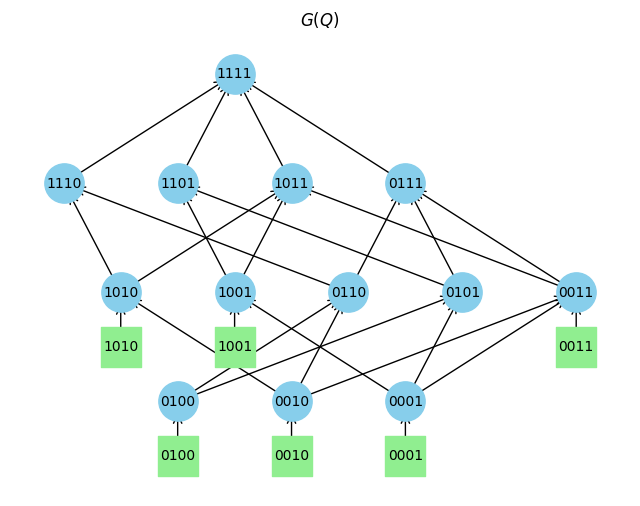

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


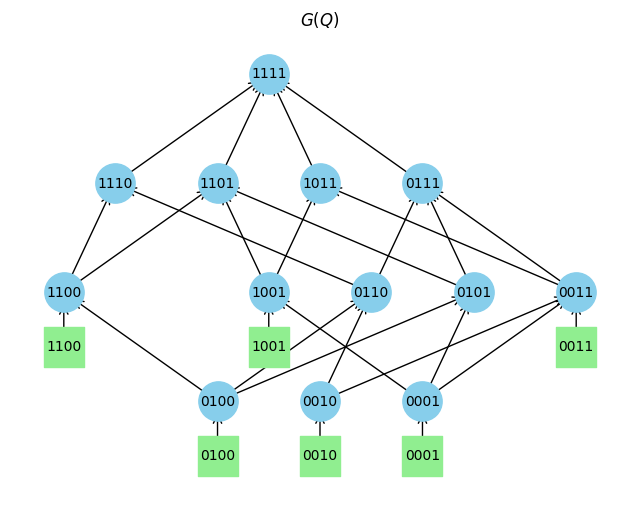

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


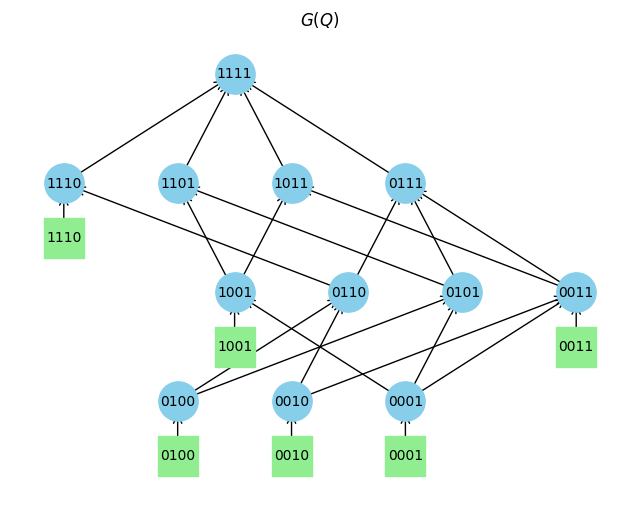

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


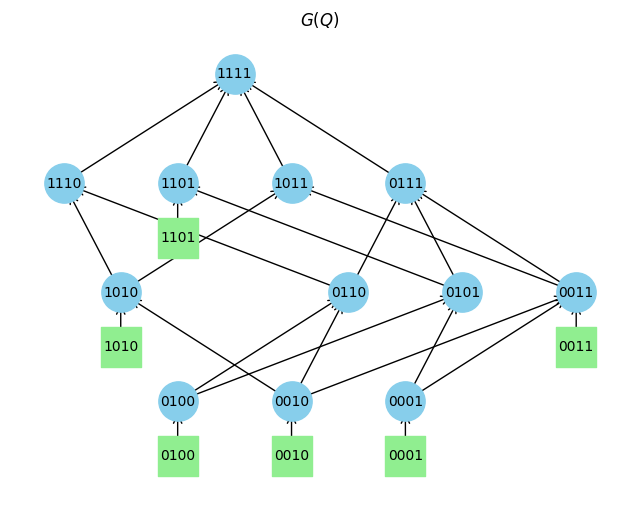

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


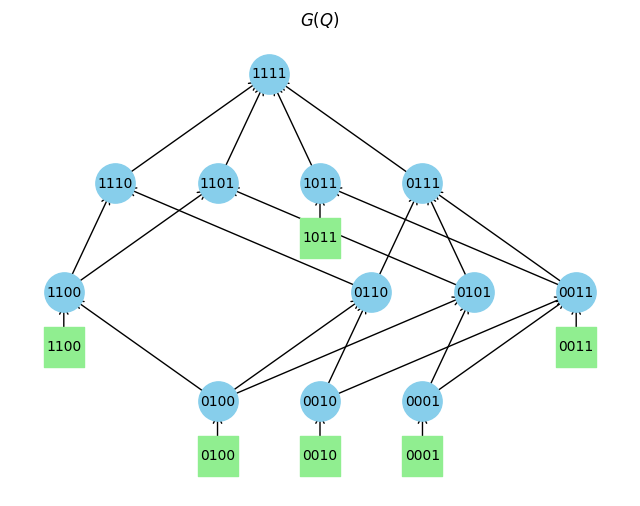

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (zero column).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is ident

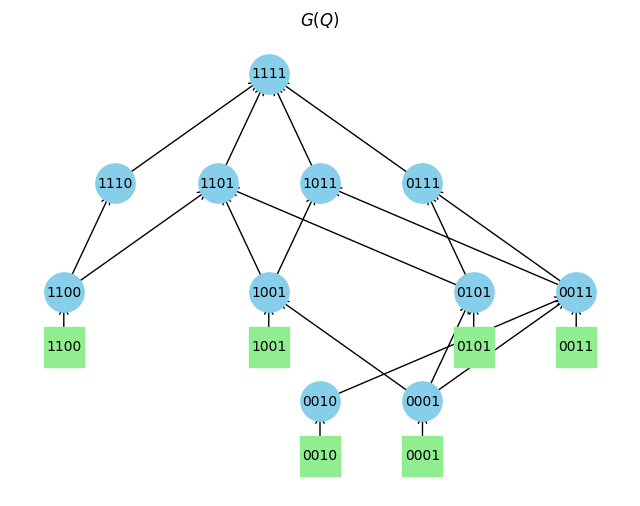

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


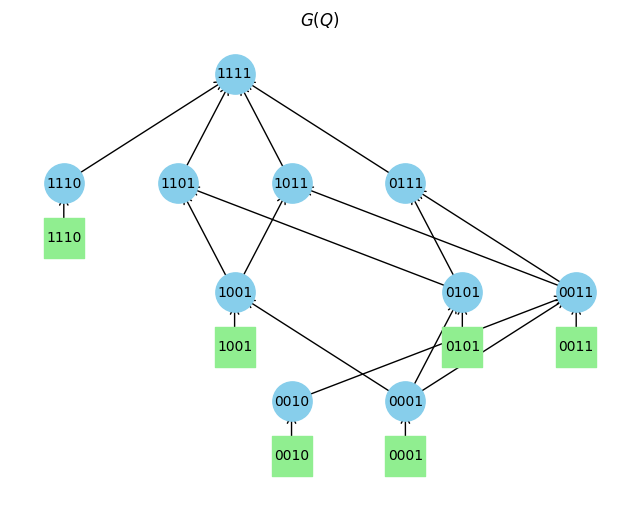

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


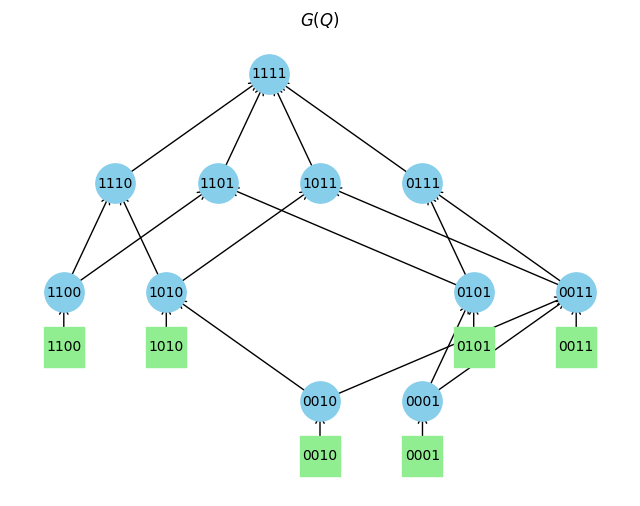

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


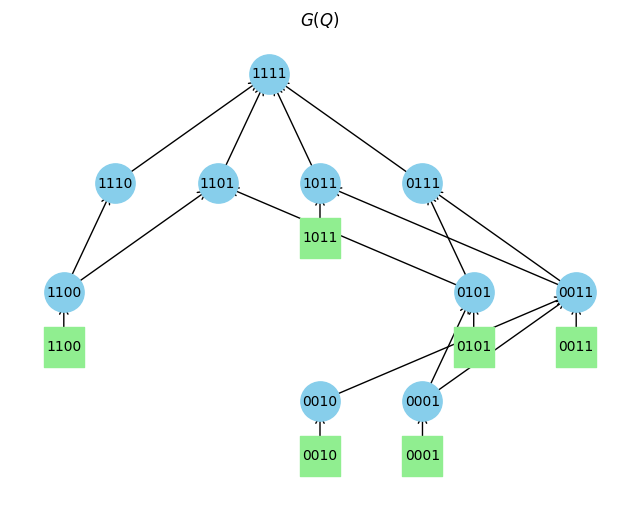

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


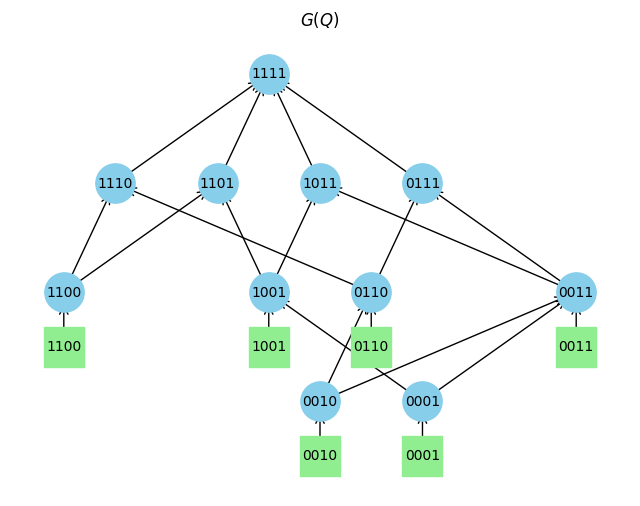

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


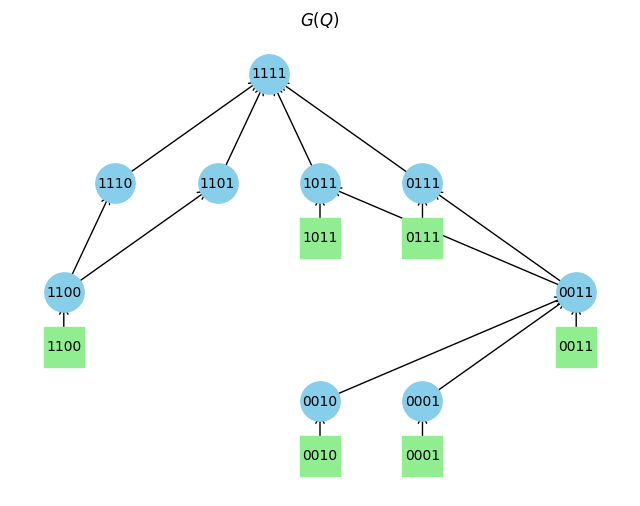

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable (direct_check).
Q is identifiable.
Q_reduced is identifiable (direct_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


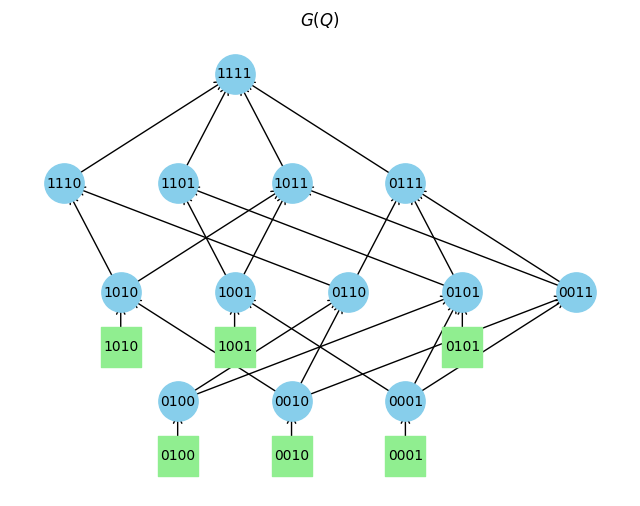

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable (direct_check).
Q is identifiable.
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable (direct_check).
Q is identifiable.
Q_reduced is identifiable (direct_check).
Q is identifiable.
Q_reduced is identifiable (direct_check).
Q is identifiable.
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


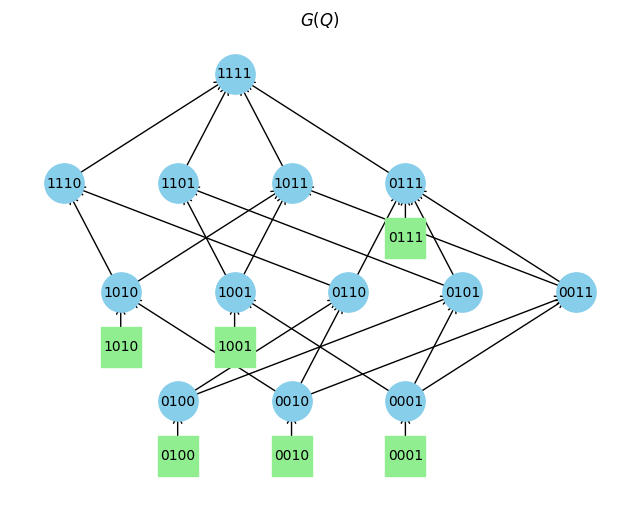

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


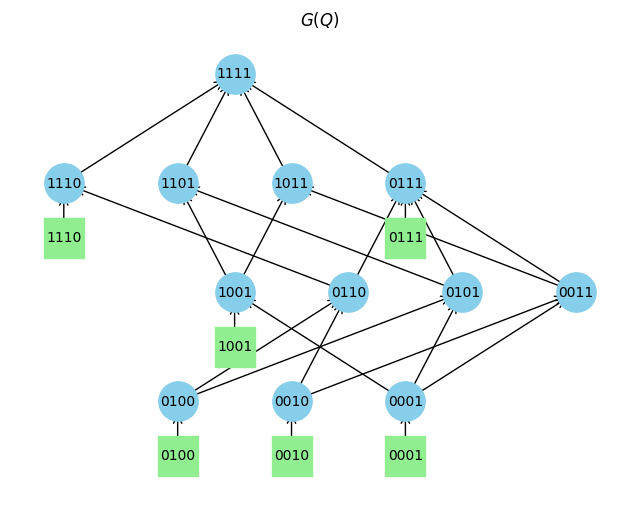

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


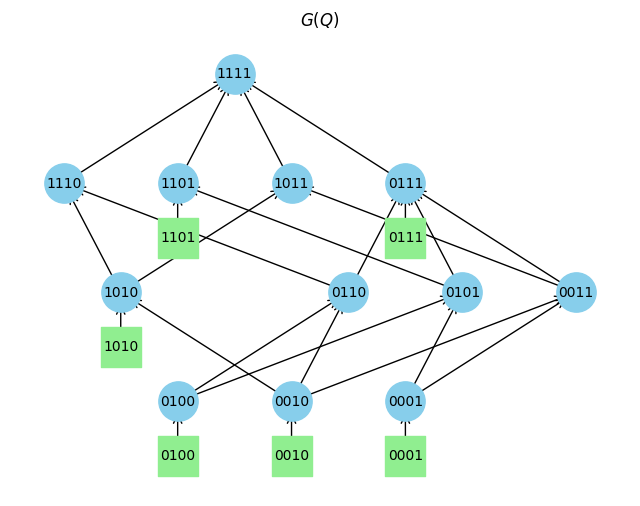

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


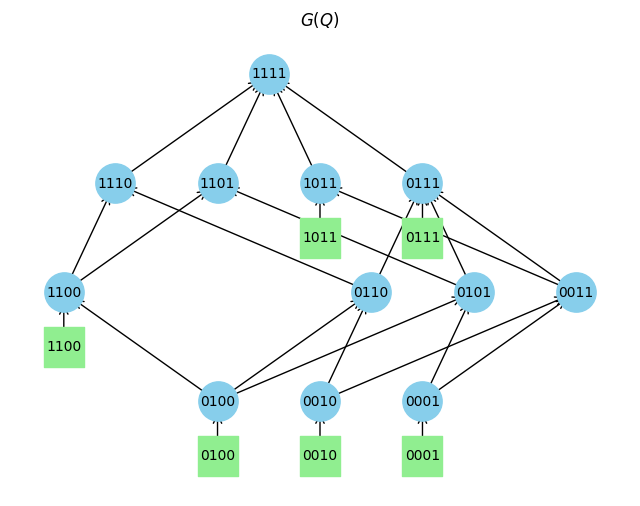

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


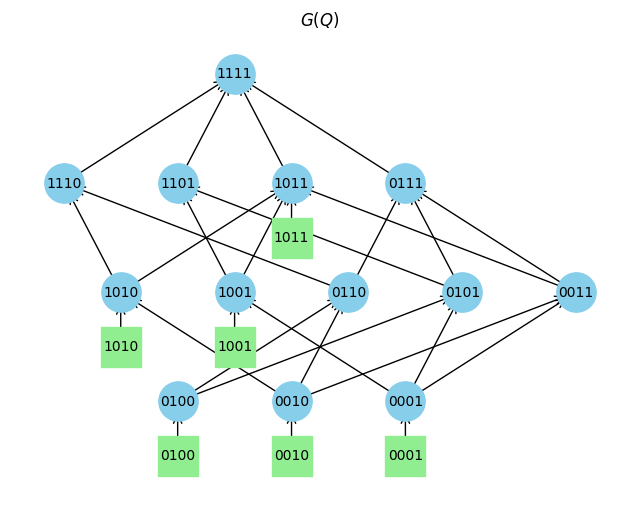

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


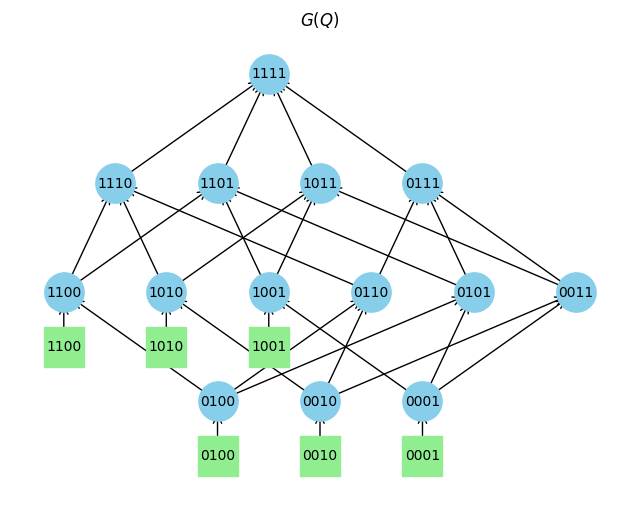

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


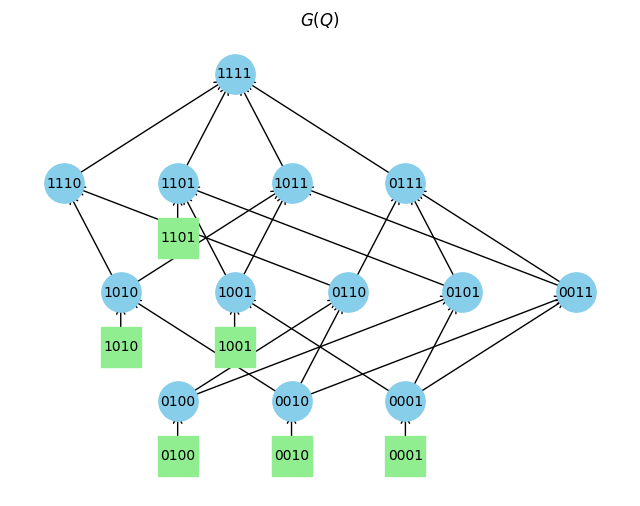

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


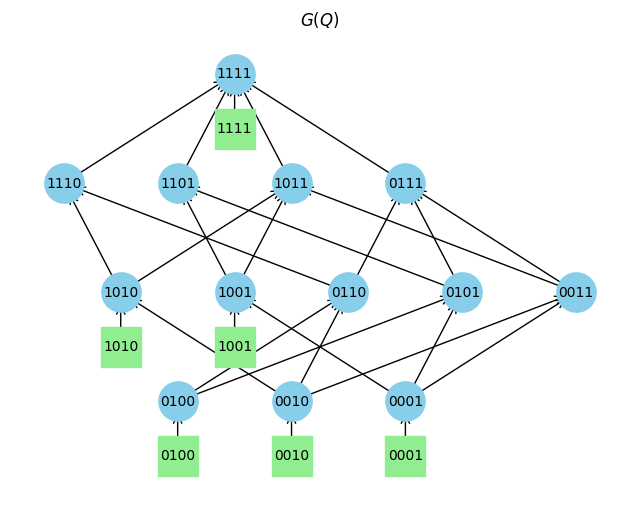

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


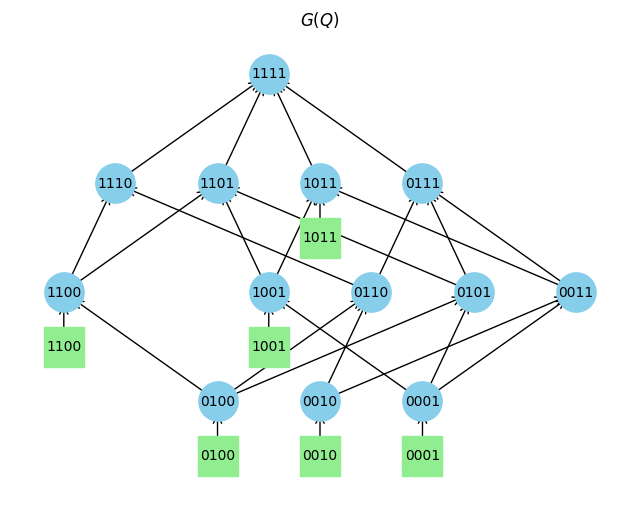

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


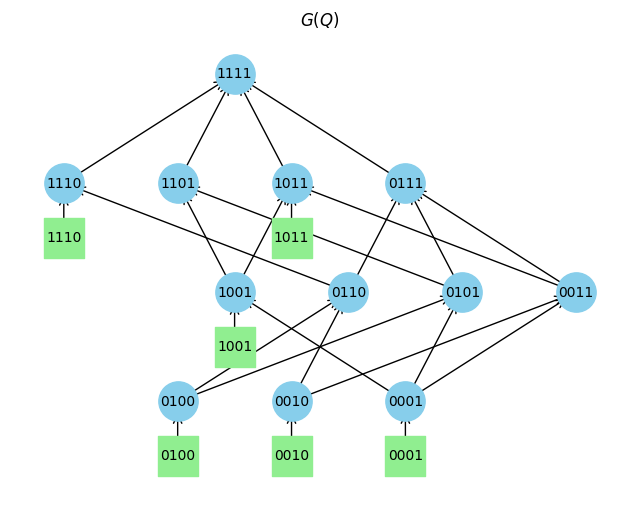

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


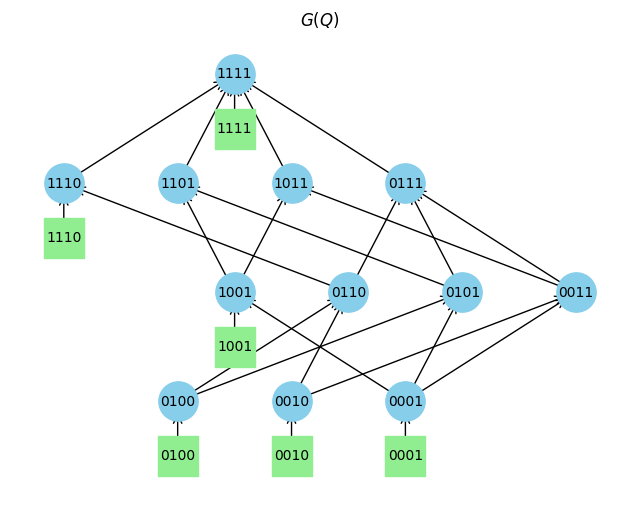

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


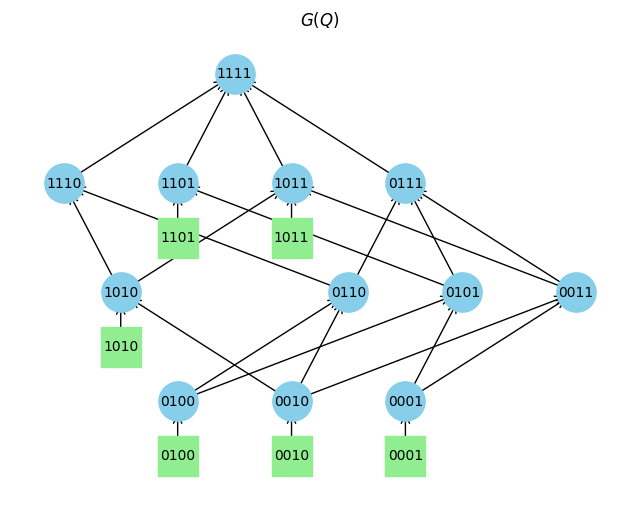

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


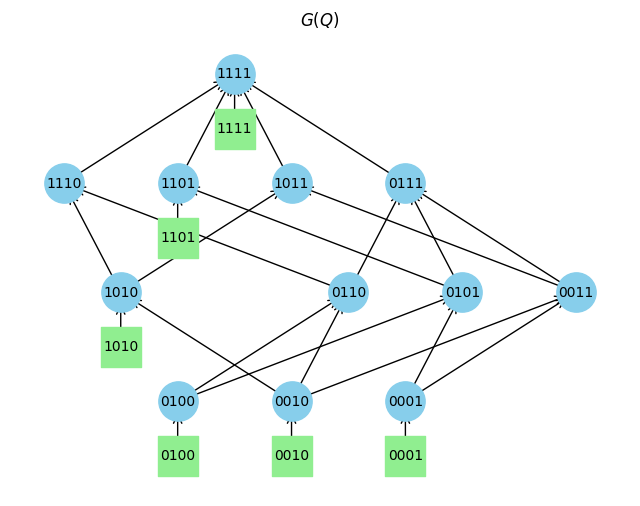

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


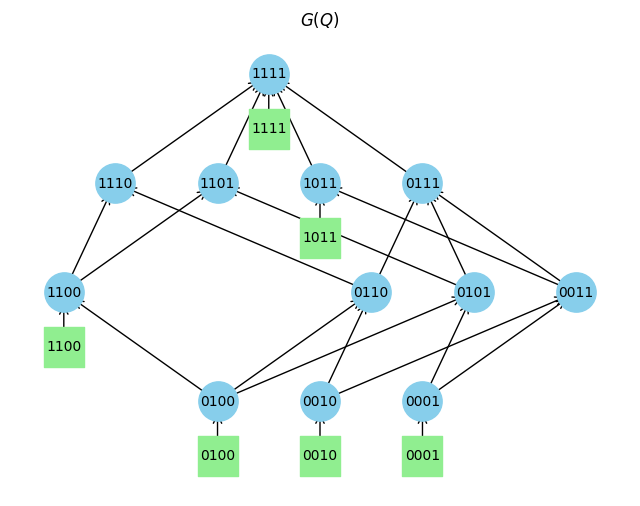

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


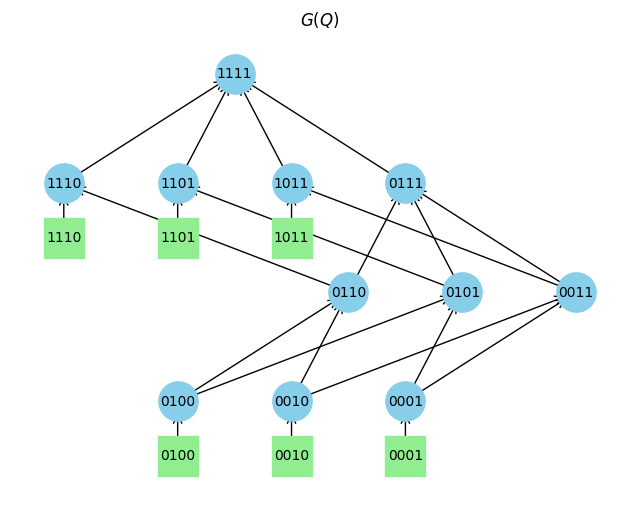

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


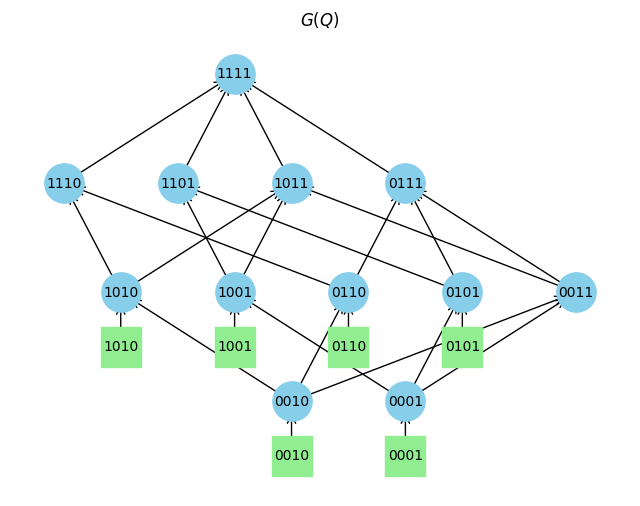

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


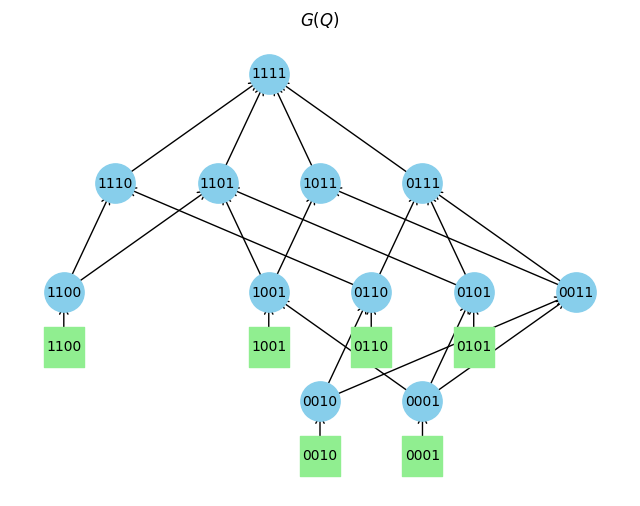

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


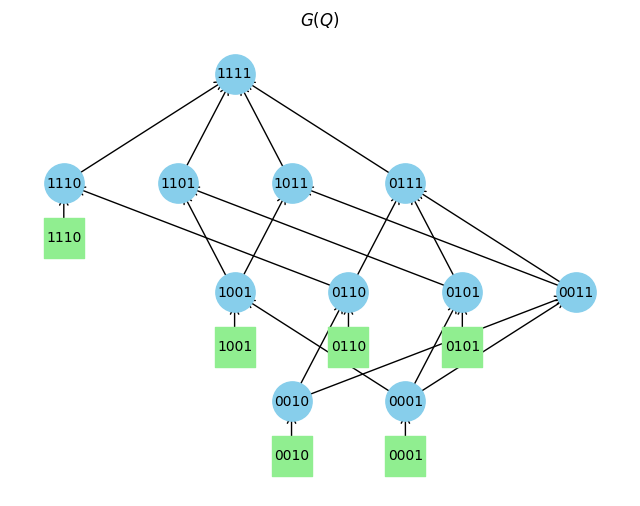

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


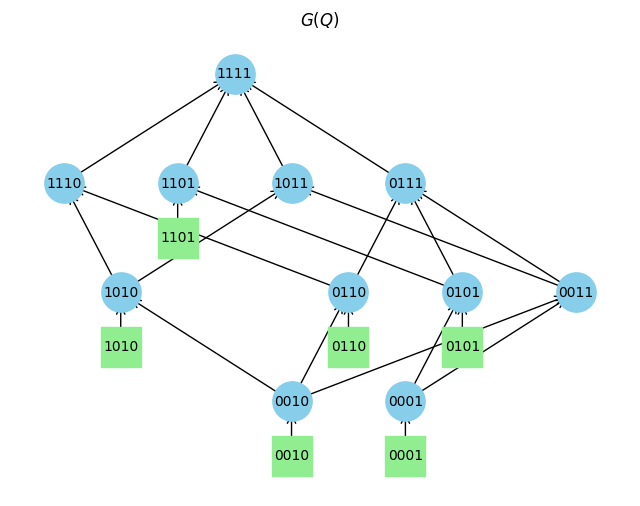

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


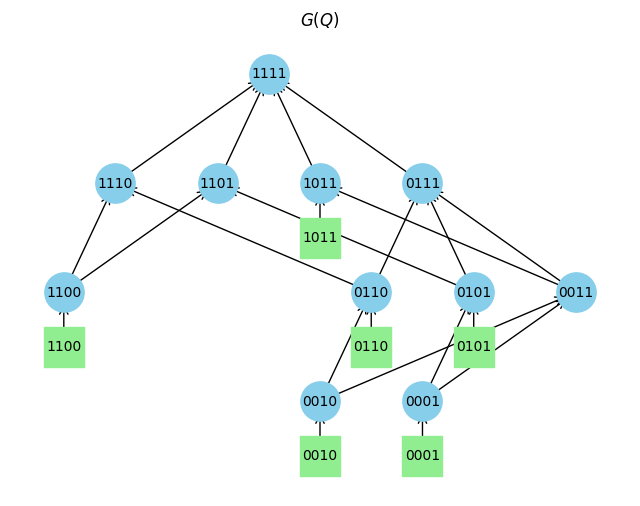

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


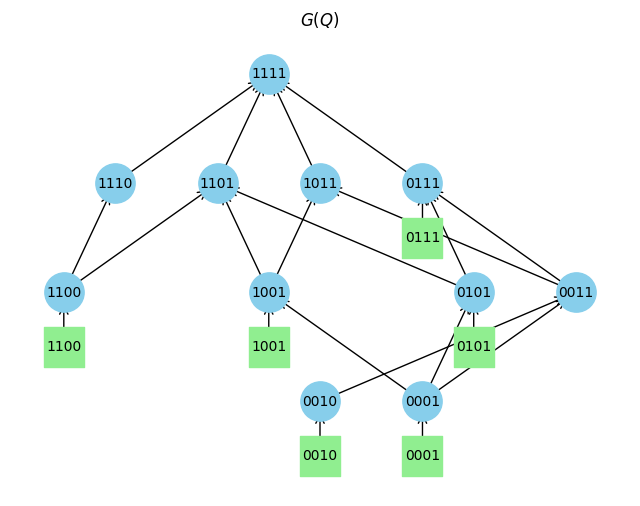

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


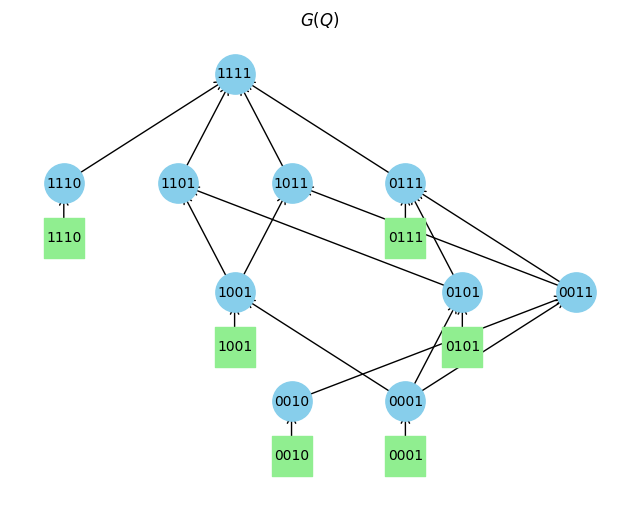

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


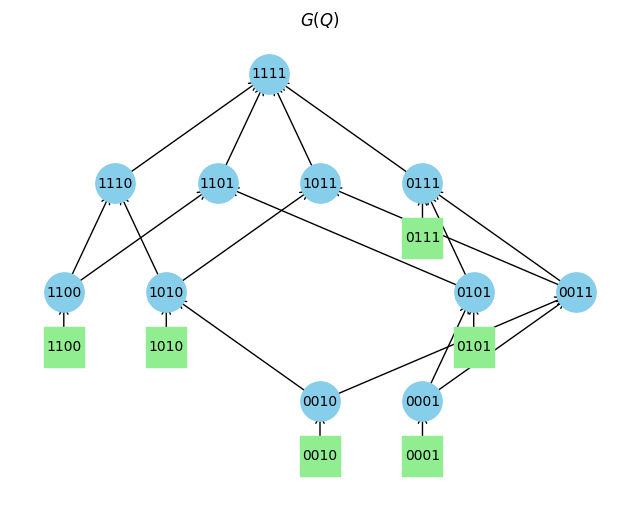

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


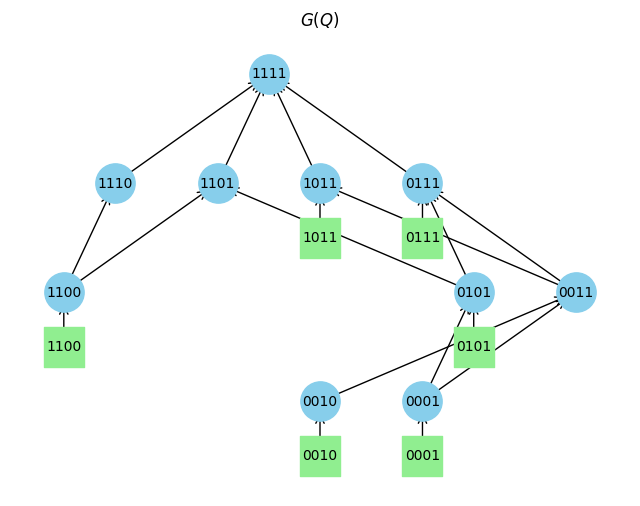

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


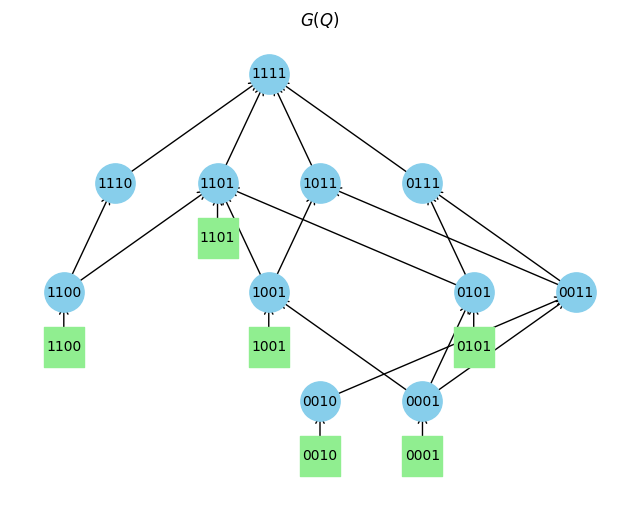

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


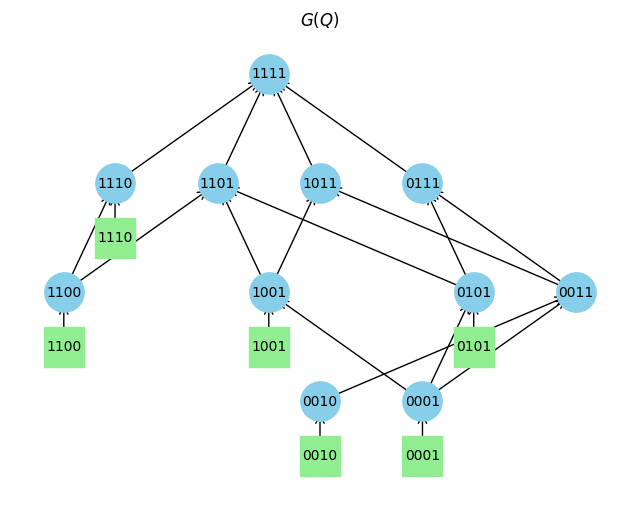

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


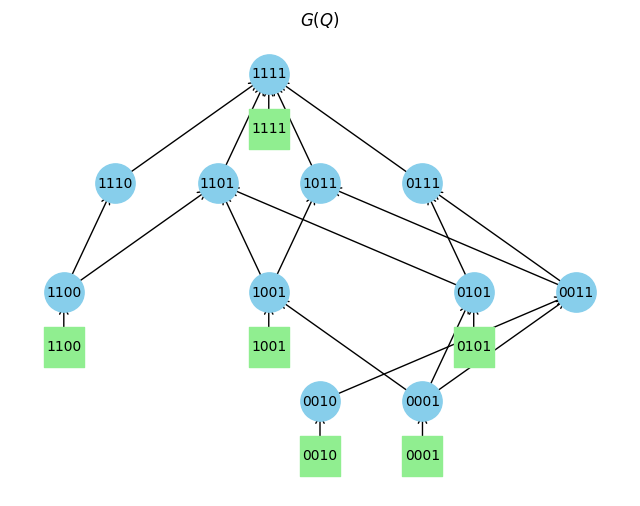

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


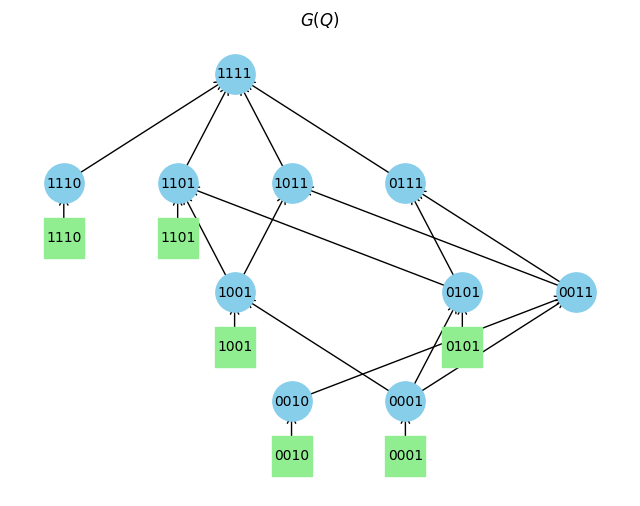

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


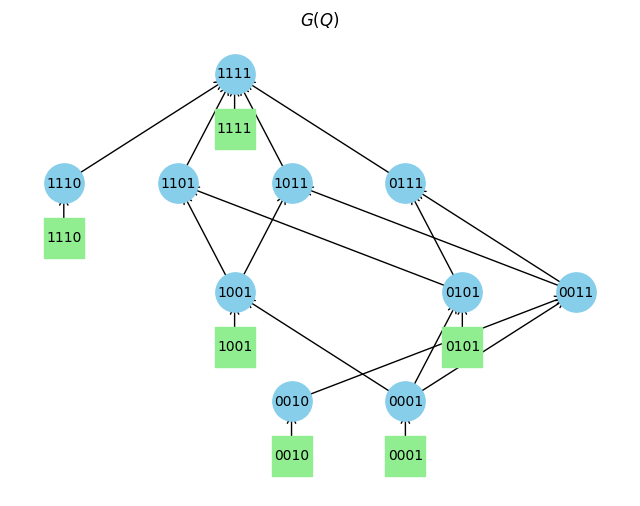

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


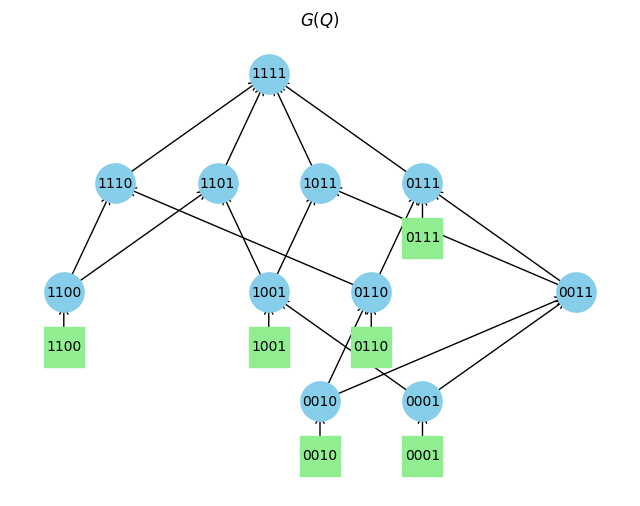

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


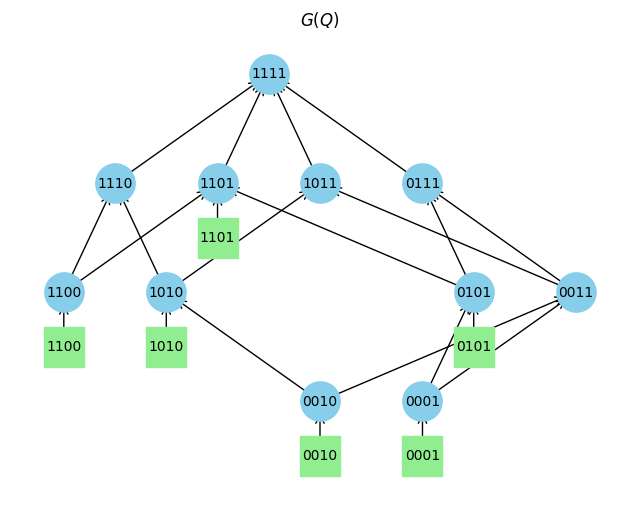

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


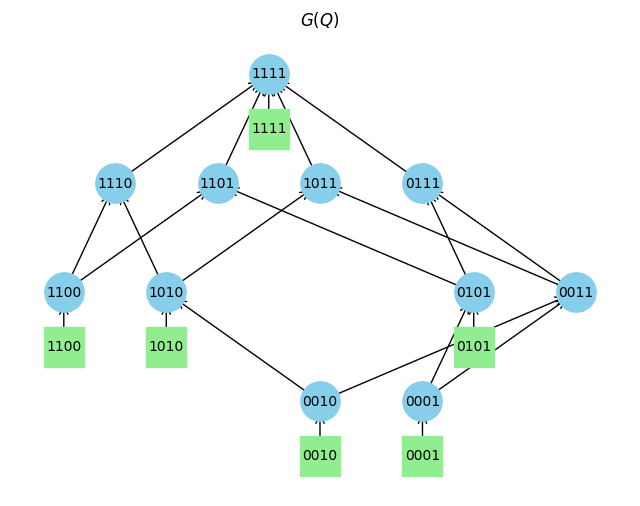

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


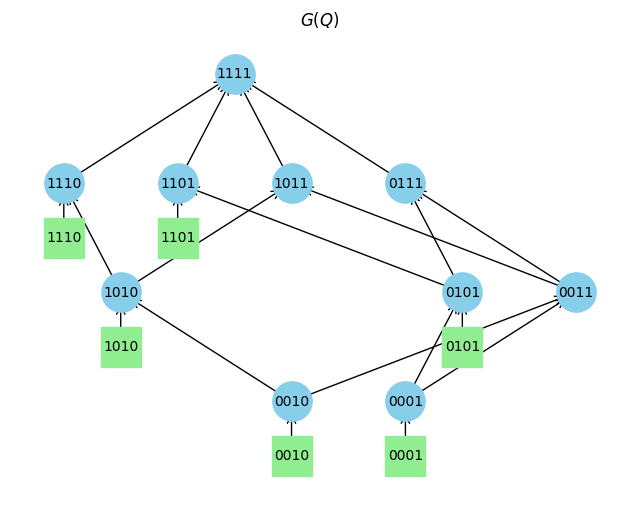

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


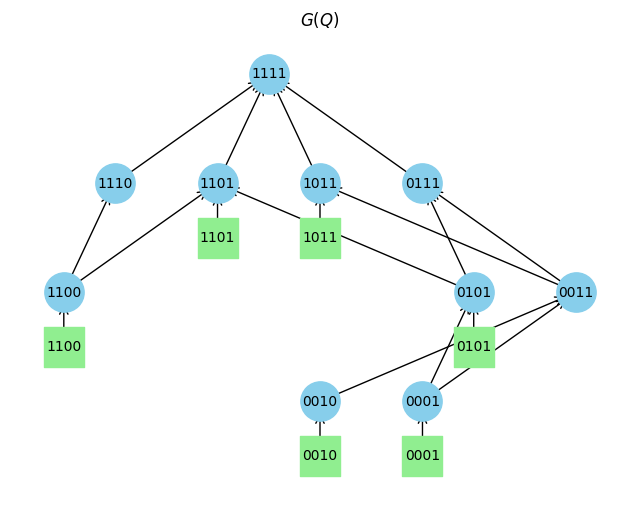

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


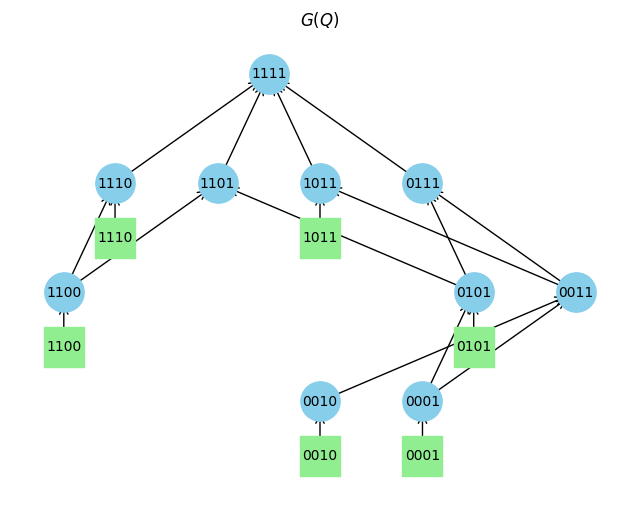

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


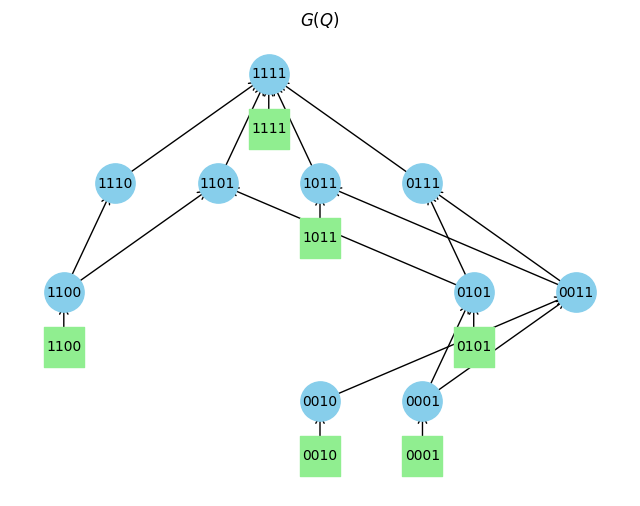

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


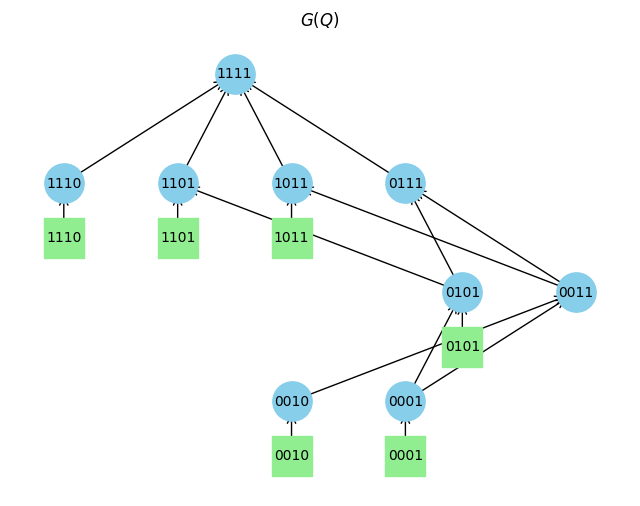

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


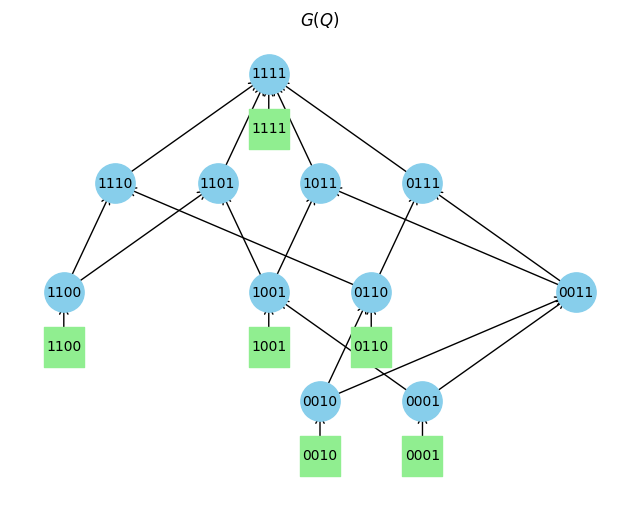

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


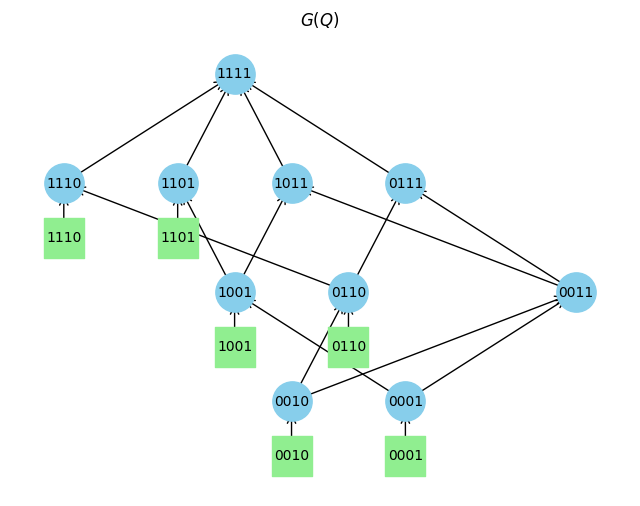

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


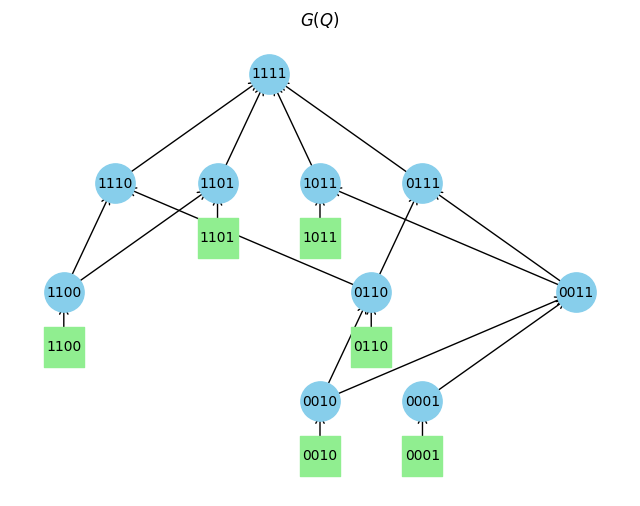

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


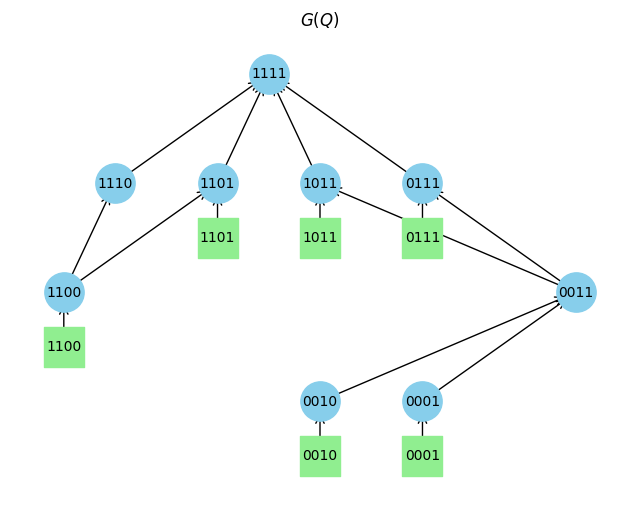

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


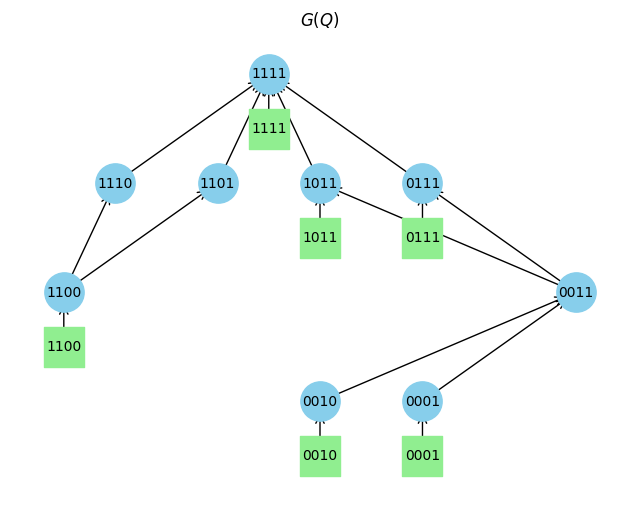

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


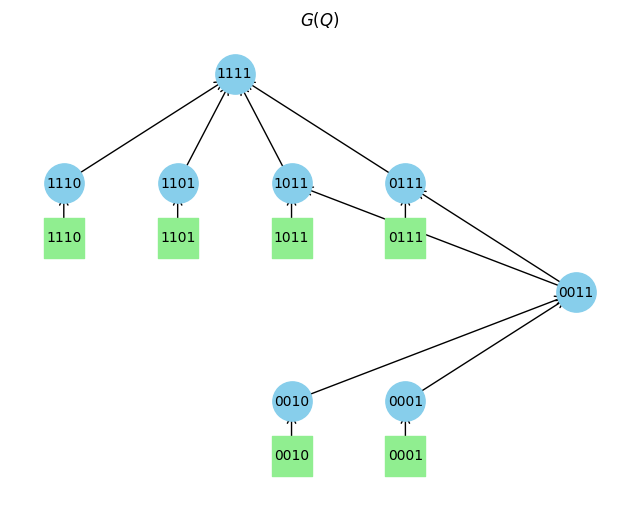

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


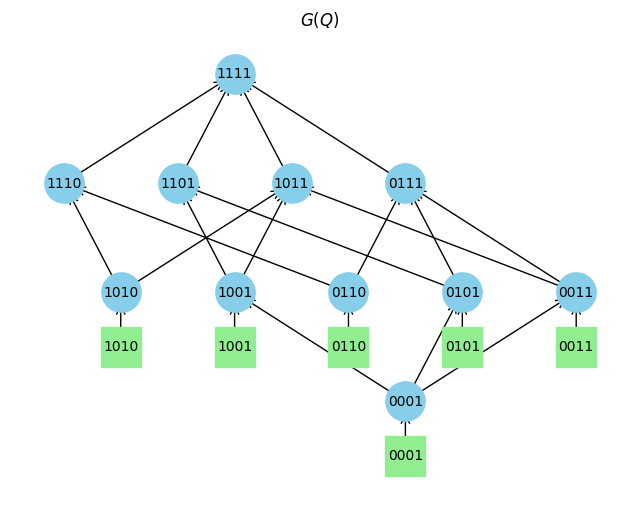

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


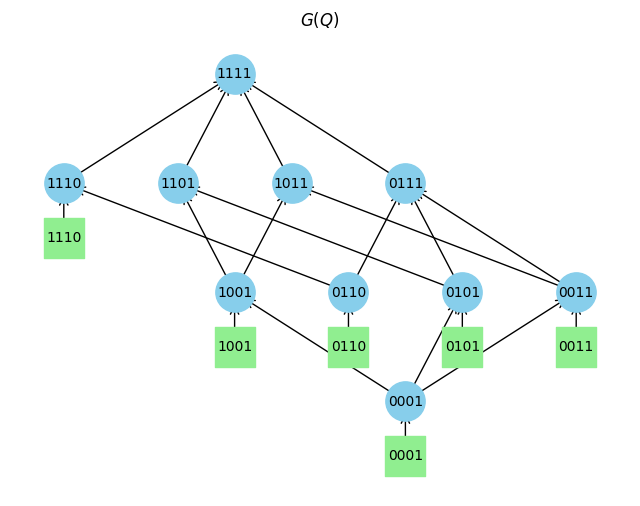

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


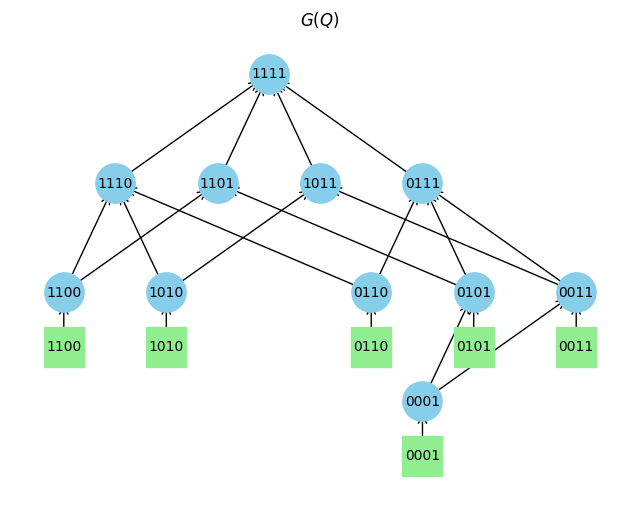

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


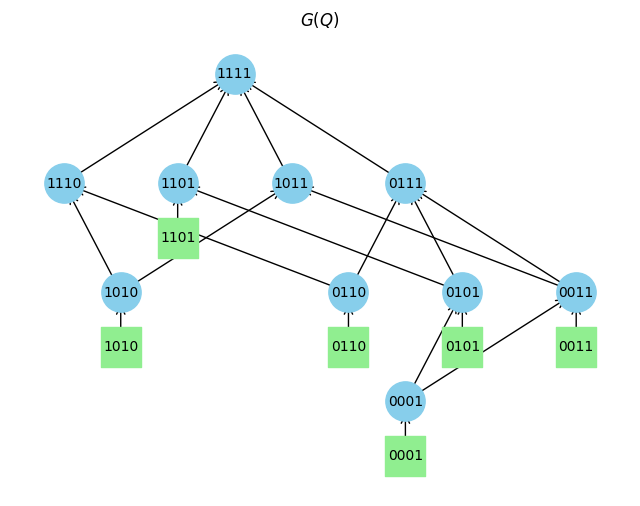

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


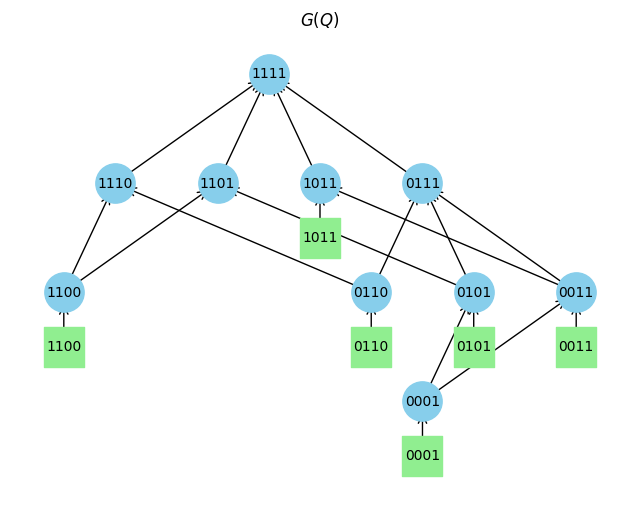

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (one column).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


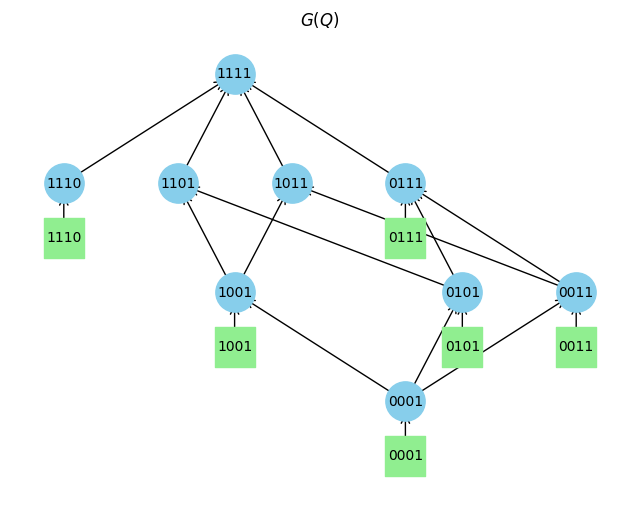

Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


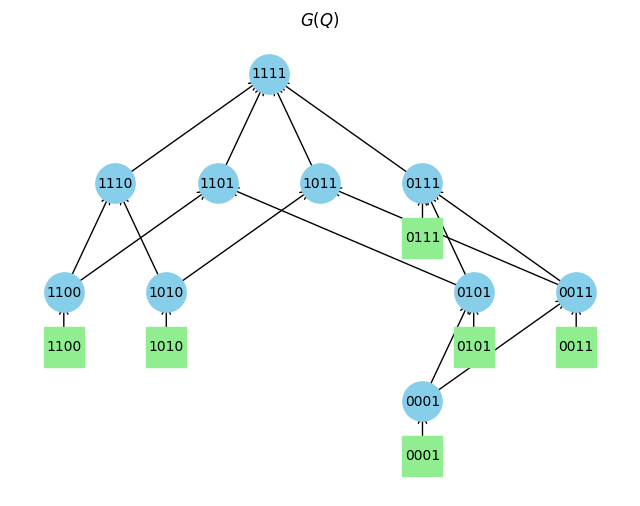

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


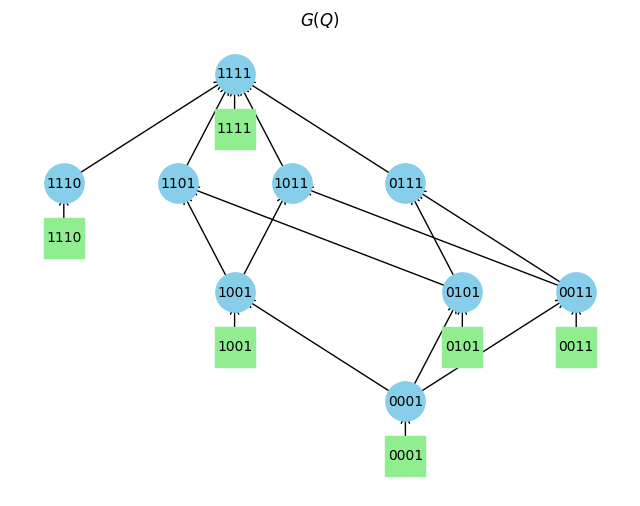

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


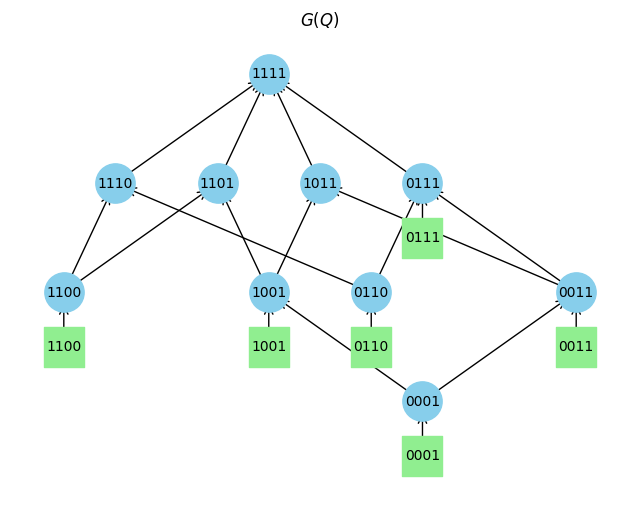

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


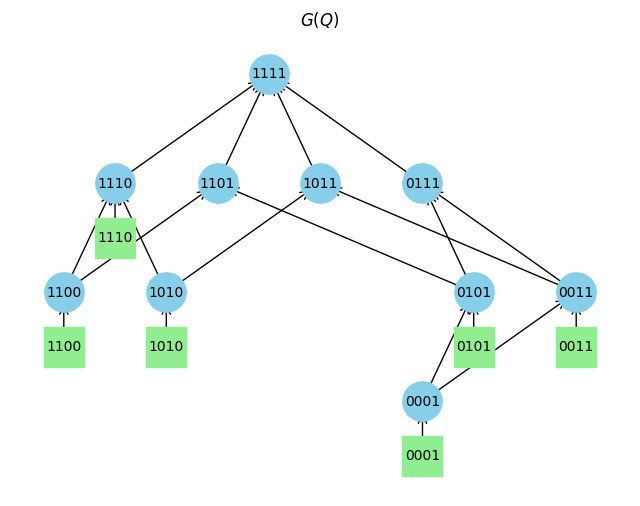

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


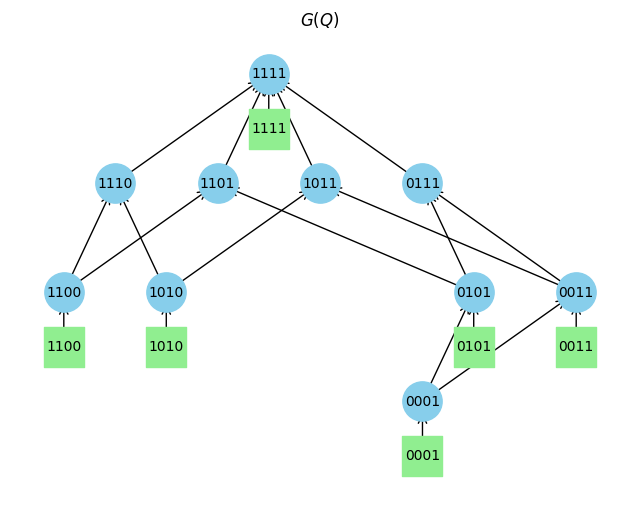

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


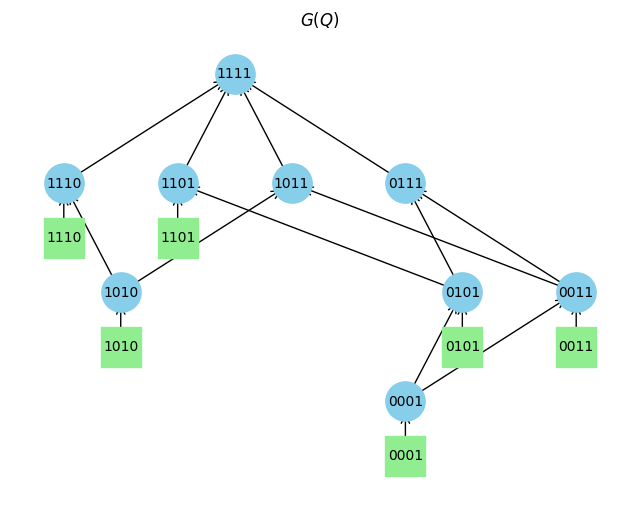

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


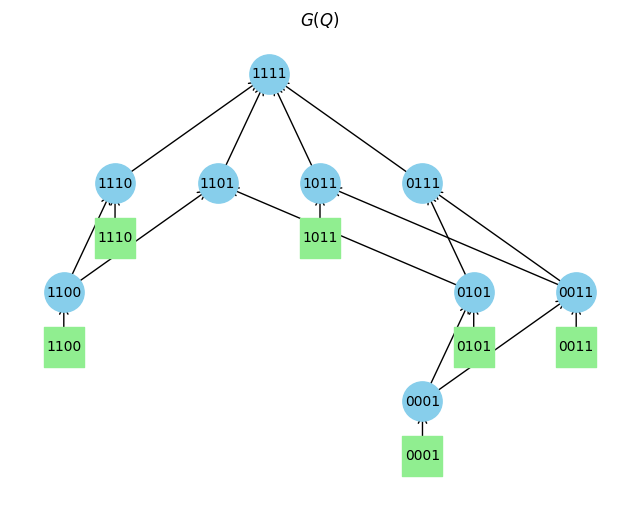

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


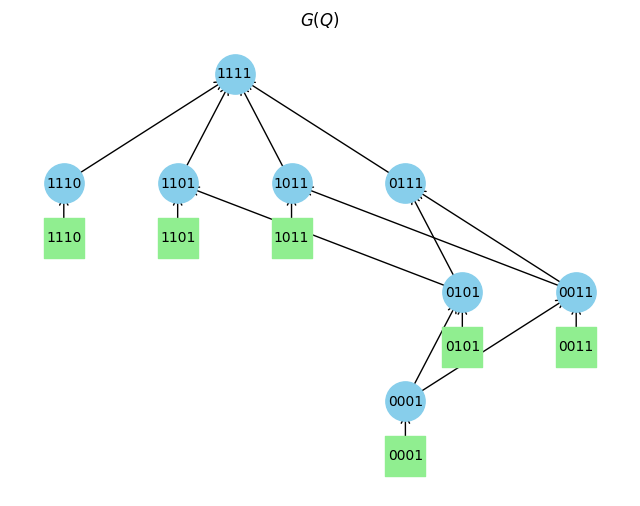

Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


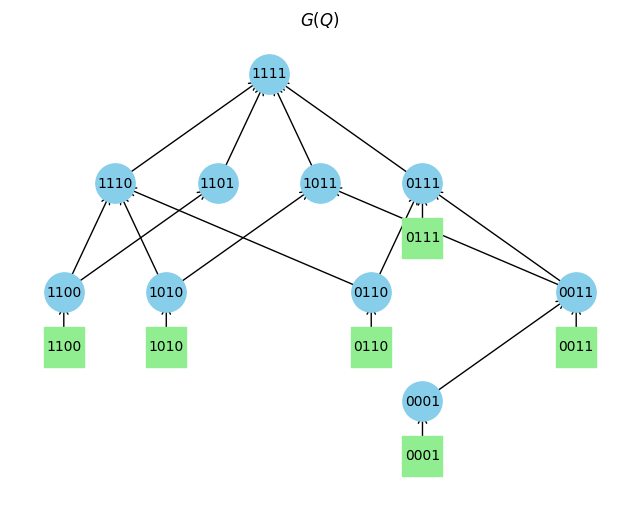

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


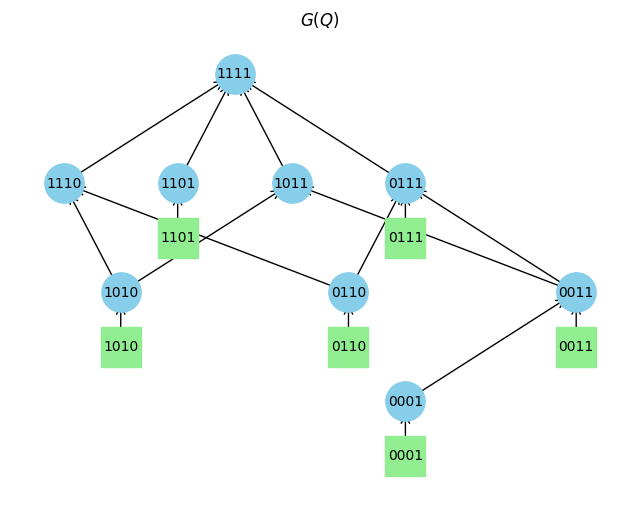

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


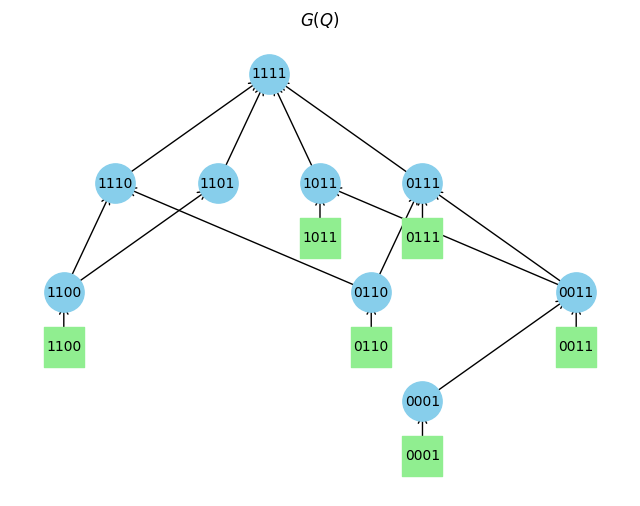

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


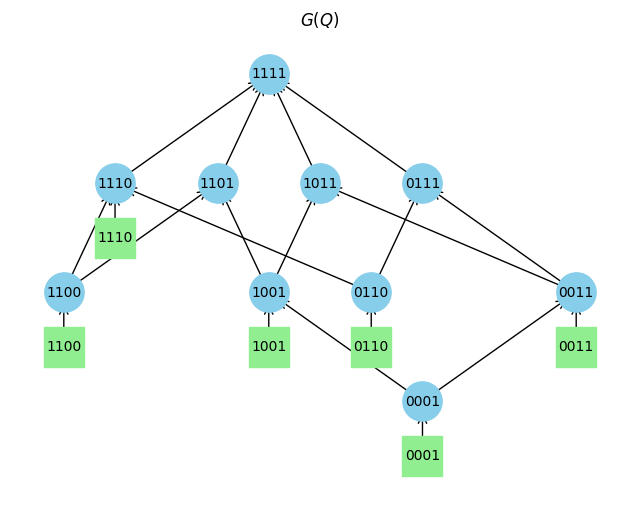

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


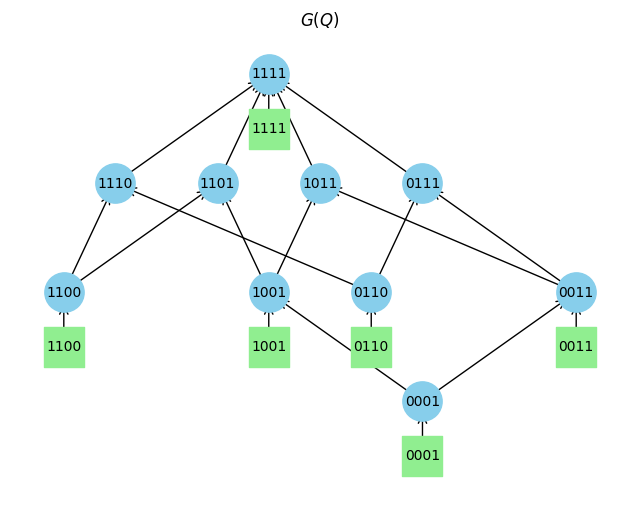

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


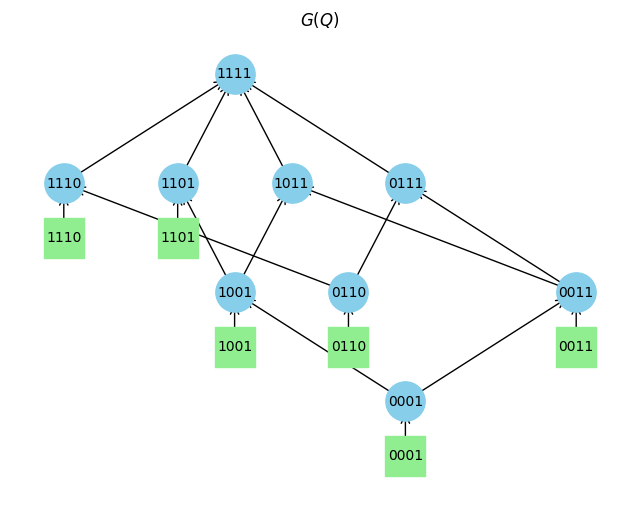

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


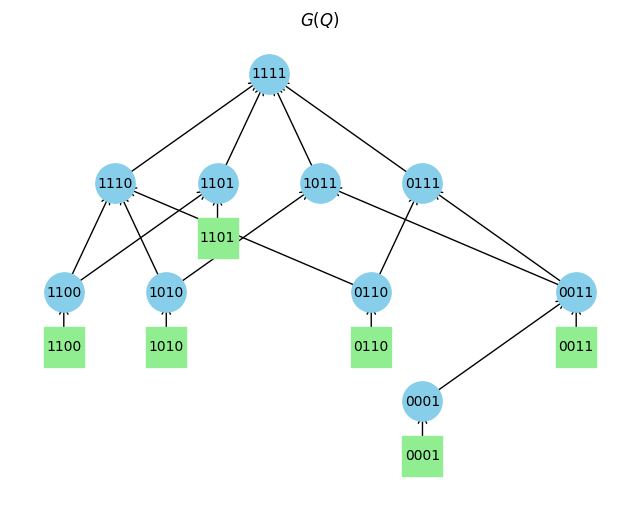

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


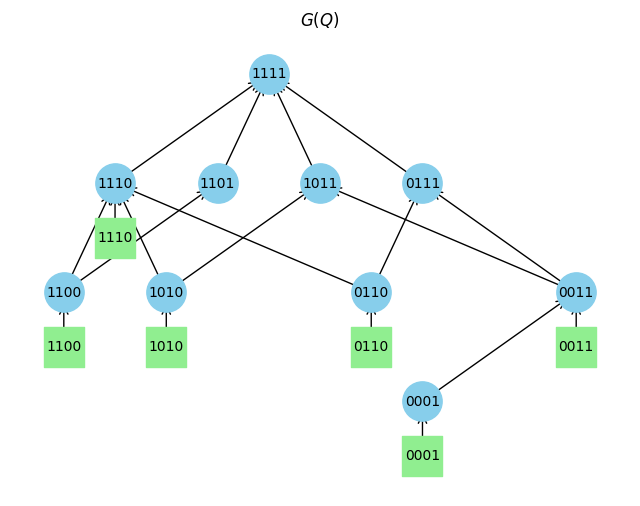

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


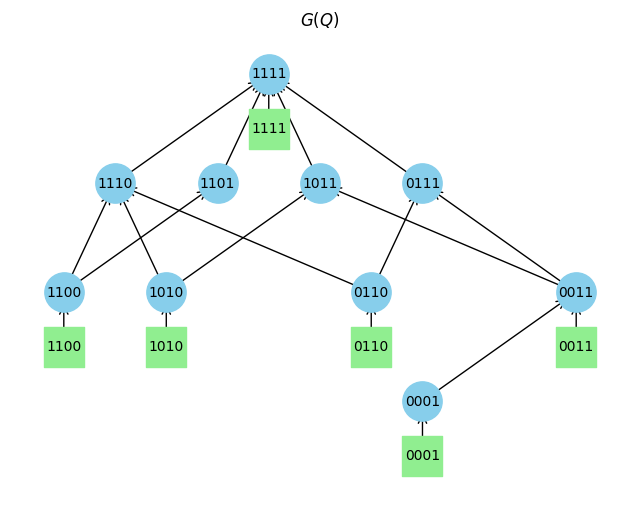

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


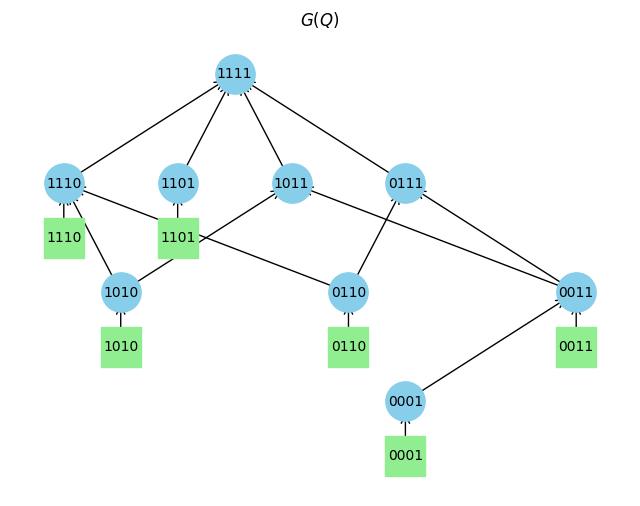

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


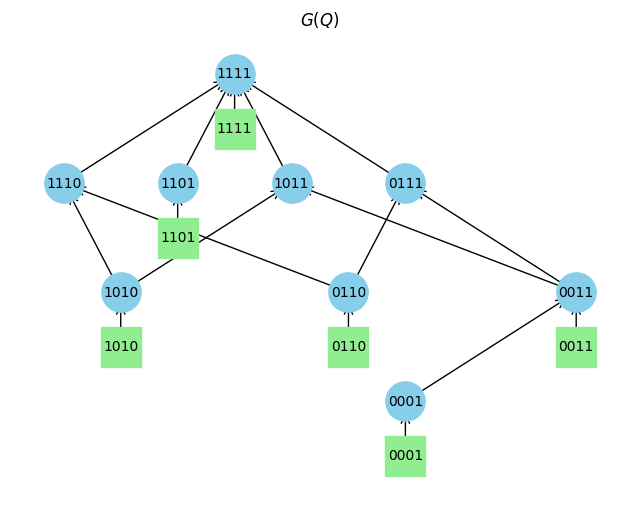

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


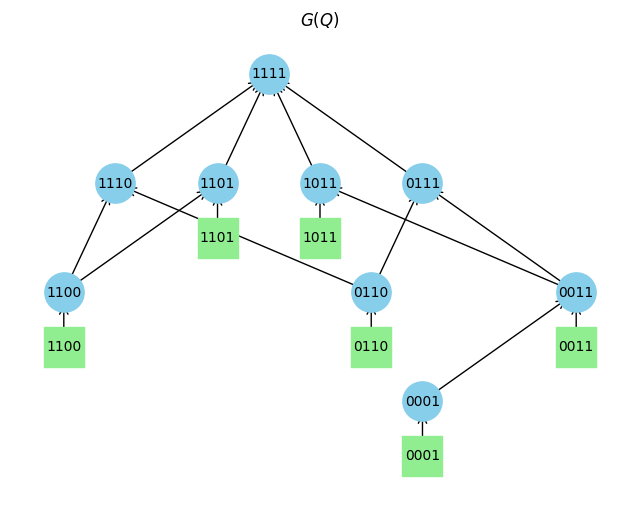

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


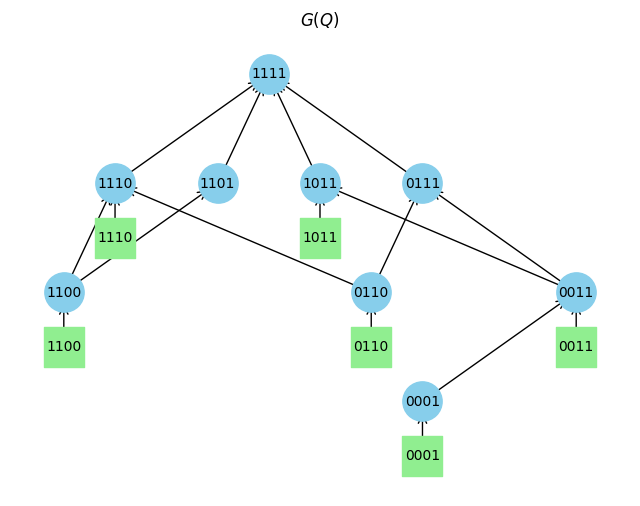

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


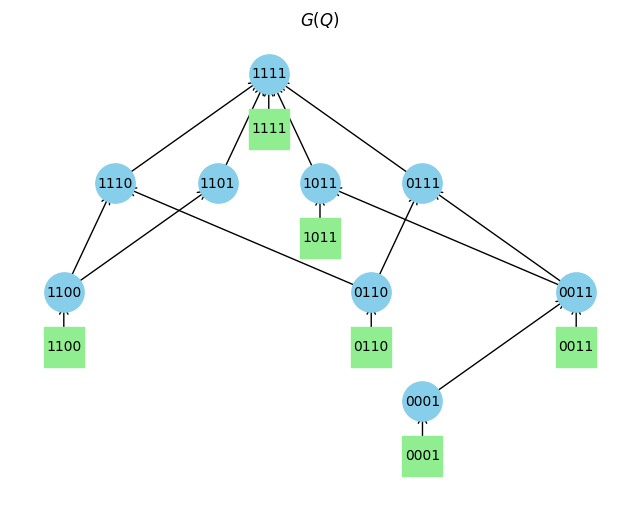

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


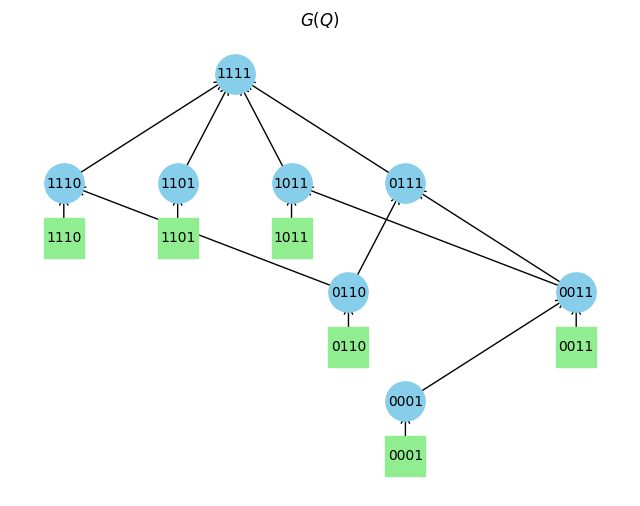

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


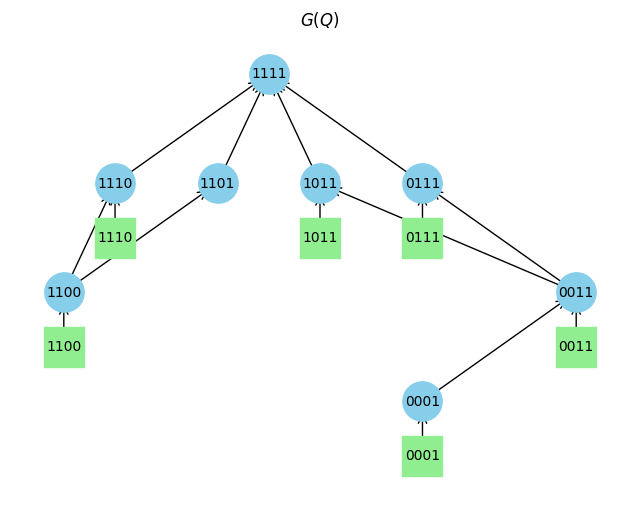

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


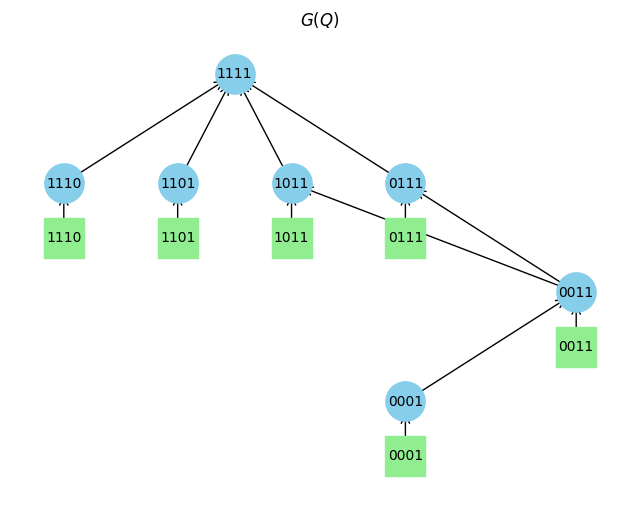

Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


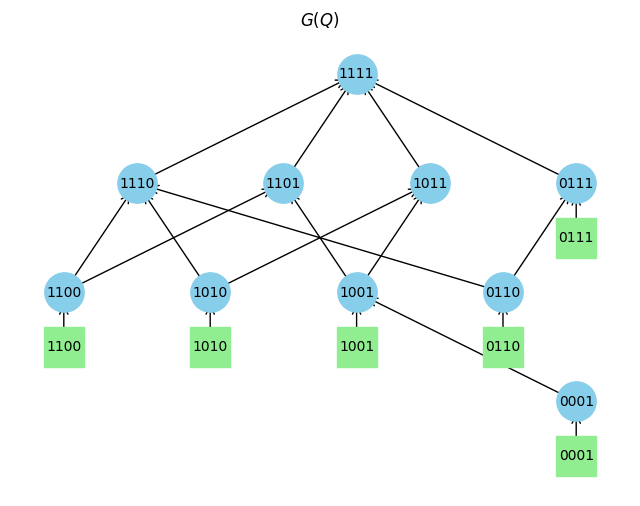

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


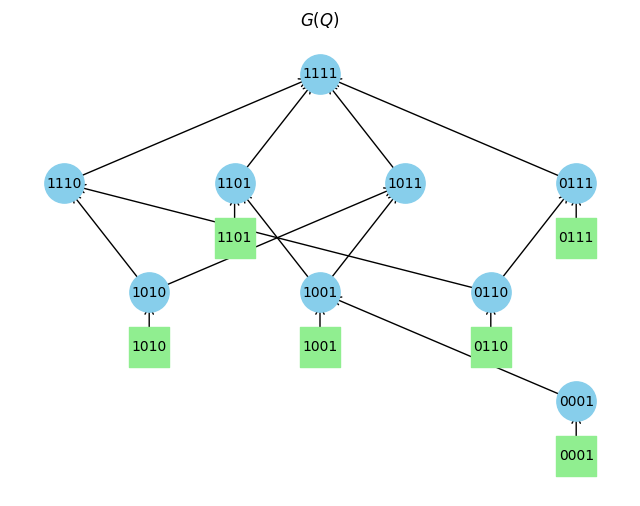

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (three-column check).
Q_reduced is not identifiable (three-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (three-column check).
Q_reduced is not identifiable (three-column check).
Q_reduced is not identifiable (three-column check).
Q_reduced is not identifiable (three-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (three-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (three-column check).
Q_reduced is not identifiable (three-column check).
Q_reduced is not identifiable (t

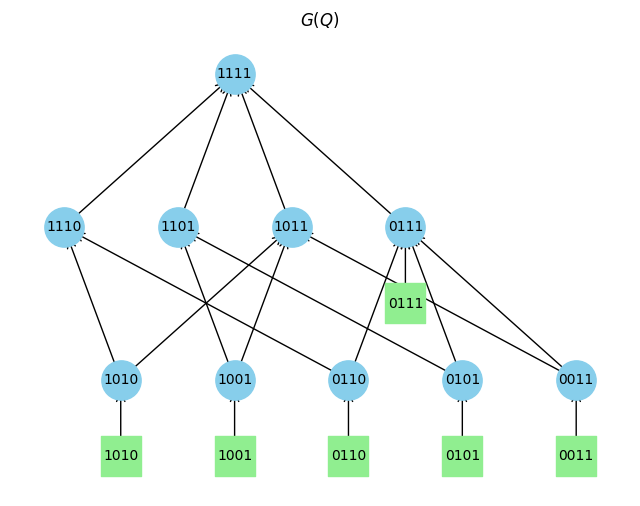

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


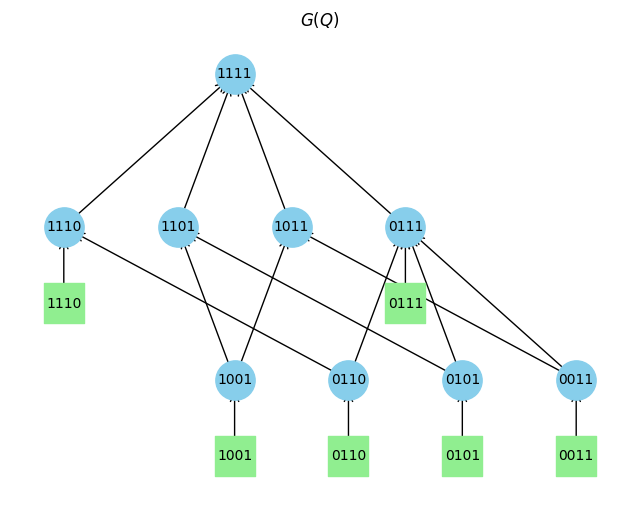

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


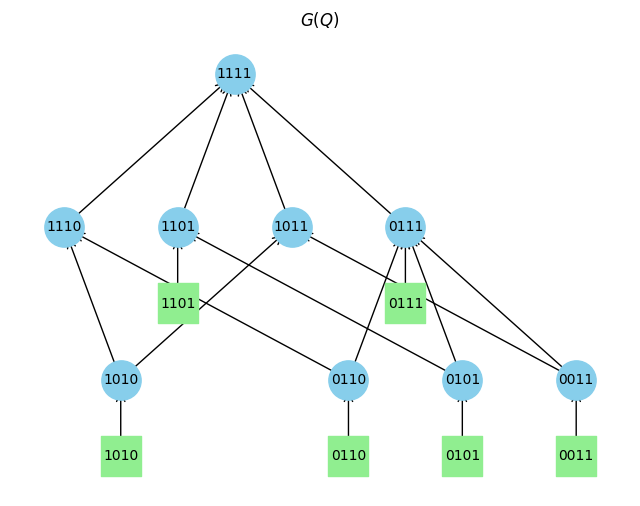

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


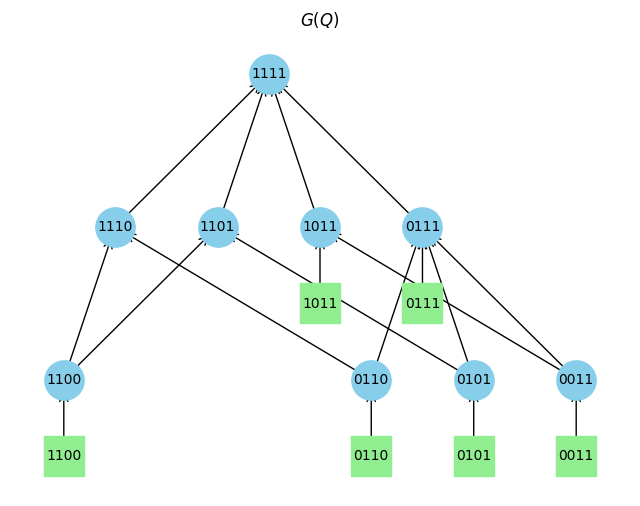

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


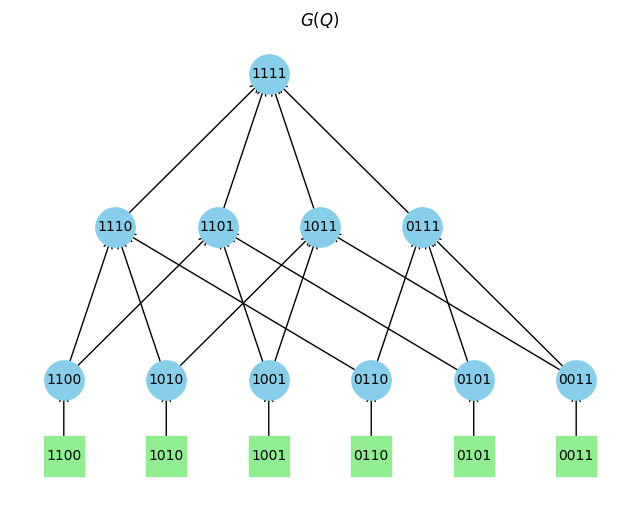

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


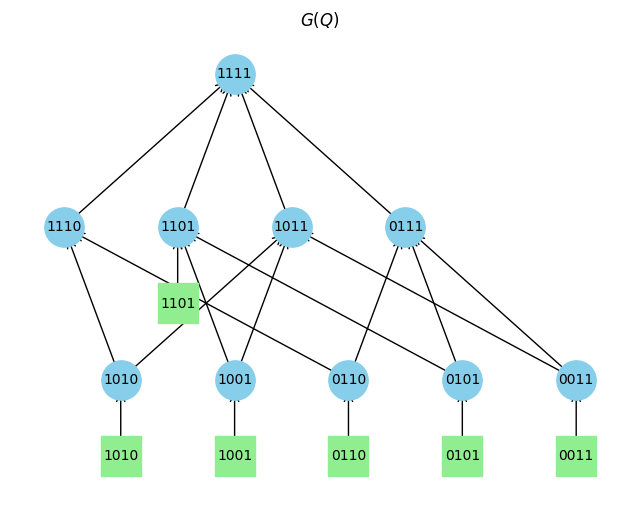

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


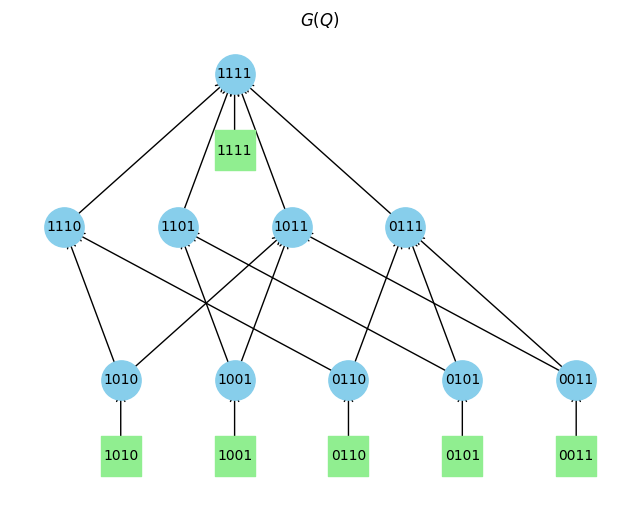

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


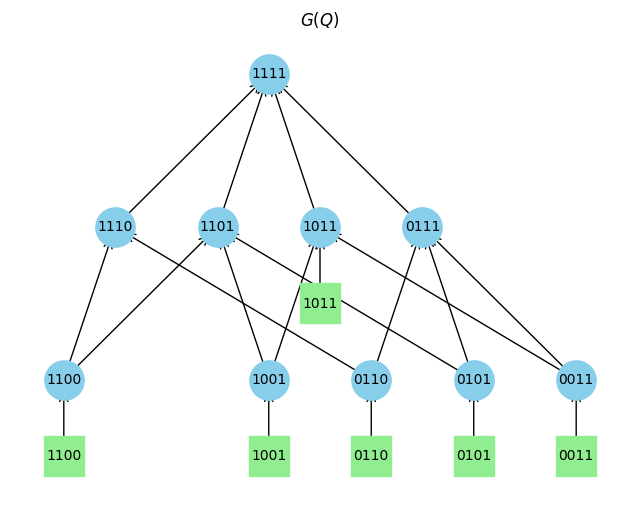

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


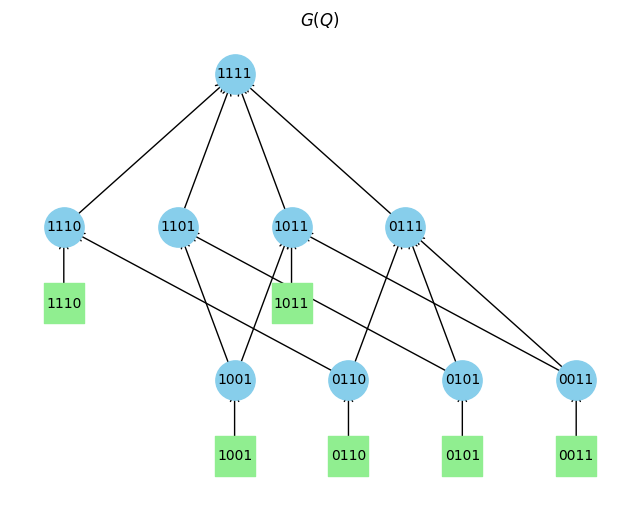

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


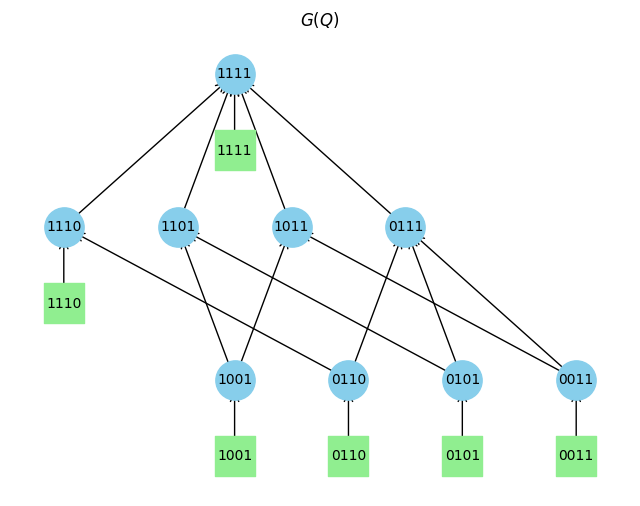

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


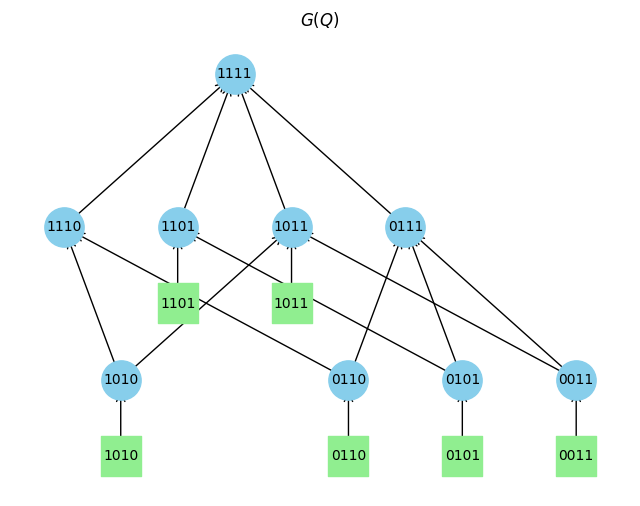

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


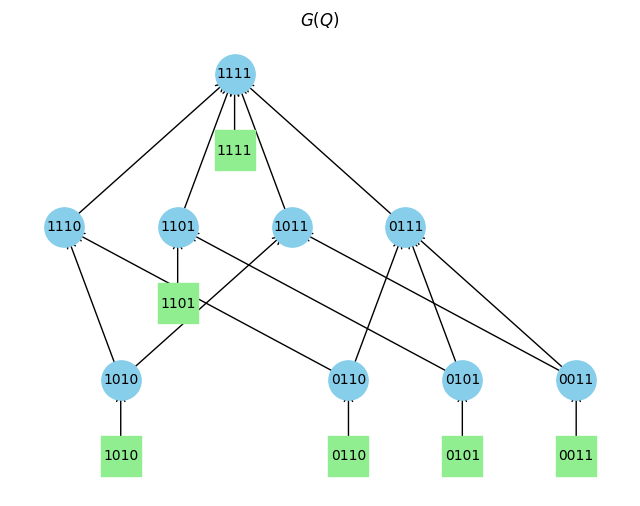

Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


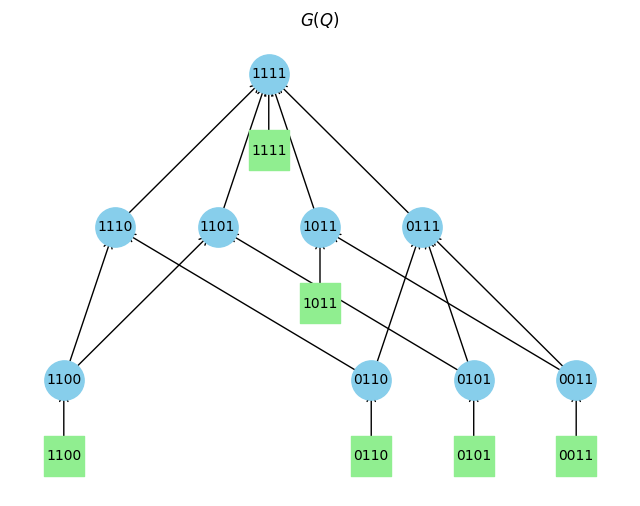

Q_reduced is not identifiable (three-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


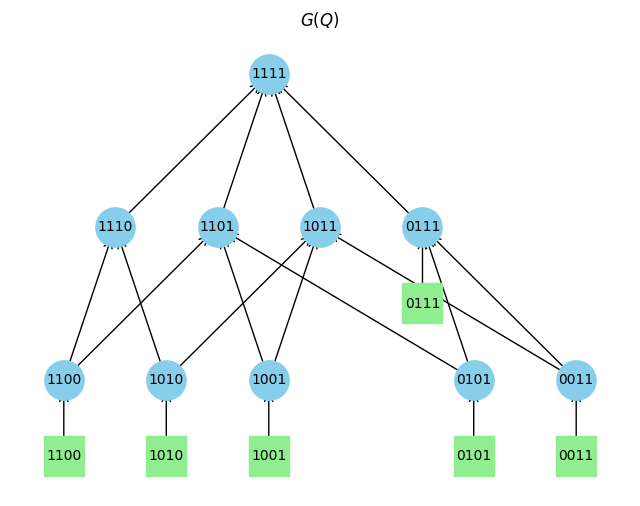

Q_reduced is not identifiable (two-column check).
Q_reduced is identifiable.
Q_reduced is identifiable (brute_check).
Q is identifiable.


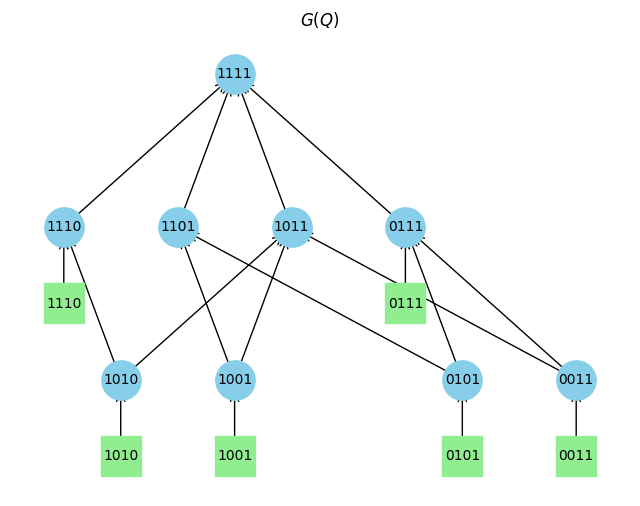

Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable.
Q_reduced is not identifiable (brute_check_id).
Q_reduced is trivially not identifiable (one column).
Q_reduced is not identifiable.
Q_reduced is not identifiable (brute_check_id).
Q_reduced is not identifiable.
Q_reduced is not identifiable (brute_check_id).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable.
Q_reduced is not identifiable (brute_check_id).
Q_reduced is not identifiable.
Q_reduced is not identifiable (brute_check_id).
Q_reduced is not identifiable.
Q_reduced is not identifiable (brute_check_id).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable (two-column check).
Q_reduced is not identifiable.
Q_reduced is not identifiable (brute_

In [50]:
id_Q64 = []
id_Q64_withoutI = []
nid_Q64_id2 = []
nid_Q64_id3 = []
nid_Q64_ncol = []
for Q in generate_canonical_matrices(6, 4):
    idd, Q_bar = identifiability(Q = Q)
    if idd:
        id_Q64.append(Q)
        if not contains_identity_submatrix(Q):
            id_Q64_withoutI.append(Q)
            draw_G_K4(Q)

In [51]:
len(id_Q64_withoutI)

103

In [53]:
len(id_Q64)

114

In [52]:
len(generate_canonical_matrices(6, 4))

372

Q is trivially not identifiable. Q contains a zero column.
Q is trivially not identifiable. Q contains a zero column.
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable


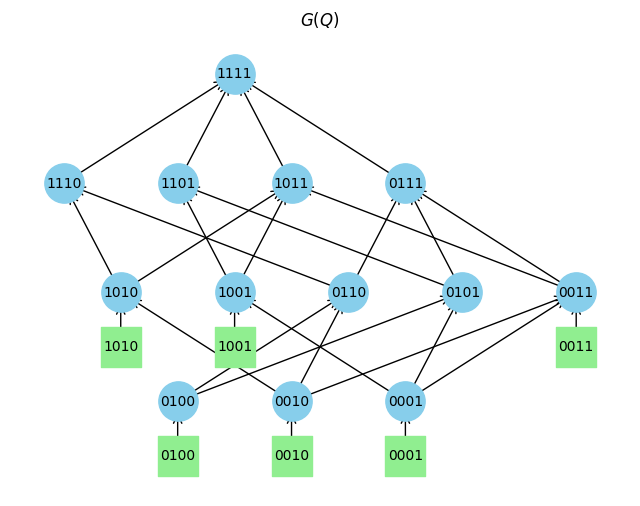

Q is identifiable


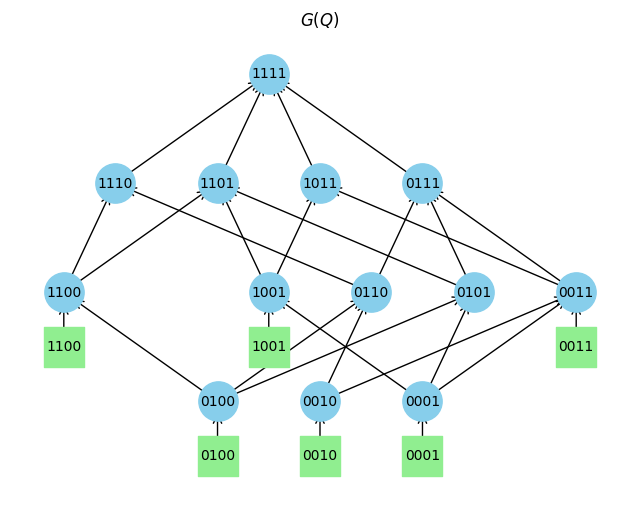

Q is identifiable


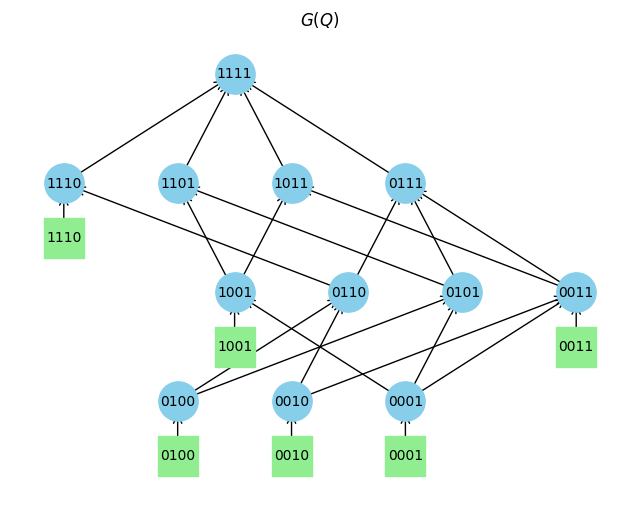

Q is identifiable


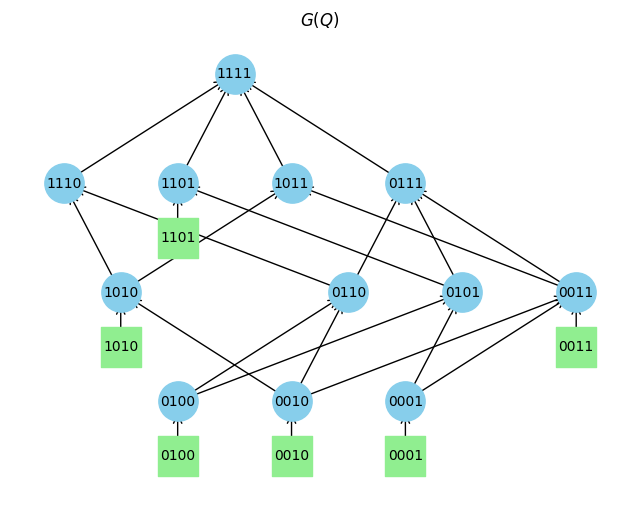

Q is identifiable


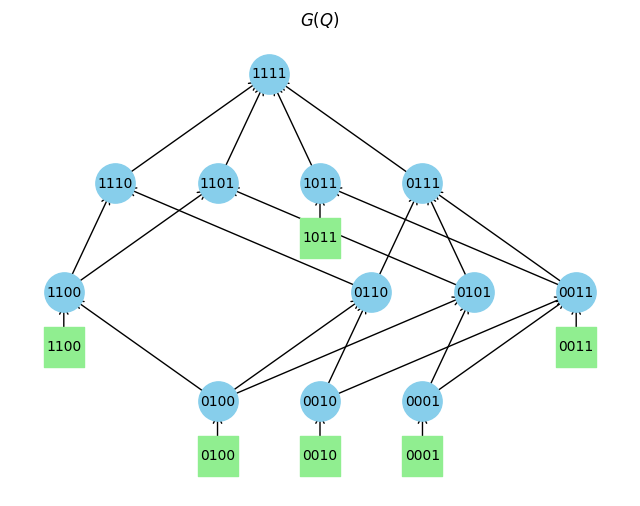

Q is trivially not identifiable. Q contains a zero column.
Q is identifiable


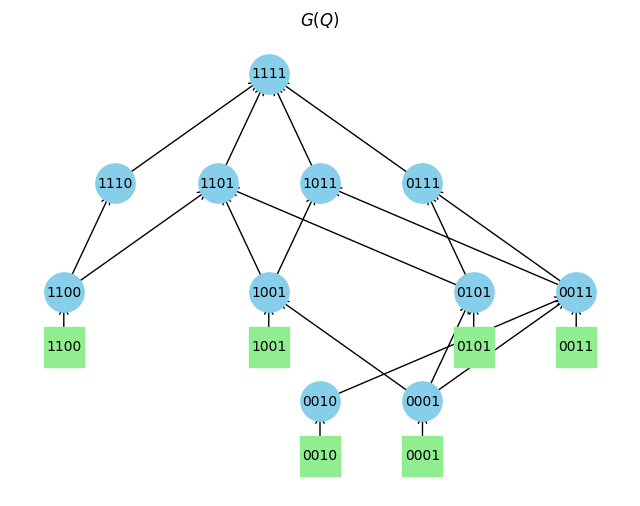

Q is identifiable


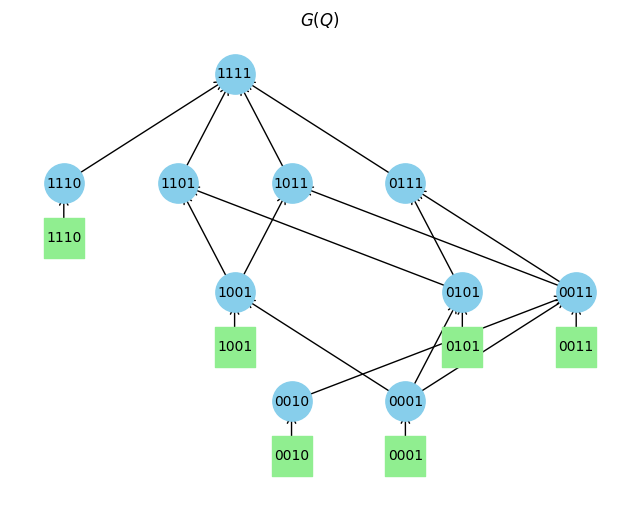

Q is identifiable


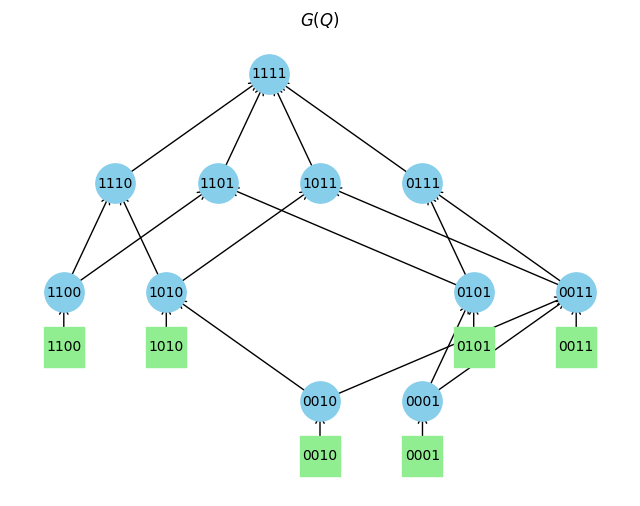

Q is identifiable


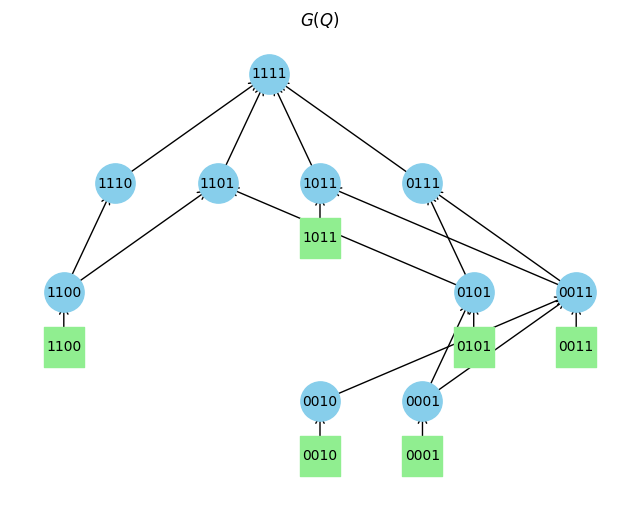

Q is identifiable


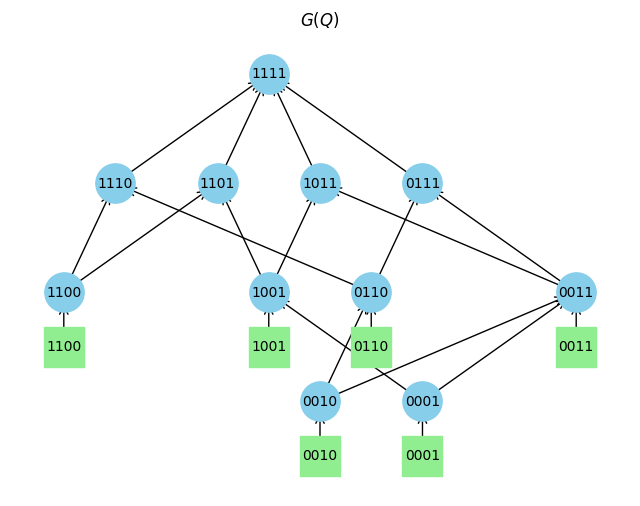

Q is identifiable


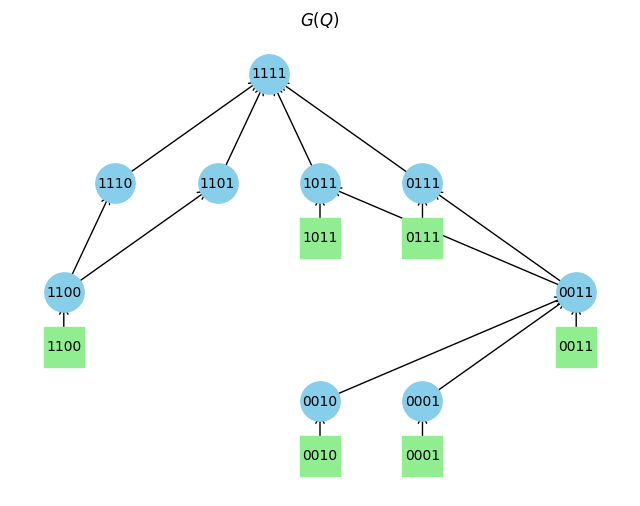

Q is identifiable
Q is identifiable
Q is identifiable


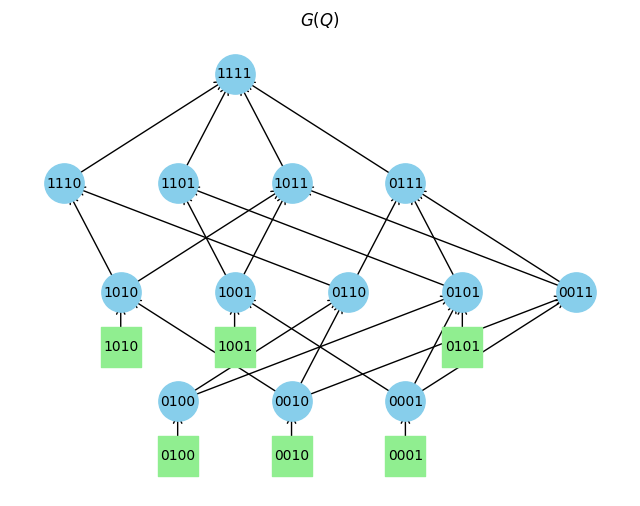

Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable


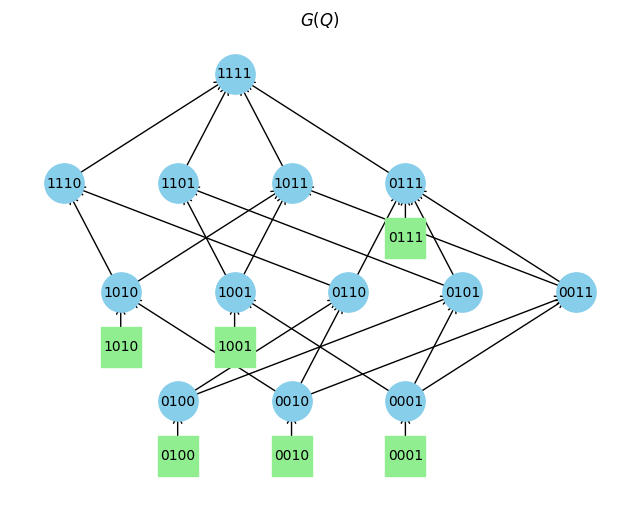

Q is identifiable


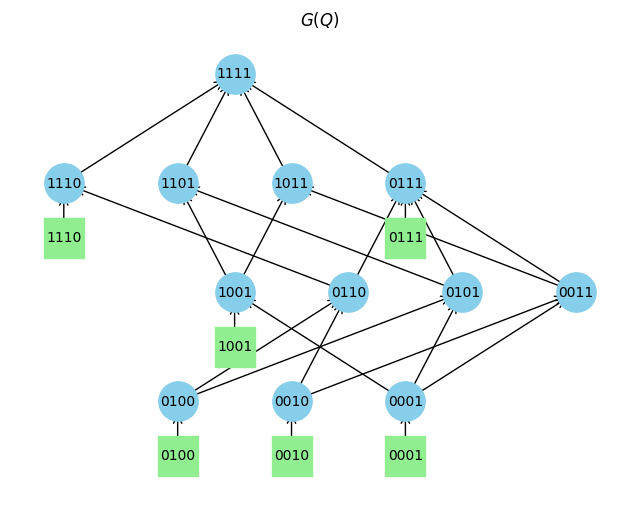

Q is identifiable


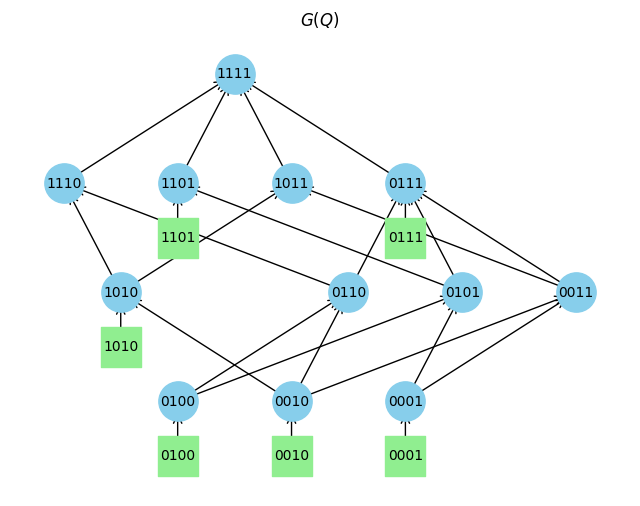

Q is identifiable


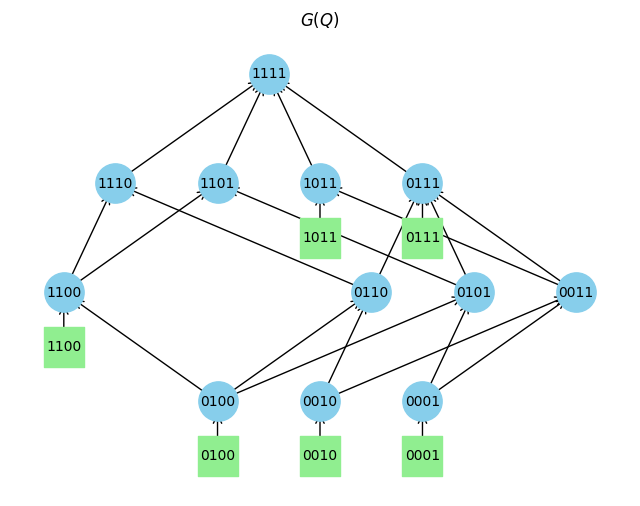

Q is identifiable


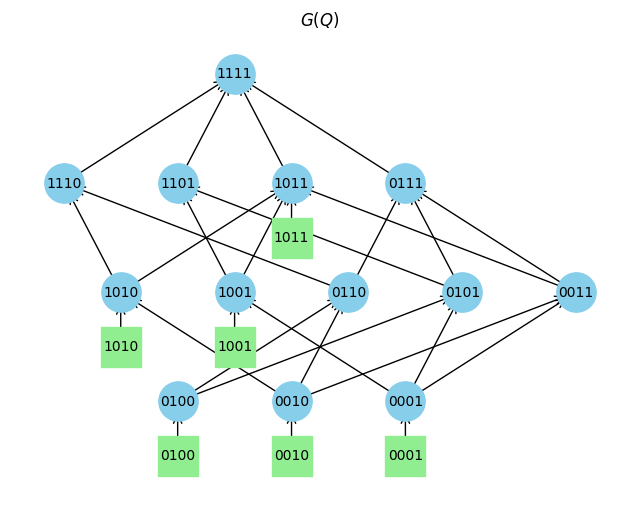

Q is identifiable


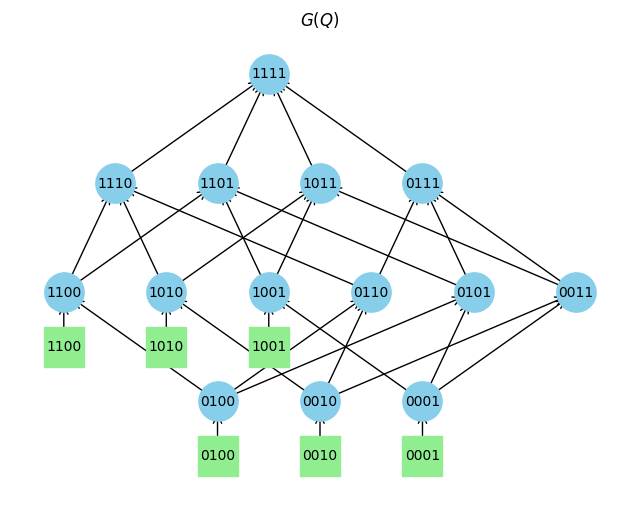

Q is identifiable


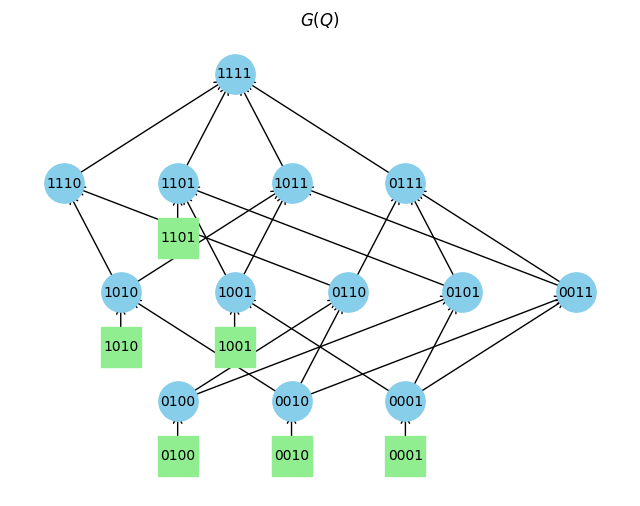

Q is identifiable


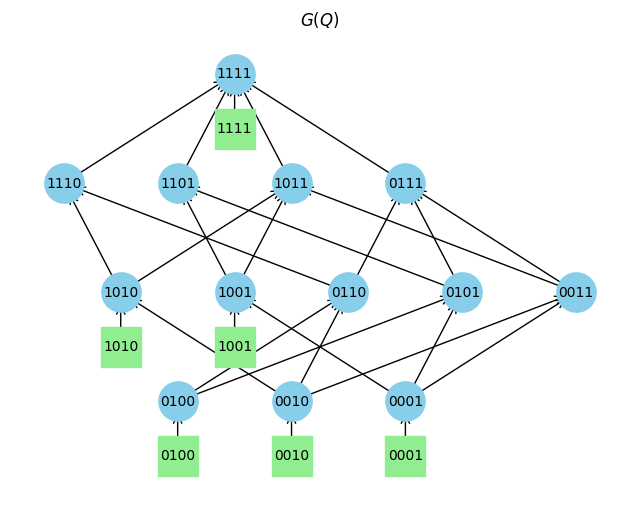

Q is identifiable


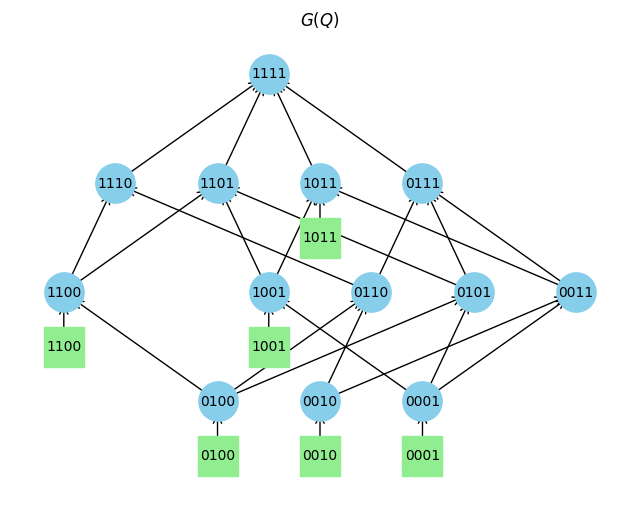

Q is identifiable


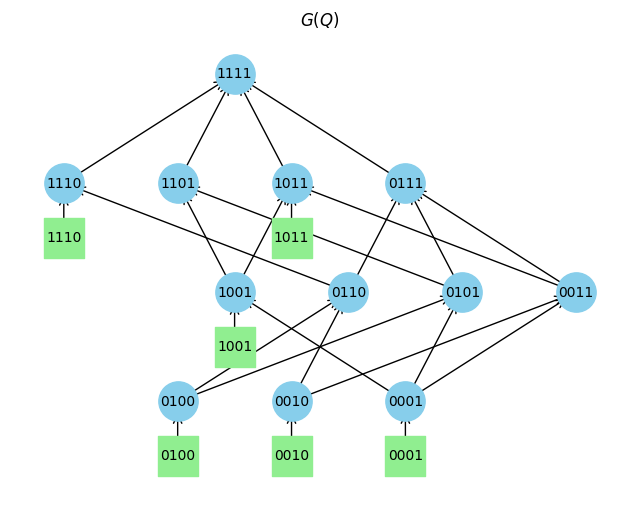

Q is identifiable


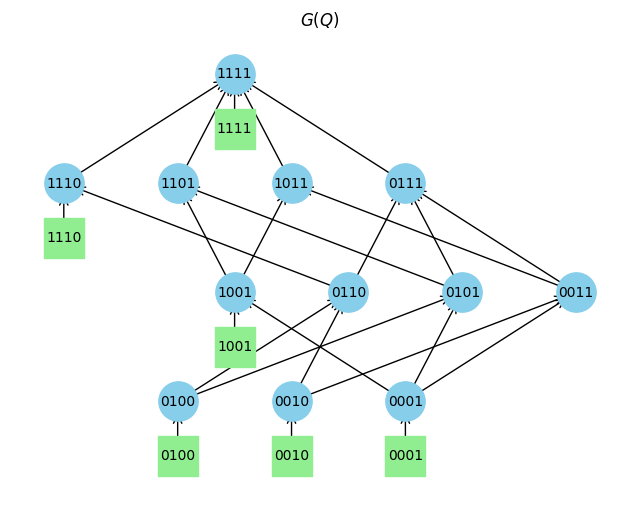

Q is identifiable


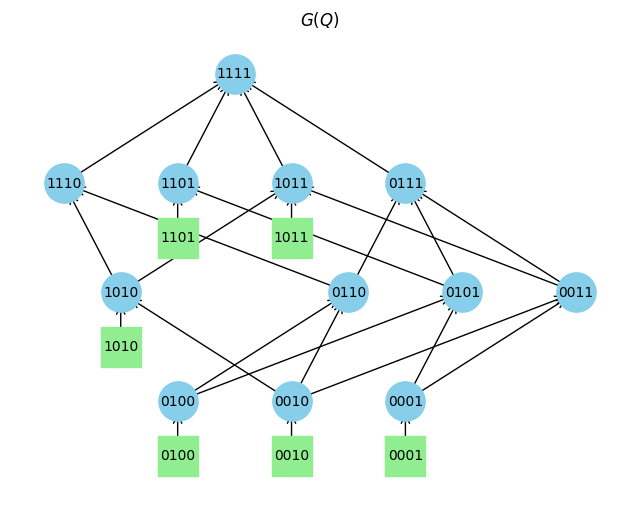

Q is identifiable


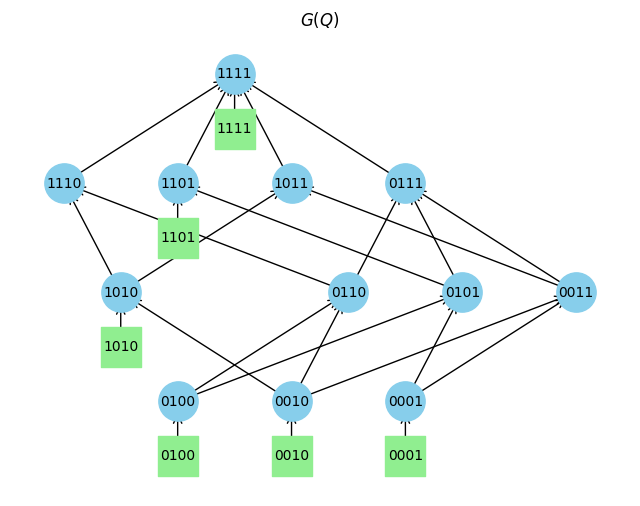

Q is identifiable


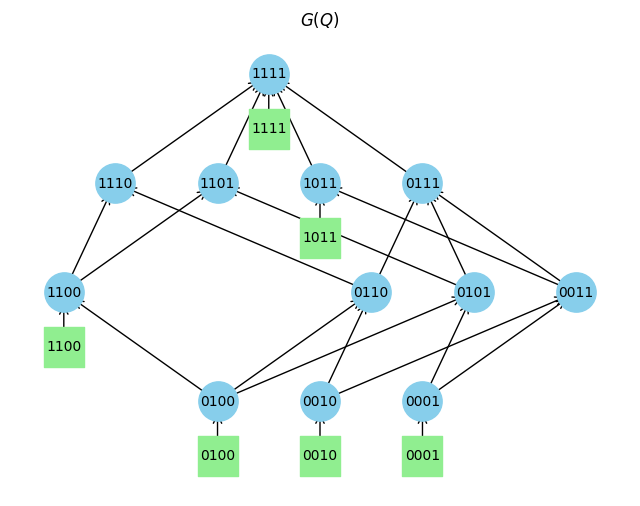

Q is identifiable


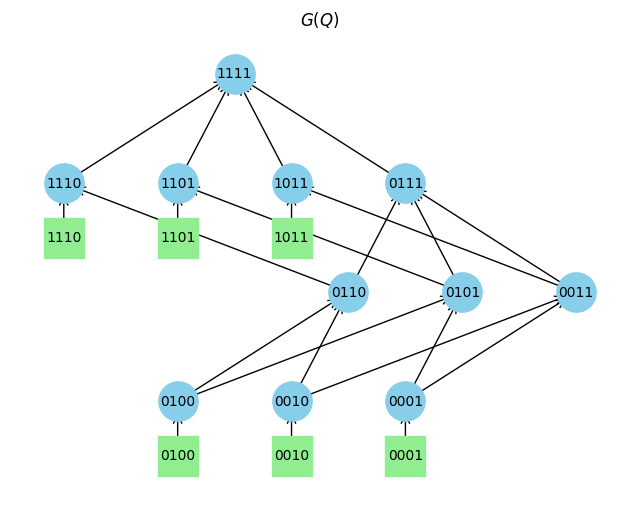

Q is identifiable


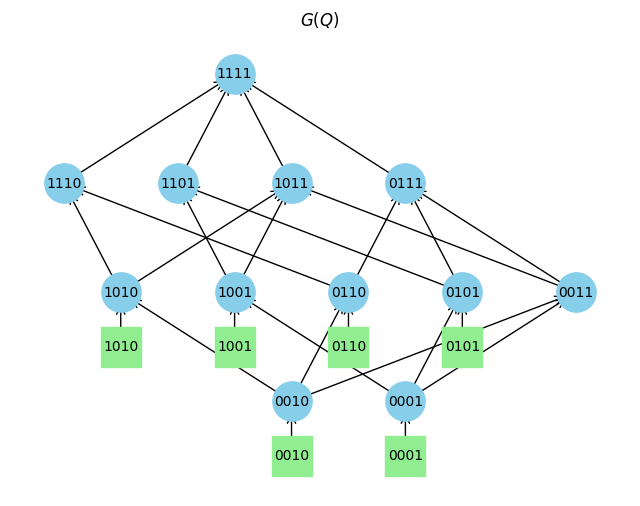

Q is identifiable


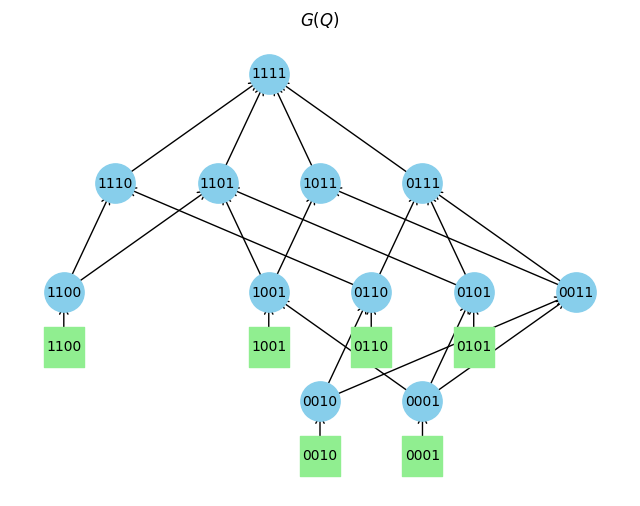

Q is identifiable


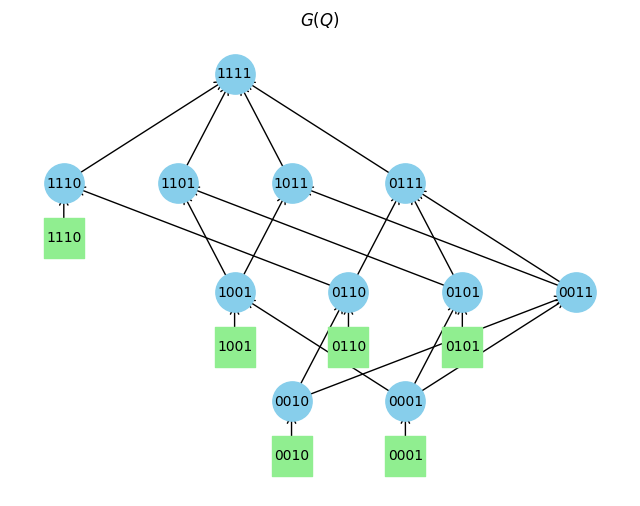

Q is identifiable


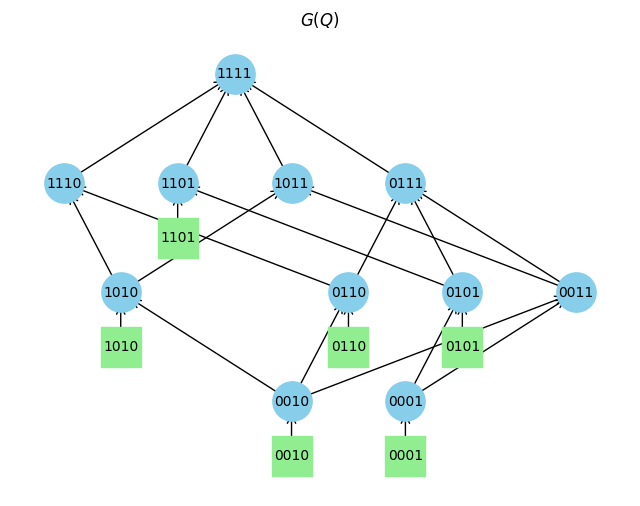

Q is identifiable


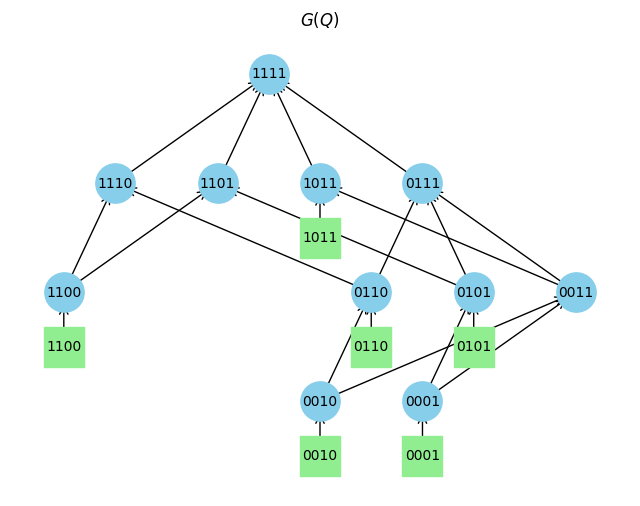

Q is identifiable


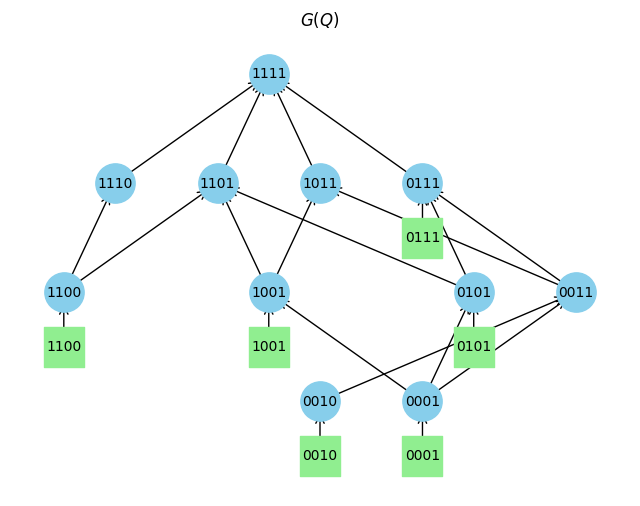

Q is identifiable


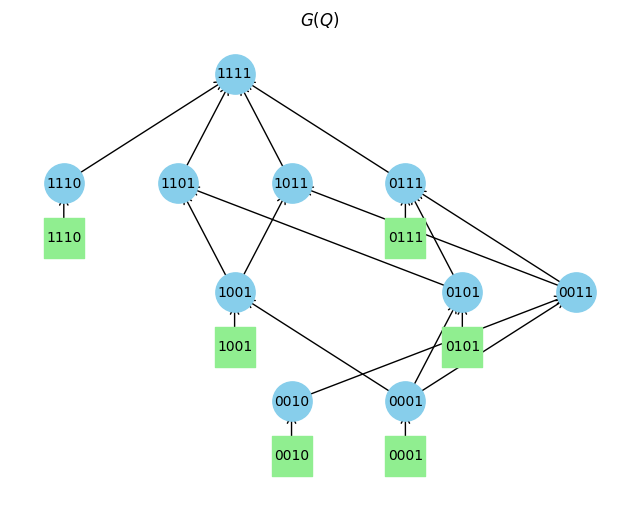

Q is identifiable


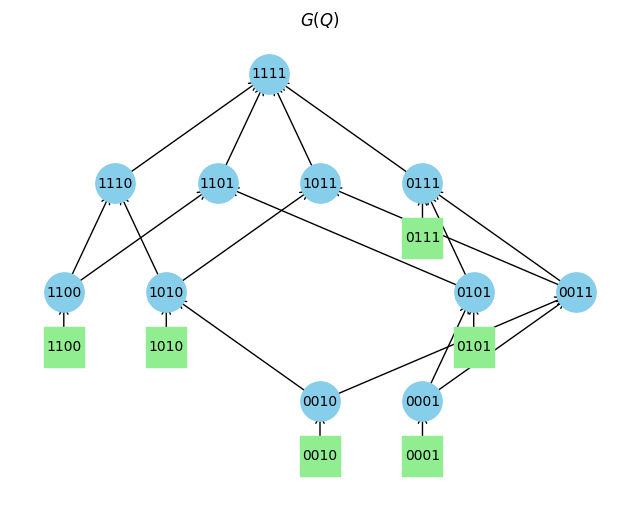

Q is identifiable


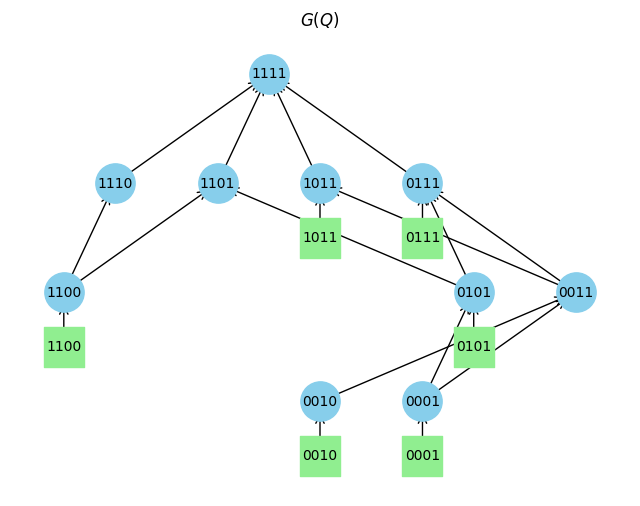

Q is identifiable


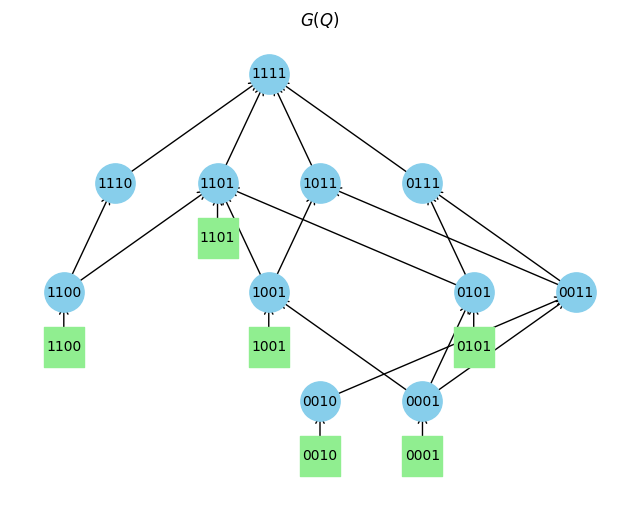

Q is identifiable


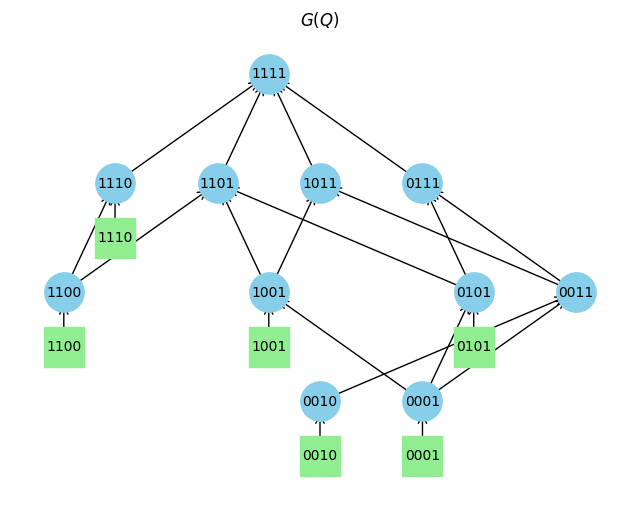

Q is identifiable


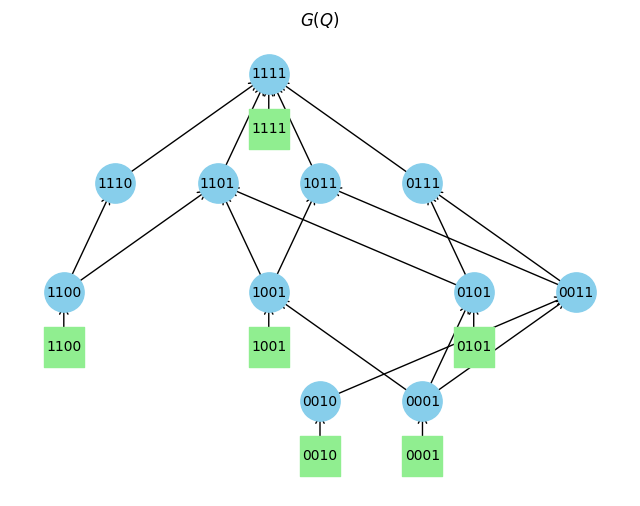

Q is identifiable


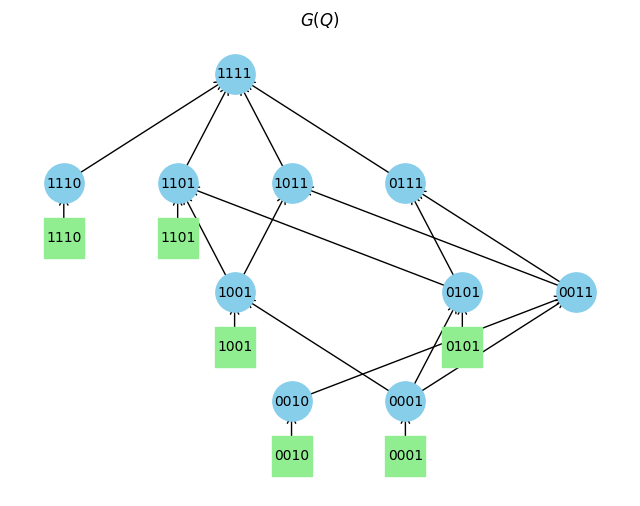

Q is identifiable


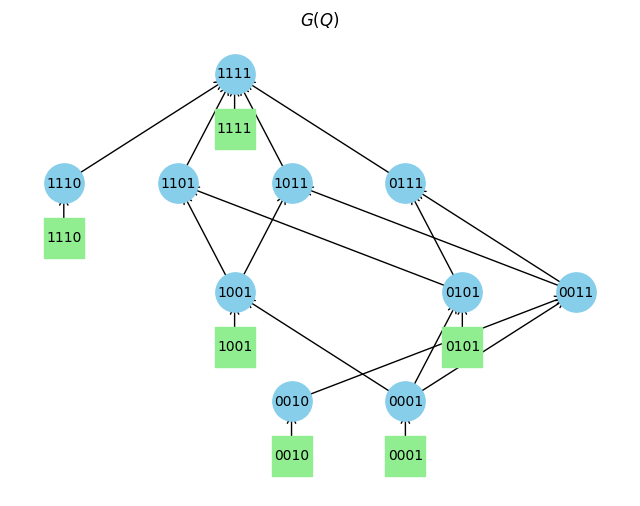

Q is identifiable


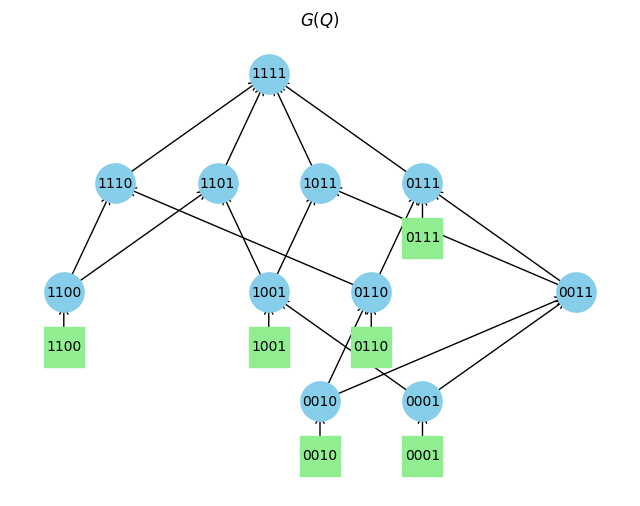

Q is identifiable


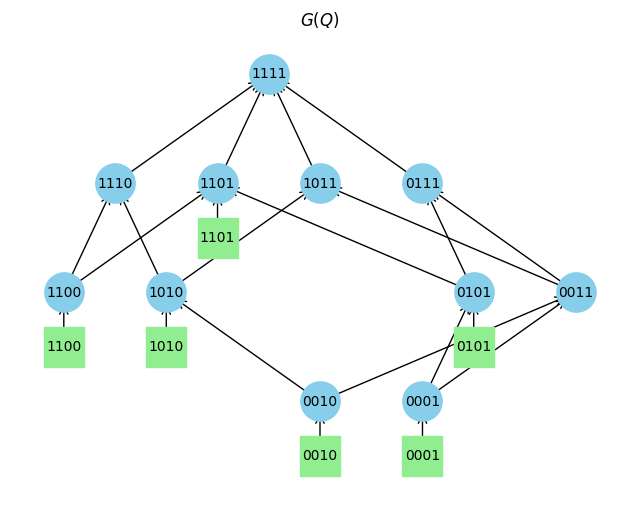

Q is identifiable


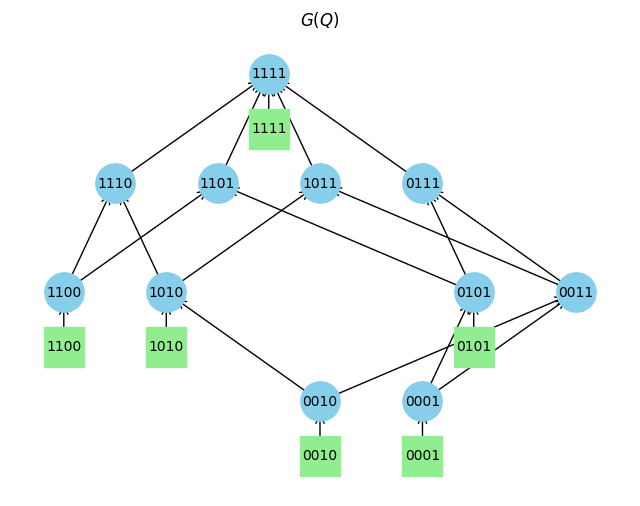

Q is identifiable


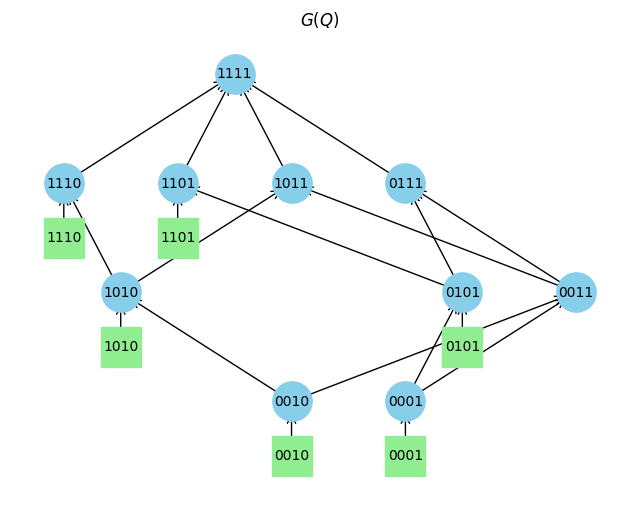

Q is identifiable


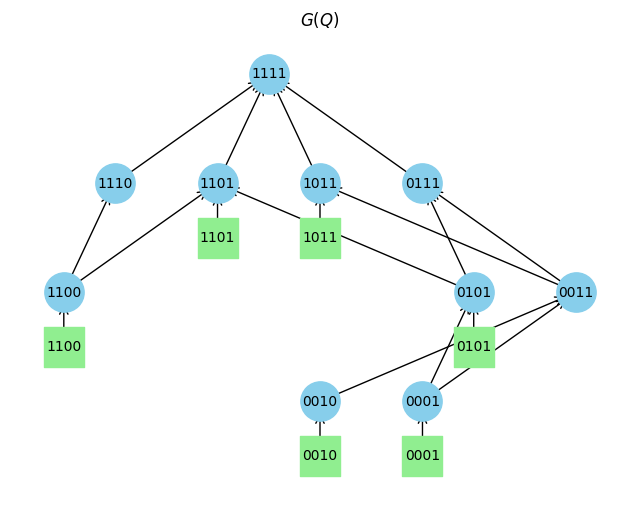

Q is identifiable


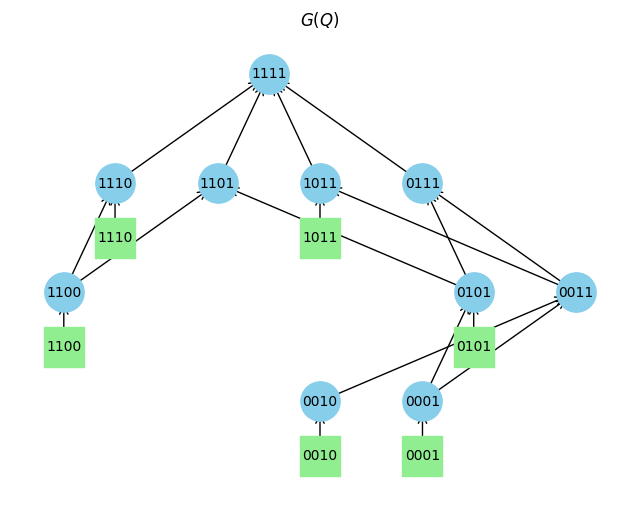

Q is identifiable


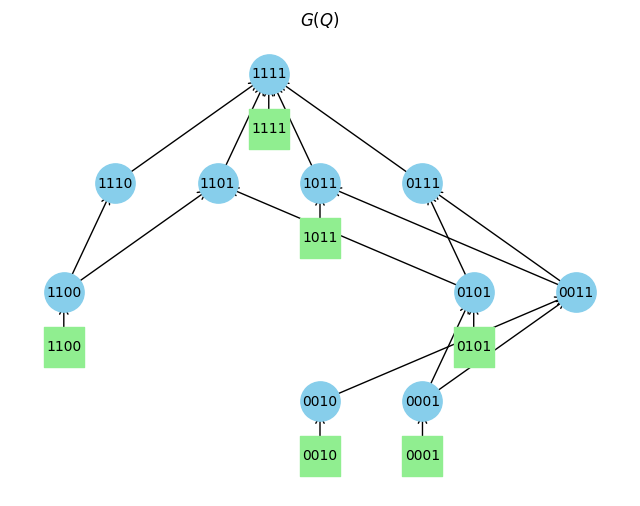

Q is identifiable


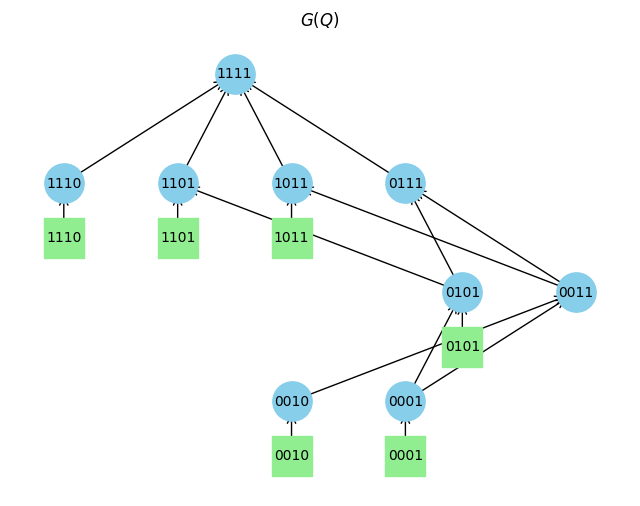

Q is identifiable


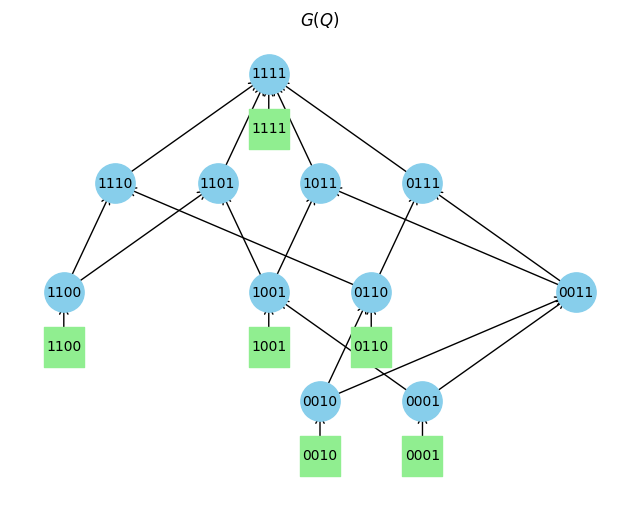

Q is identifiable


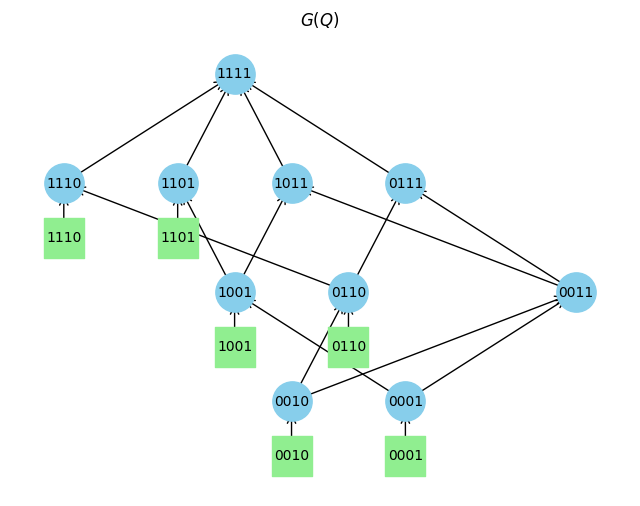

Q is identifiable


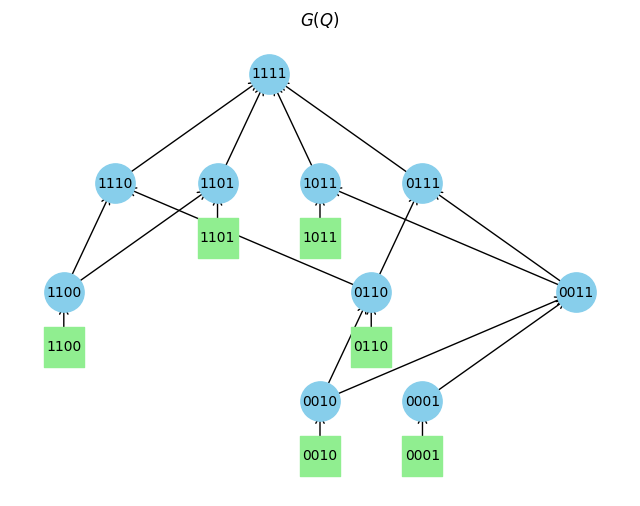

Q is identifiable


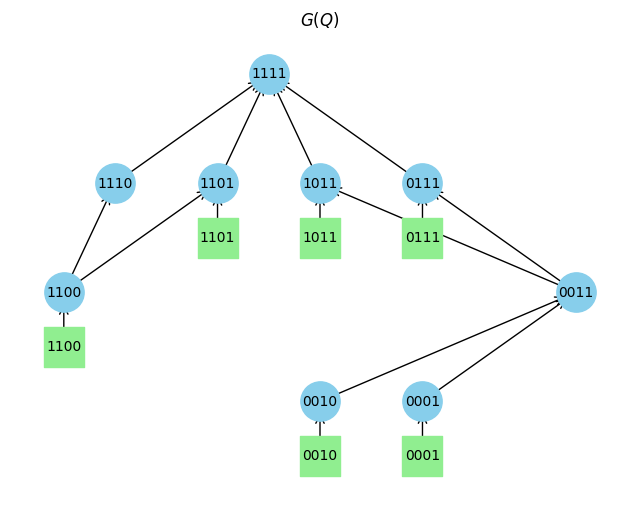

Q is identifiable


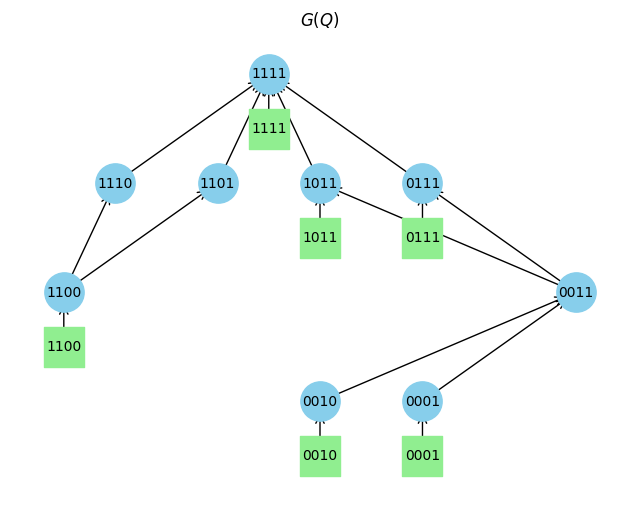

Q is identifiable


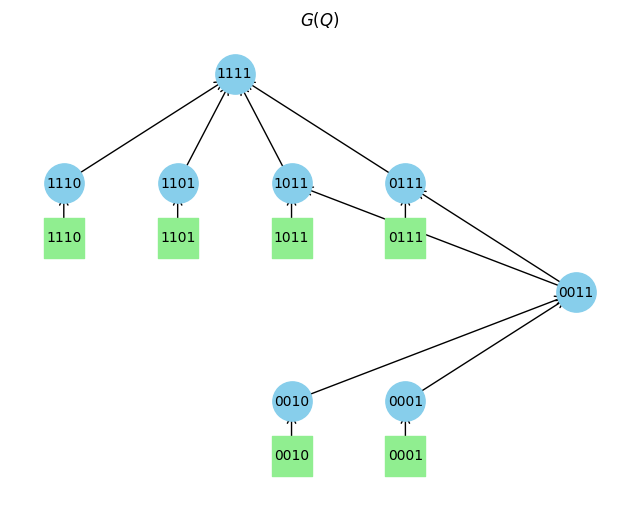

Q is identifiable


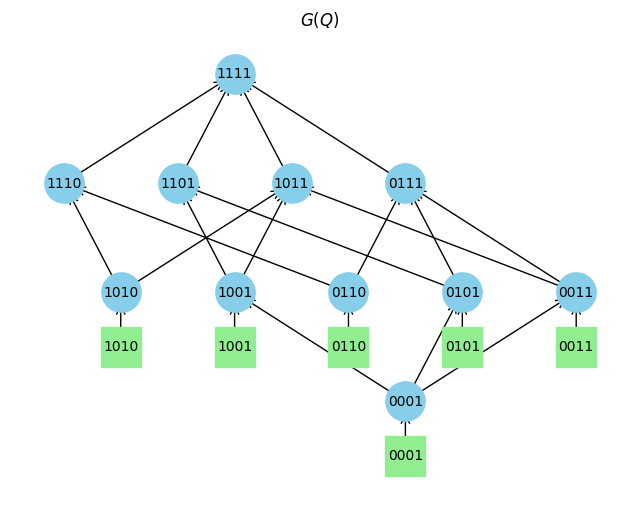

Q is identifiable


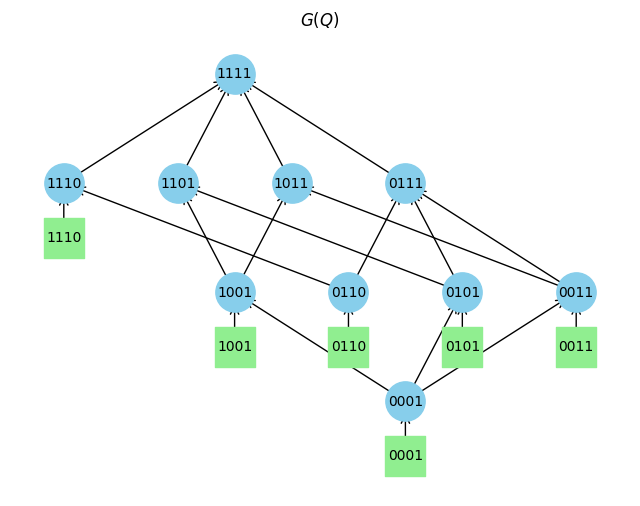

Q is identifiable


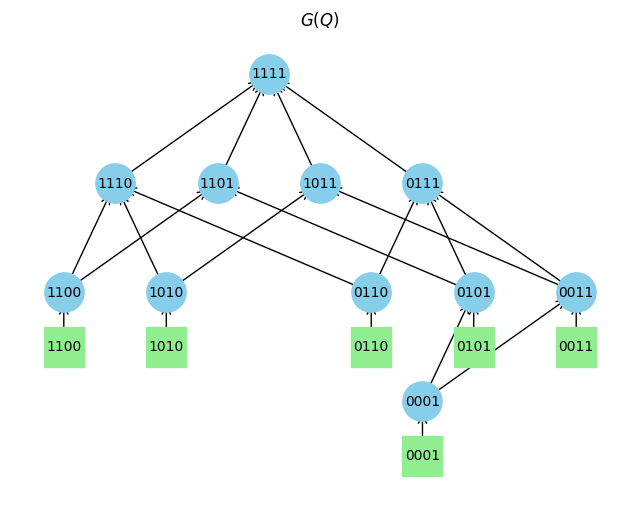

Q is identifiable


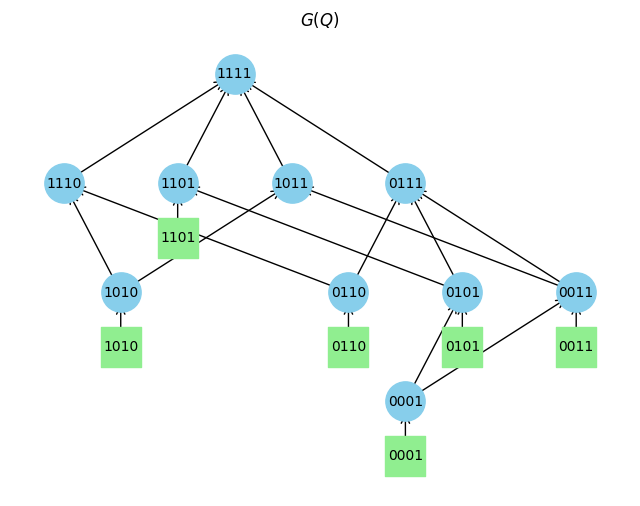

Q is identifiable


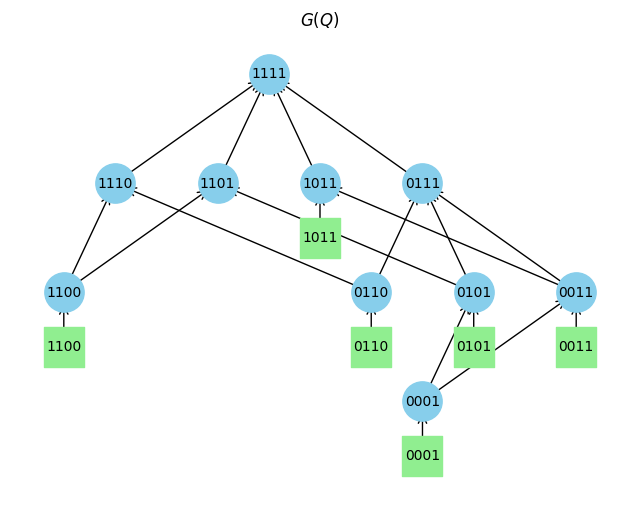

Q is trivially not identifiable. Q contains a one column.
Q is identifiable


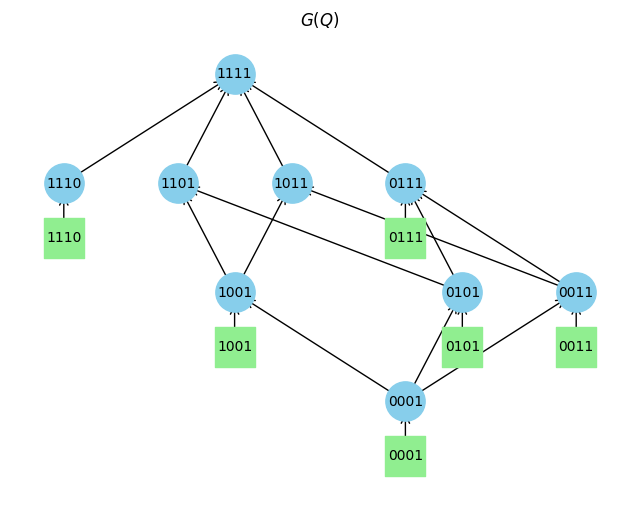

Q is trivially not identifiable. Q contains a one column.
Q is identifiable


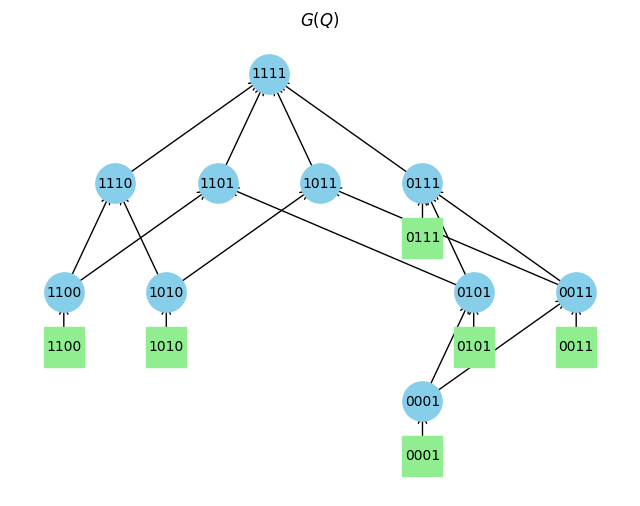

Q is trivially not identifiable. Q contains a one column.
Q is trivially not identifiable. Q contains a one column.
Q is identifiable


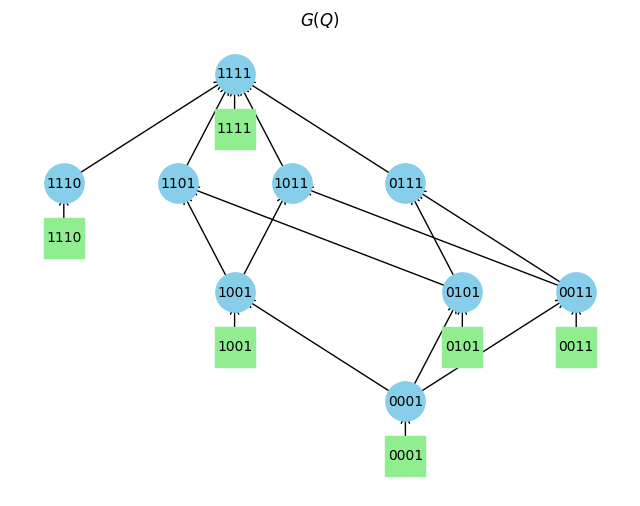

Q is identifiable


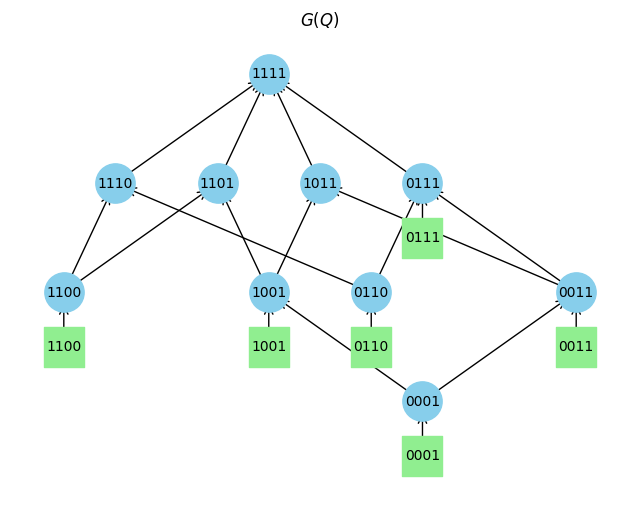

Q is identifiable


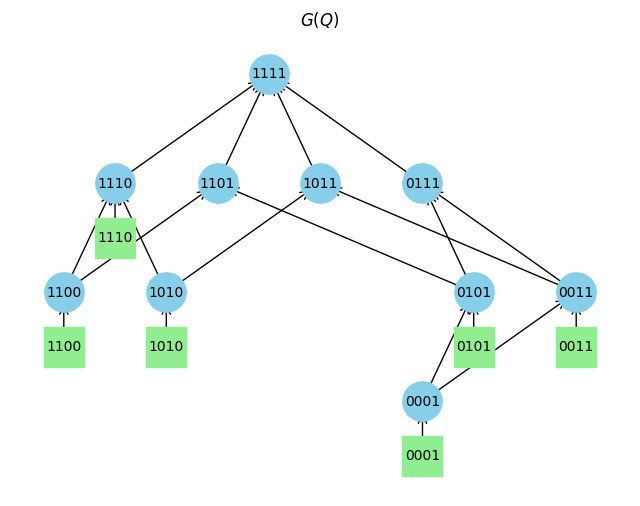

Q is identifiable


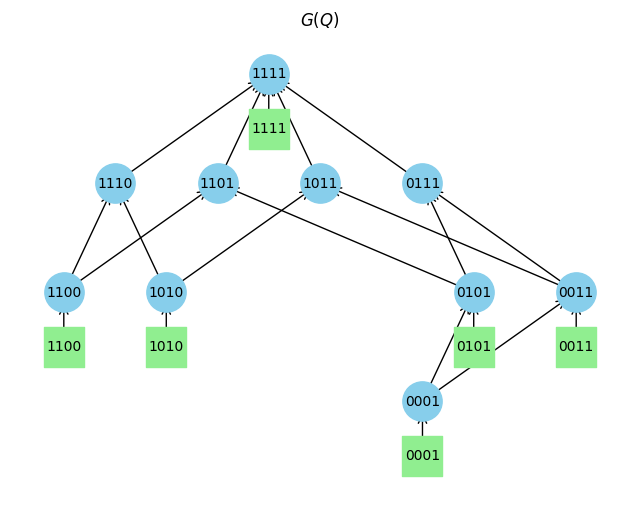

Q is identifiable


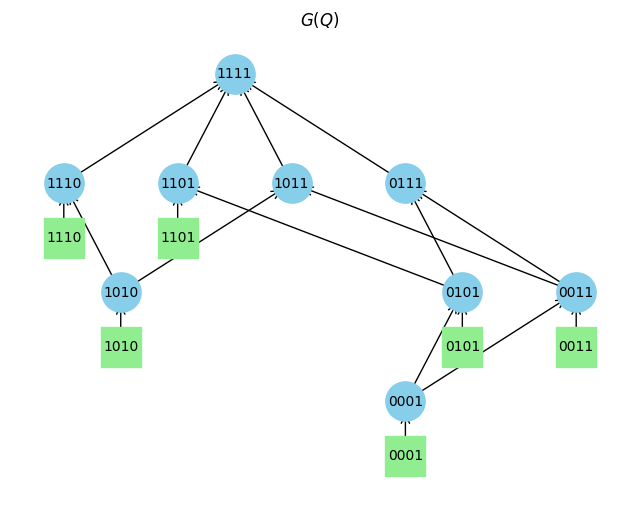

Q is identifiable


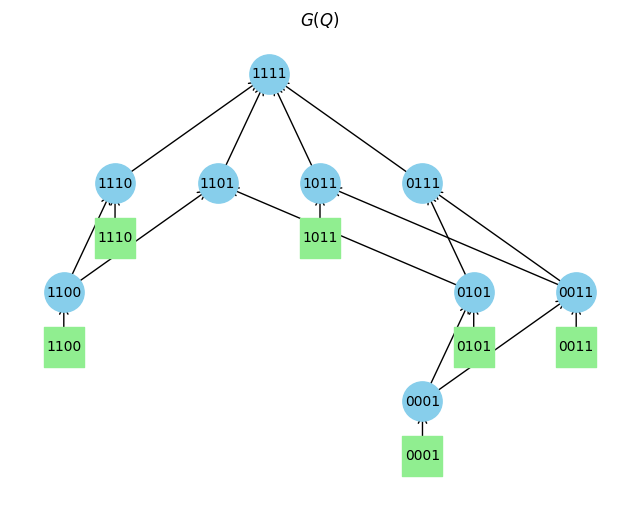

Q is identifiable


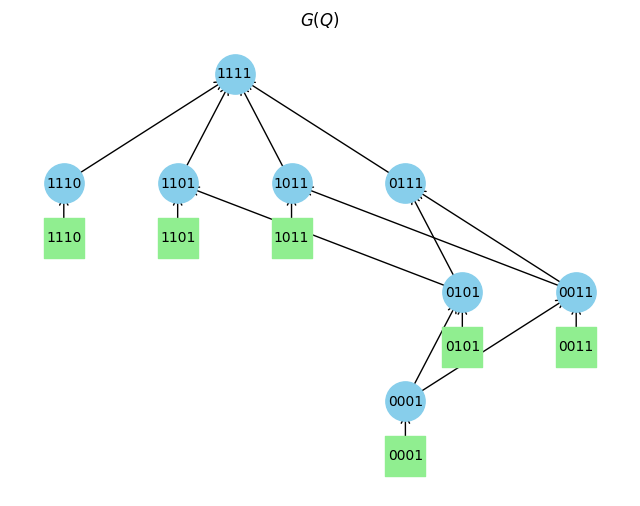

Q is trivially not identifiable. Q contains a one column.
Q is identifiable


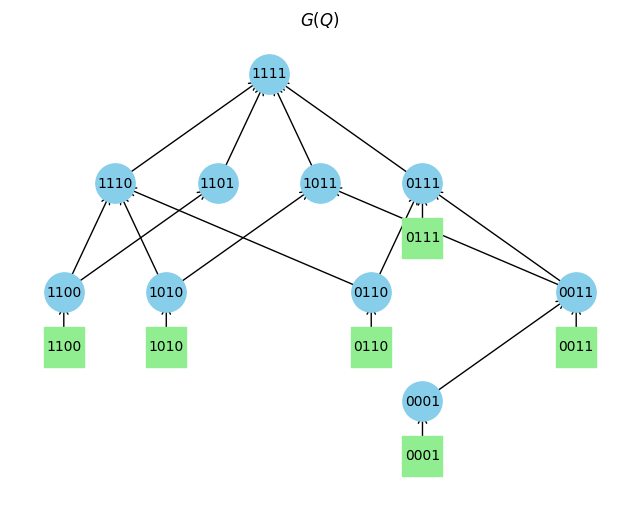

Q is identifiable


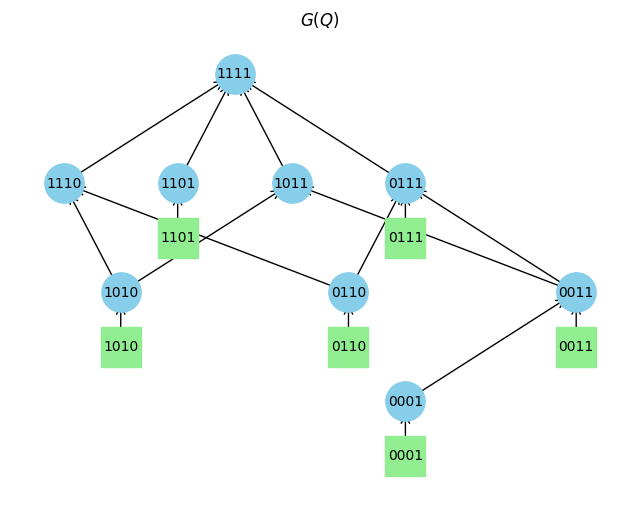

Q is identifiable


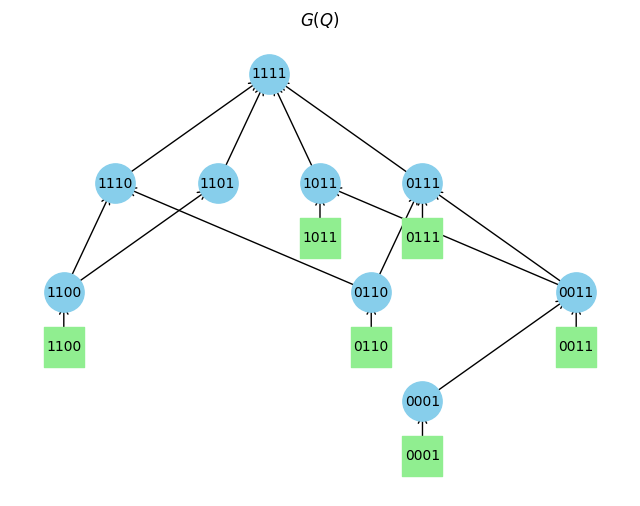

Q is identifiable


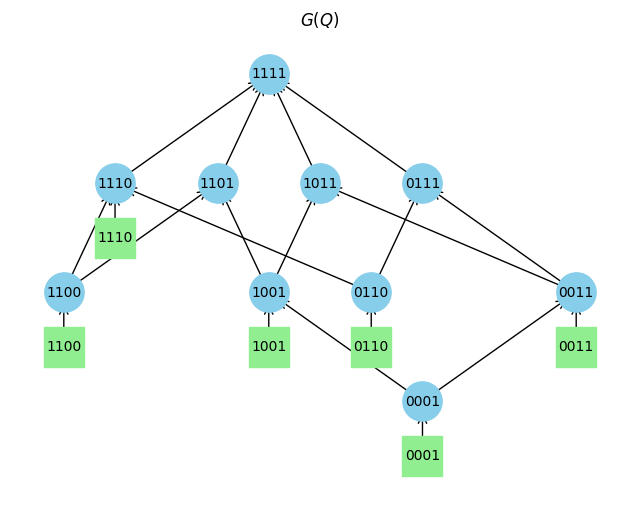

Q is identifiable


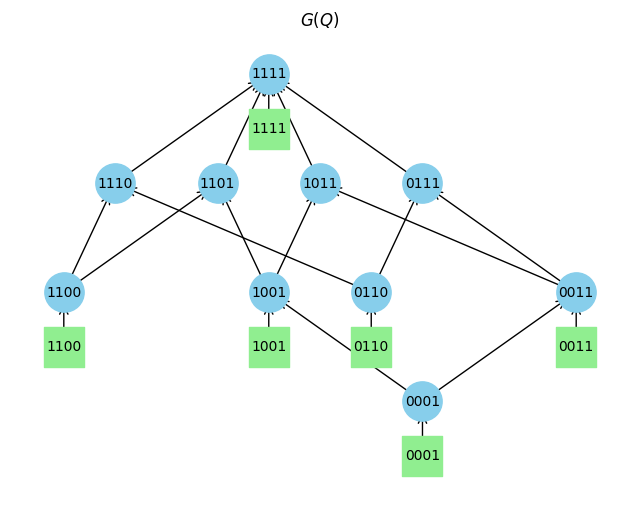

Q is identifiable


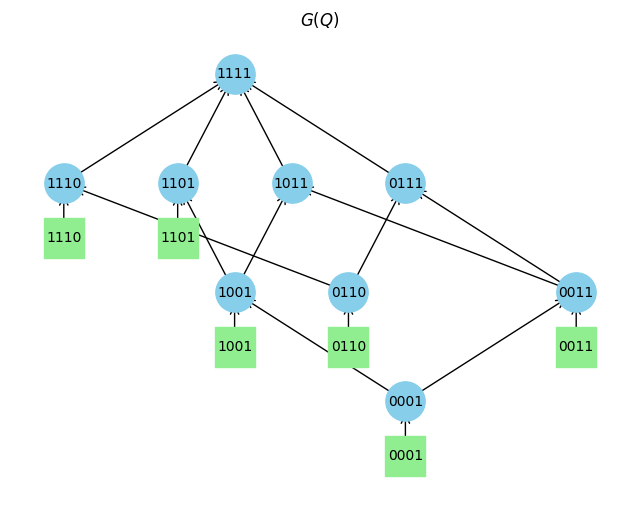

Q is identifiable


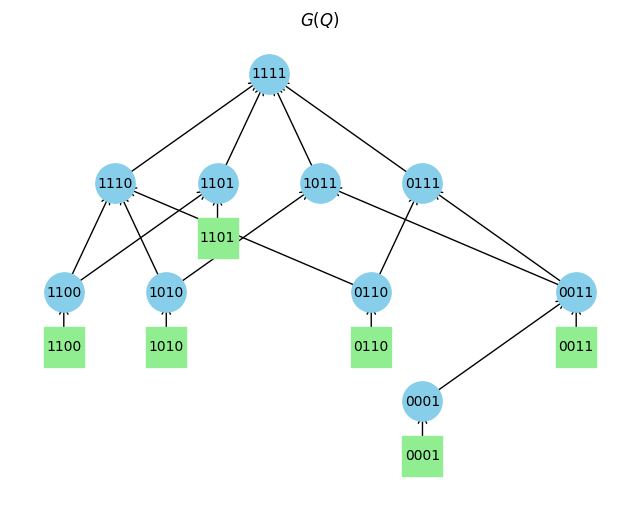

Q is identifiable


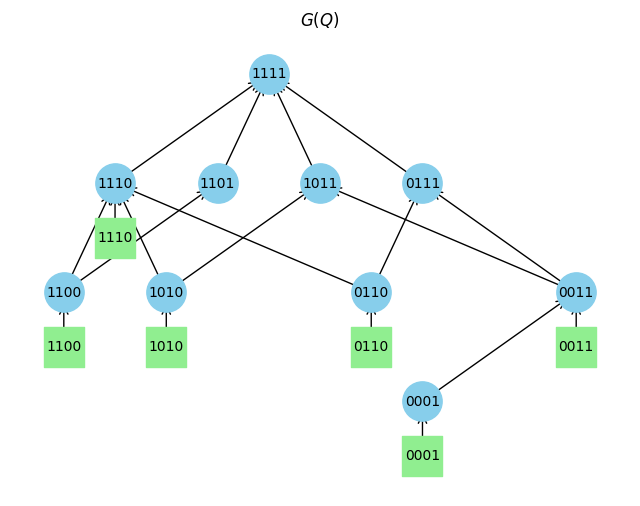

Q is identifiable


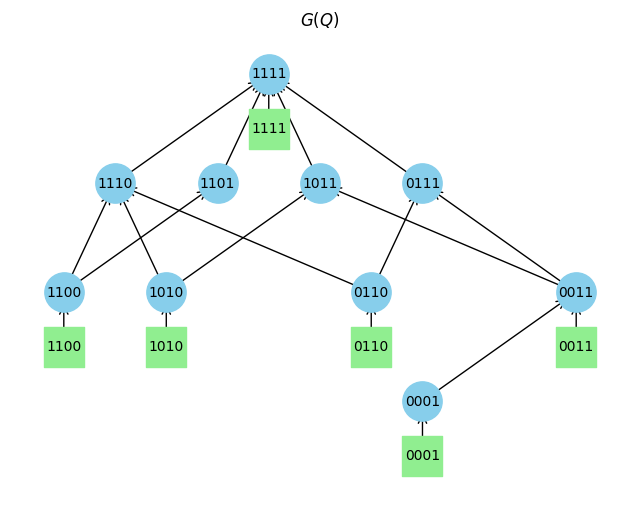

Q is identifiable


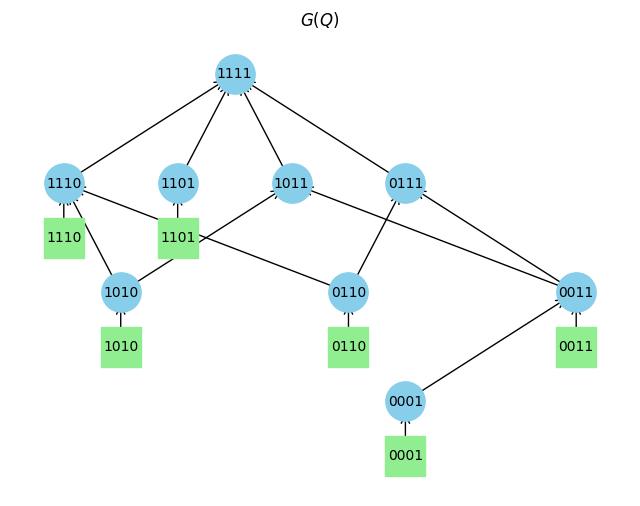

Q is identifiable


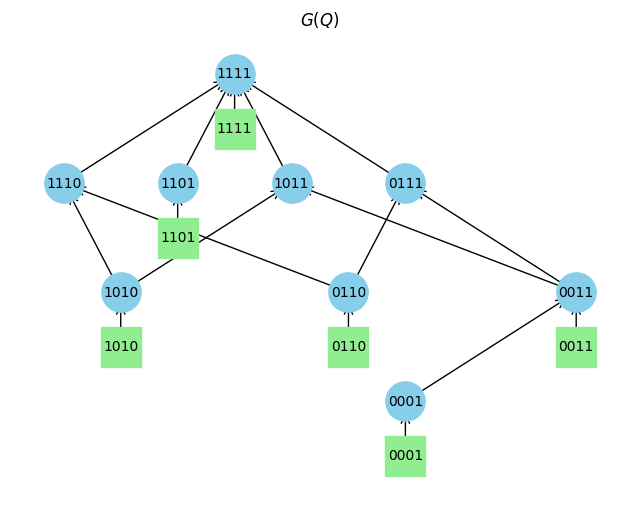

Q is identifiable


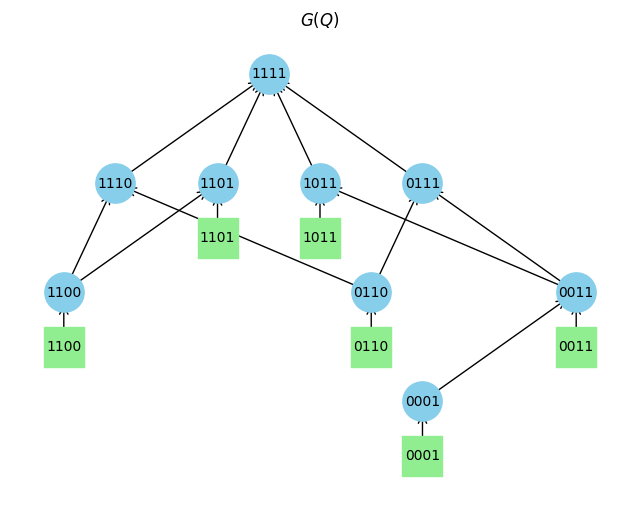

Q is identifiable


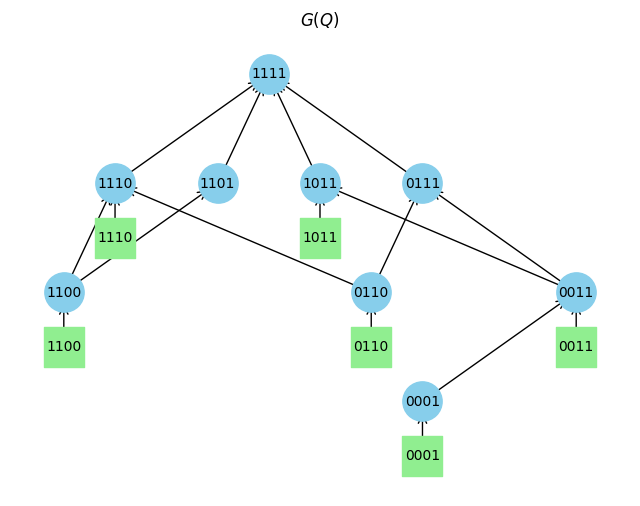

Q is identifiable


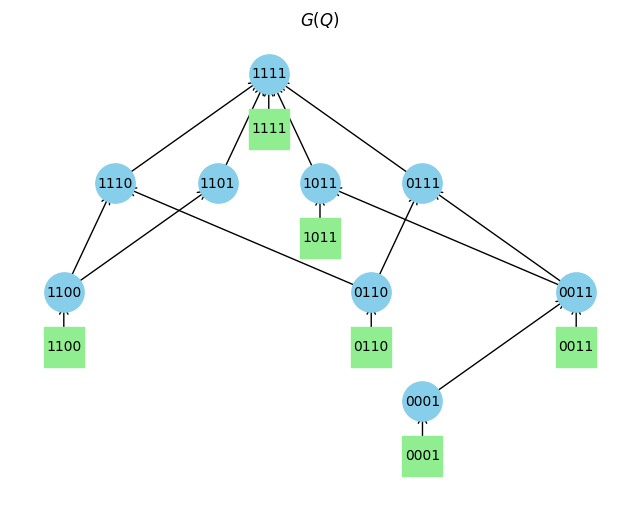

Q is identifiable


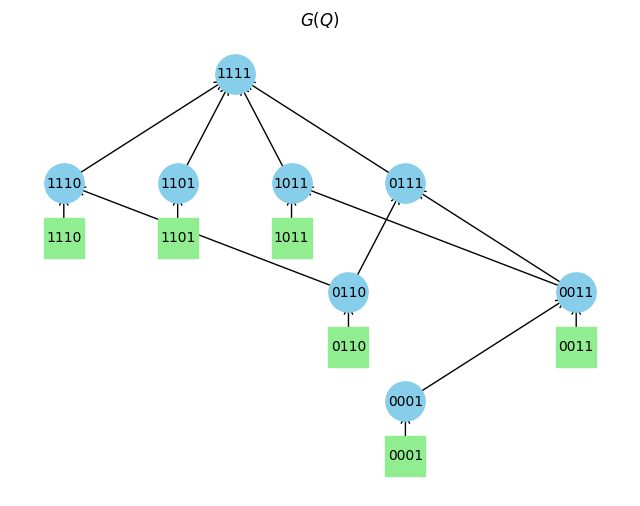

Q is identifiable


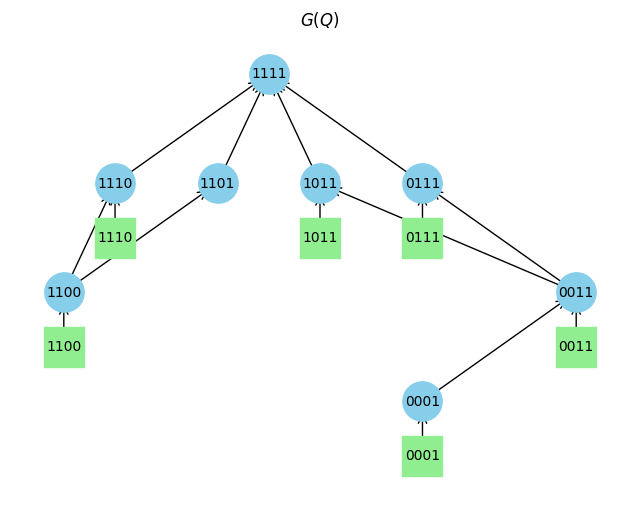

Q is identifiable


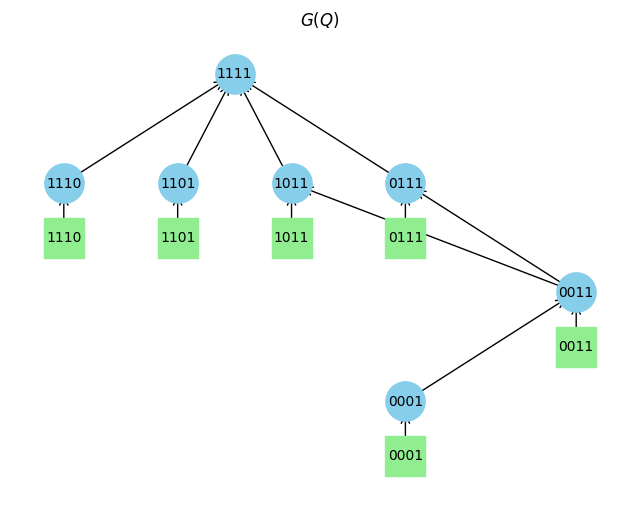

Q is trivially not identifiable. Q contains a one column.
Q is identifiable


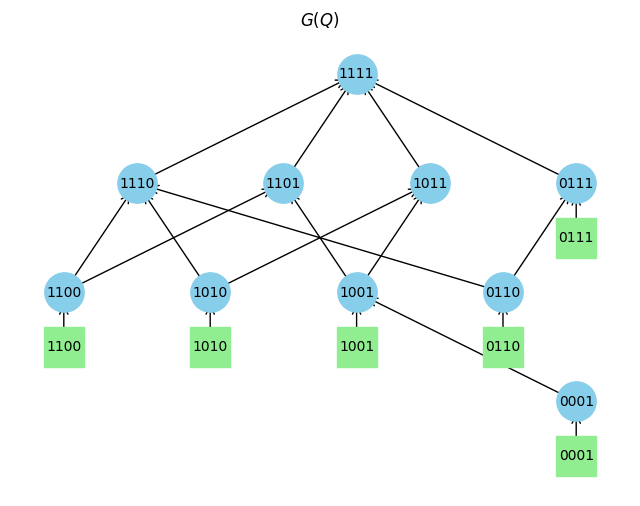

Q is identifiable


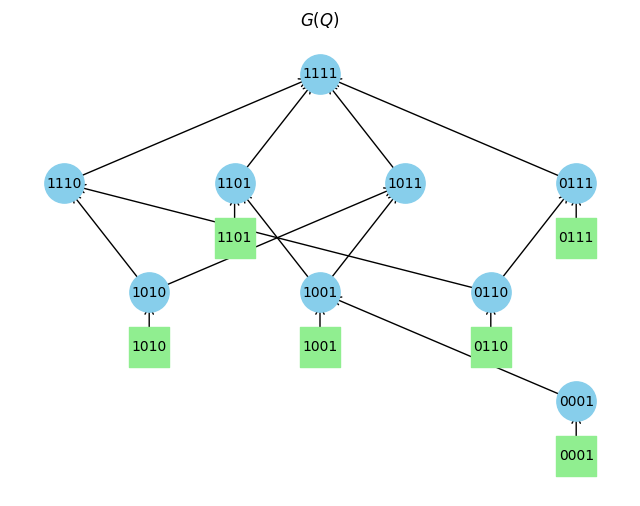

Q is identifiable


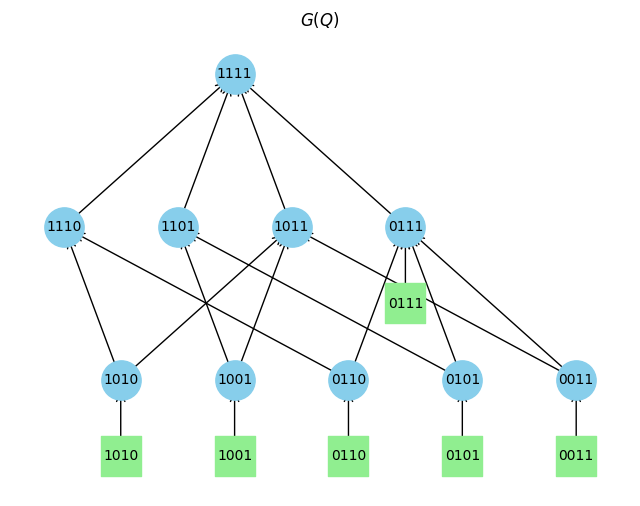

Q is identifiable


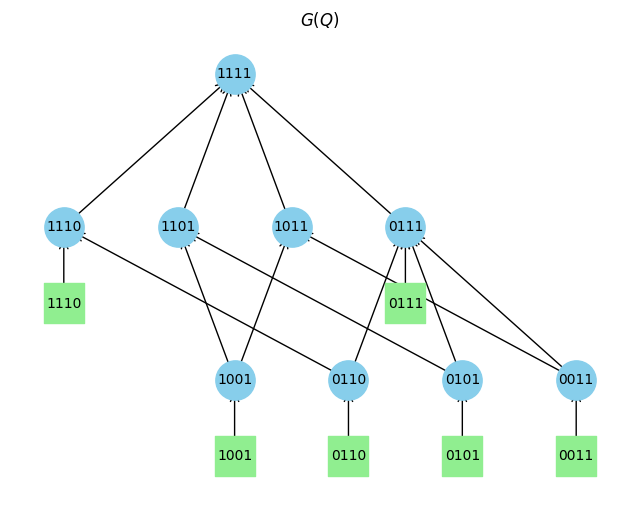

Q is identifiable


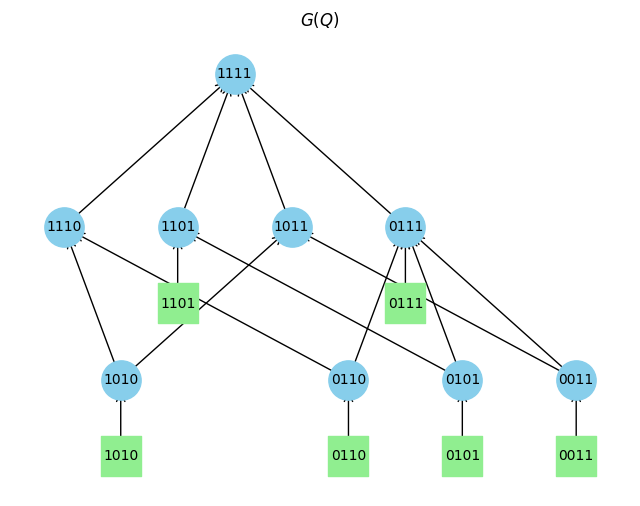

Q is identifiable


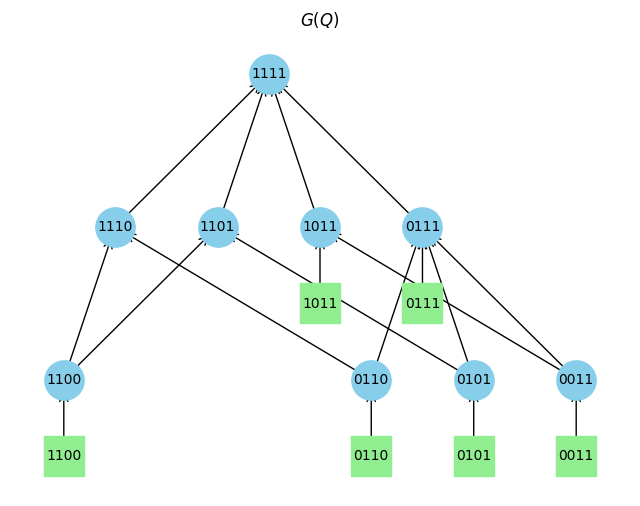

Q is identifiable


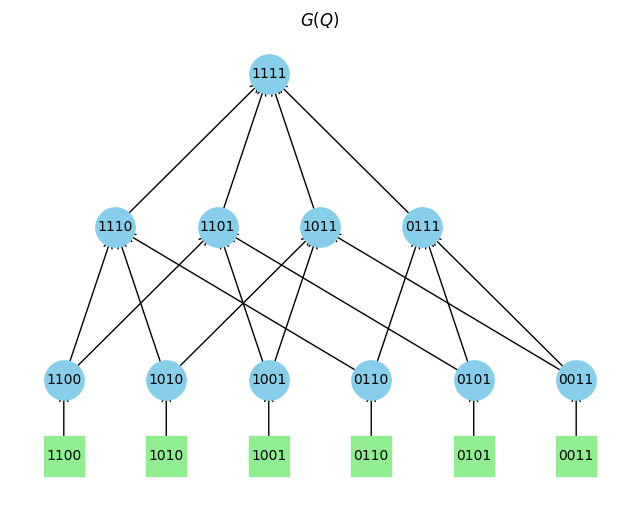

Q is identifiable


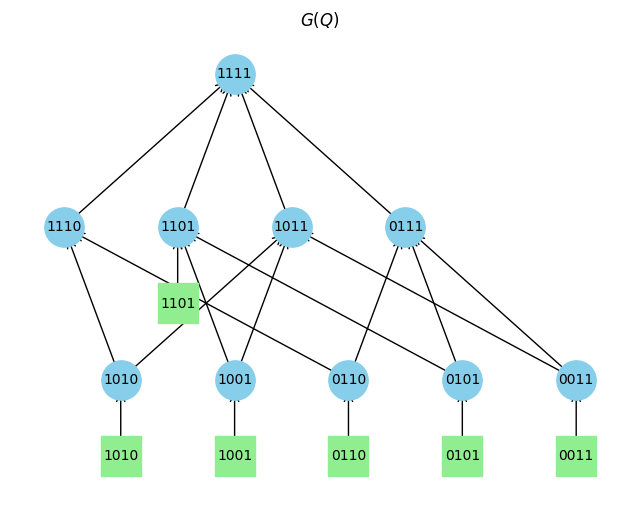

Q is identifiable


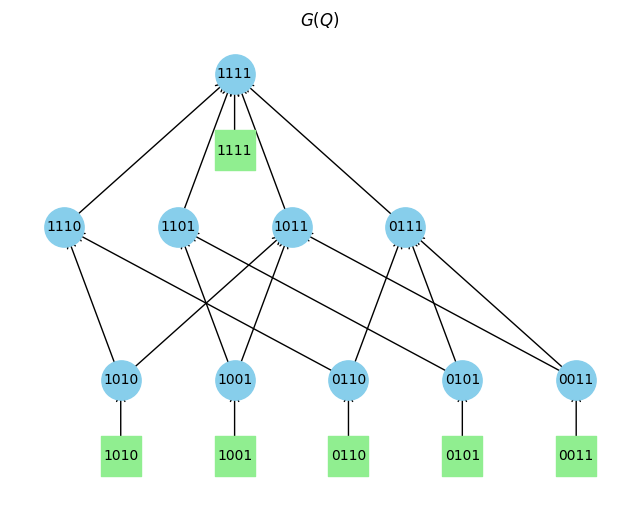

Q is identifiable


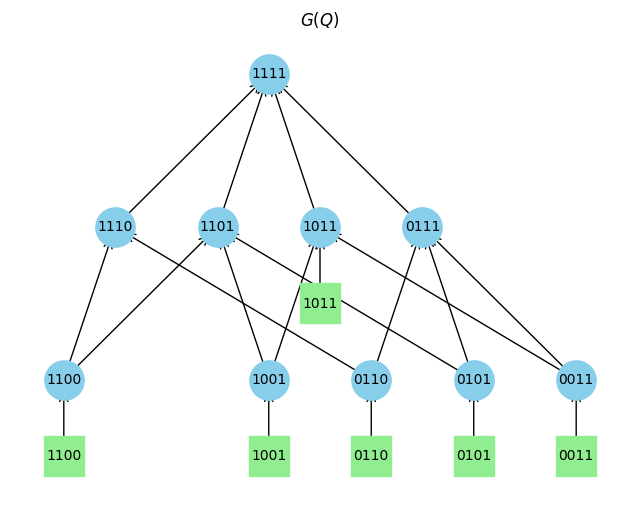

Q is identifiable


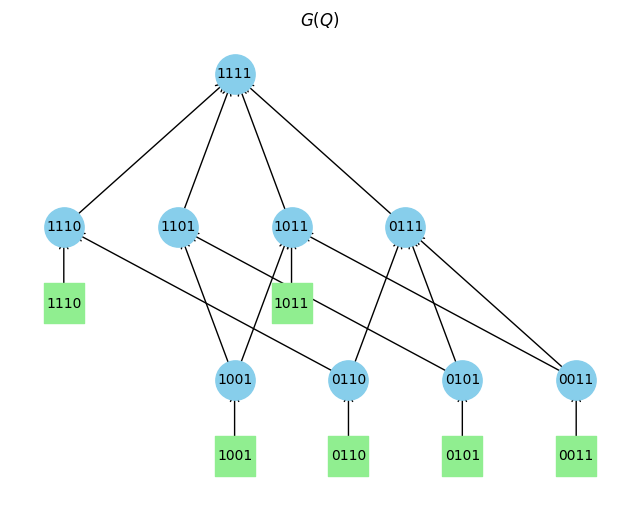

Q is identifiable


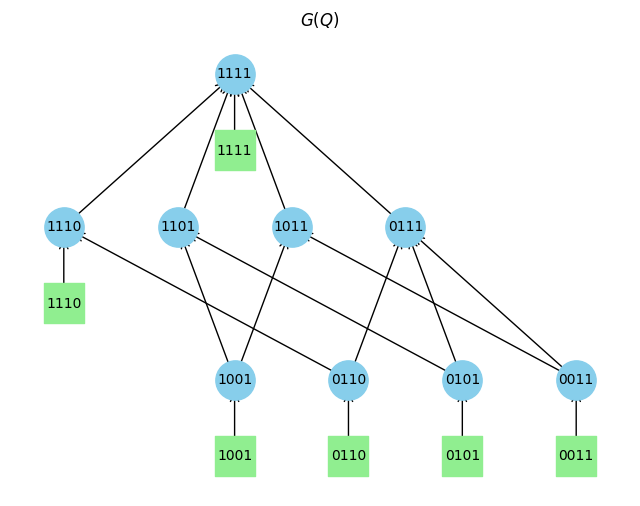

Q is identifiable


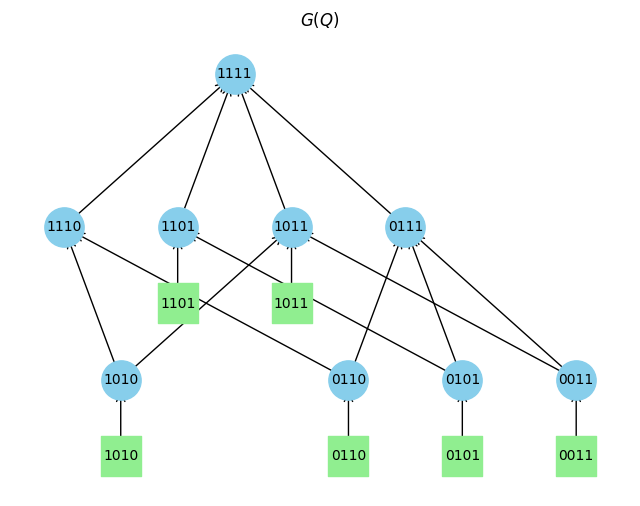

Q is identifiable


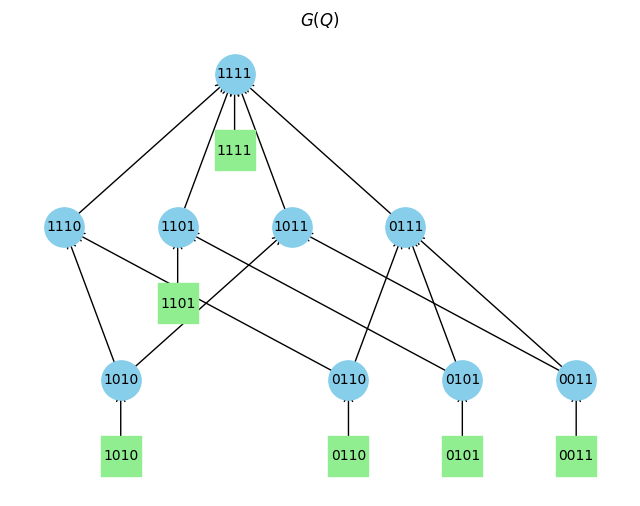

Q is identifiable


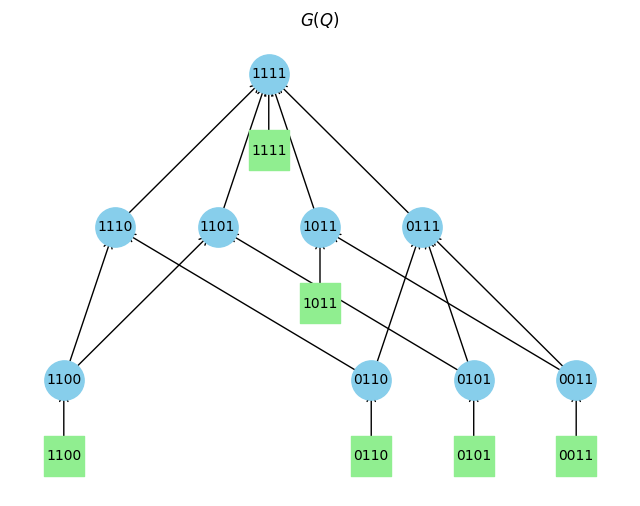

Q is identifiable


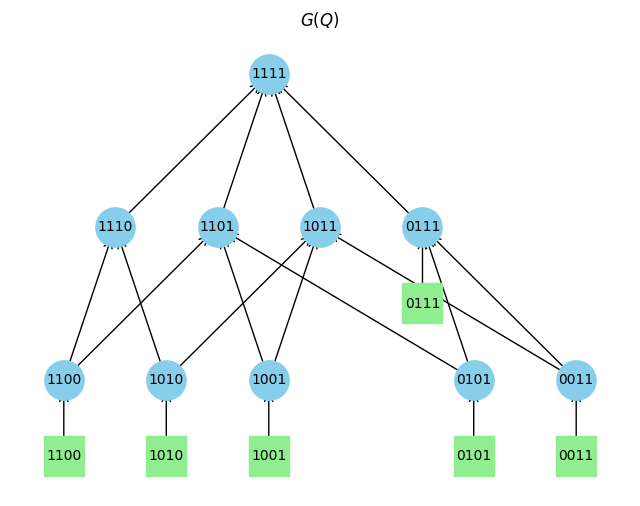

Q is identifiable


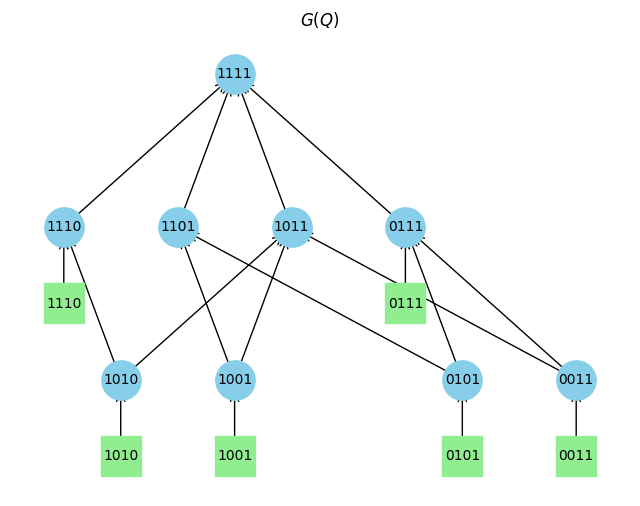

Q is trivially not identifiable. Q contains a one column.
Q is not identifiable
Q is trivially not identifiable. Q contains a one column.
Q is not identifiable
Q is not identifiable
Q is not identifiable
Q is not identifiable
Q is not identifiable
Q is not identifiable
Q is trivially not identifiable. Q contains a one column.
Q is not identifiable
Q is not identifiable
Q is not identifiable


In [45]:
id_Q64 = []
id_Q64_withoutI = []
nid_Q64_id2 = []
nid_Q64_id3 = []
nid_Q64_ncol = []
for Q in generate_canonical_matrices(6, 4):
    idd, Q_bar = identifiability(Q = Q)
    if idd:
        id_Q64.append(Q)
        if not contains_identity_submatrix(Q):
            id_Q64_withoutI.append(Q)
            draw_G_K4(Q)

In [55]:
import numpy as np

result = []
for Q in id_Q54_withoutI:
    # Get the set of representative node rows and the set of current item node rows
    R_Q = representative_node_set(Q)
    I_Q = item_node_set(Q)
    # Determine which representative rows are not already present in Q
    new_rows = R_Q - I_Q
    for q in new_rows:
        # Create a new Q by appending q to Q.
        # We first convert each row of Q to a list of integers (binary values)
        newQ_list = [list(map(int, row)) for row in Q]
        # Convert the candidate row q to a list of integers
        new_row = list(map(int, q))
        newQ_list.append(new_row)
        # Convert newQ_list to a NumPy array with integer type to ensure it's a binary matrix
        newQ = np.array(newQ_list, dtype=int)
        # Check if newQ is non-identifiable
        if not identifiability(newQ):
            # Optionally, you might want to store the original Q as a binary matrix too
            result.append((np.array(Q, dtype=int), newQ))


Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
All-zero rows have been removed from Q.
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
All-zero rows have been removed from Q.
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
All-zero rows have been removed from Q.
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
All-zero rows have been removed from Q.
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
All-zero rows have been removed from Q.
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
Q is identifiable
All-zero rows have been removed from Q.
Q is

In [57]:
result

[]

In [ ]:
import numpy as np

result = []
for Q in id_Q54_withoutI:
    # Get the set of representative node rows and the set of current item node rows
    R_Q = representative_node_set(Q)
    I_Q = item_node_set(Q)
    # Determine which representative rows are not already present in Q
    new_rows = R_Q - I_Q
    for q in new_rows:
        # Create a new Q by appending q to Q.
        # We first convert each row of Q to a list of integers (binary values)
        newQ_list = [list(map(int, row)) for row in Q]
        # Convert the candidate row q to a list of integers
        new_row = list(map(int, q))
        newQ_list.append(new_row)
        # Convert newQ_list to a NumPy array with integer type to ensure it's a binary matrix
        newQ = np.array(newQ_list, dtype=int)
        # Check if newQ is non-identifiable
        if not identifiability(newQ):
            # Optionally, you might want to store the original Q as a binary matrix too
            result.append((np.array(Q, dtype=int), newQ))


In [10]:
len(id_Q54_withoutI)

20

In [11]:
len(id_Q54)

23

In [13]:
difference = [Q for Q in id_Q54 if not any(np.array_equal(Q, Q_without) for Q_without in id_Q54_withoutI)]
difference

[array([[0, 0, 0, 1],
        [0, 0, 1, 0],
        [0, 0, 1, 1],
        [0, 1, 0, 0],
        [1, 0, 0, 0]]),
 array([[0, 0, 0, 1],
        [0, 0, 1, 0],
        [0, 1, 0, 0],
        [0, 1, 1, 1],
        [1, 0, 0, 0]]),
 array([[0, 0, 0, 1],
        [0, 0, 1, 0],
        [0, 1, 0, 0],
        [1, 0, 0, 0],
        [1, 1, 1, 1]])]

In [7]:
id_Q54_withoutI[0]

array([[0, 0, 0, 1],
       [0, 0, 1, 0],
       [0, 1, 0, 1],
       [0, 1, 1, 0],
       [1, 0, 0, 0]])

In [37]:
Q = id_Q54_withoutI[0]
Q

array([[0, 0, 0, 1],
       [0, 0, 1, 0],
       [0, 1, 0, 0],
       [0, 1, 1, 0],
       [1, 0, 0, 0]])

In [26]:
# Compute G_matrix of Q
def G_mat(Q, unique = True):
    J, K = Q.shape
    pp = [seq for seq in itertools.product([0, 1], repeat=K)]
    GG = []
    for j in range(J):
        GG.append((list(is_less_equal_than(Q[j,:], p) for p in pp)))
    GG = np.array(GG)*1
    if unique:
        return(np.unique(GG, axis = 1))
    return GG

In [30]:
Q1 = Q

In [36]:
Q2 = Q.copy

In [32]:
Q2[2,3] = 0

In [33]:
Q2

array([[0, 0, 0, 1],
       [0, 0, 1, 0],
       [0, 1, 0, 0],
       [0, 1, 1, 0],
       [1, 0, 0, 0]])

In [35]:
Q

array([[0, 0, 0, 1],
       [0, 0, 1, 0],
       [0, 1, 0, 0],
       [0, 1, 1, 0],
       [1, 0, 0, 0]])

In [18]:
G_mat(Q)

array([[0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1],
       [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1],
       [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]])

In [39]:
G_mat(Q)

array([[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1],
       [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1],
       [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1]])

In [27]:
G_mat(Q)

array([[0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1],
       [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1],
       [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1]])

In [21]:
np.unique(GG, axis = 1).T

array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1],
       [0, 1, 0, 0, 0],
       [0, 1, 0, 0, 1],
       [0, 1, 0, 1, 0],
       [0, 1, 0, 1, 1],
       [1, 0, 0, 0, 0],
       [1, 0, 0, 0, 1],
       [1, 0, 1, 0, 0],
       [1, 0, 1, 0, 1],
       [1, 1, 0, 0, 0],
       [1, 1, 0, 0, 1],
       [1, 1, 1, 1, 0],
       [1, 1, 1, 1, 1]])

In [11]:
for Q in id_Q54_withoutI:
    print(G_mat(Q))

[[False  True False  True False  True False  True False  True False  True
  False  True False  True]
 [False False  True  True False False  True  True False False  True  True
  False False  True  True]
 [False False False False False  True False  True False False False False
  False  True False  True]
 [False False False False False False  True  True False False False False
  False False  True  True]
 [False False False False False False False False  True  True  True  True
   True  True  True  True]]
[[False  True False  True False  True False  True False  True False  True
  False  True False  True]
 [False False  True  True False False  True  True False False  True  True
  False False  True  True]
 [False False False False  True  True  True  True False False False False
   True  True  True  True]
 [False False False False False False False False False  True False  True
  False  True False  True]
 [False False False False False False False False False False False False
  False False  T

## There are 20 number of Q that are identifiable without containing an identity matrix.

In [14]:
len(nid_Q54_id2)

17

## There are 17 of not identifiable Q that satisfies necc(2).

In [14]:
len(nid_Q54_id3)

6

In [15]:
nid_Q54_ncol

[]

## There are no not identifiable Q s.t. the column space condition violates.

## There are 6 of not identifiable Q that satisfies necc(2).

In [ ]:
for Q in nid_Q54_id2:
    print(Any_two_columns_contain_I(Q))

In [17]:
Q = nid_Q54_id3[0]
Q

array([[0, 0, 1, 1],
       [0, 1, 0, 1],
       [0, 1, 1, 1],
       [1, 0, 0, 1],
       [1, 1, 1, 0]])

In [18]:
_, Q_bar = identifiability(Q = Q)
Q_bar = Q_bar[0]

Q may not be identifiable for check_level = 2, the possible Q_bars are: 



In [19]:
nid_Q54_id3 = []
for Q in nid_Q54_ncol:
    if any_3_columns_id(Q):
        nid_Q54_id3.append(Q)

Q is globally identifiable for check_level = 1.
Q is globally identifiable for check_level = 1.
All-zero rows have been removed from Q.
Removed identical rows of Q.
Q may not be identifiable for check_level = 1, the possible Q_bars are: 

All-zero rows have been removed from Q.
Removed identical rows of Q.
Q may not be identifiable for check_level = 1, the possible Q_bars are: 

Removed identical rows of Q.
Q is globally identifiable for check_level = 1.
Removed identical rows of Q.
Q is globally identifiable for check_level = 1.
Removed identical rows of Q.
Q is globally identifiable for check_level = 1.
All-zero rows have been removed from Q.
Q may not be identifiable for check_level = 1, the possible Q_bars are: 

Q is globally identifiable for check_level = 2.
Q is globally identifiable for check_level = 2.
Q is globally identifiable for check_level = 2.
All-zero rows have been removed from Q.
Q may not be identifiable for check_level = 1, the possible Q_bars are: 

Q is globally i

# Fraction Data

In [ ]:
Q = np.array([
    [0, 0, 0, 1, 0, 1, 1, 0],
    [0, 0, 0, 1, 0, 0, 1, 0],
    [0, 0, 0, 1, 0, 0, 1, 0],
    [0, 1, 1, 0, 1, 0, 1, 0],
    [0, 1, 0, 1, 0, 0, 1, 1],
    [0, 0, 0, 0, 0, 0, 1, 0],
    [1, 1, 0, 0, 0, 0, 1, 0],
    [0, 0, 0, 0, 0, 0, 1, 0],
    [0, 1, 0, 0, 0, 0, 0, 0],
    [0, 1, 0, 0, 1, 0, 1, 1],
    [0, 1, 0, 0, 1, 0, 1, 0],
    [0, 0, 0, 0, 0, 0, 1, 1],
    [0, 1, 0, 1, 1, 0, 1, 0],
    [0, 1, 0, 0, 0, 0, 1, 0],
    [1, 0, 0, 0, 0, 0, 1, 0],
    [0, 1, 0, 0, 0, 0, 1, 0],
    [0, 1, 0, 0, 1, 0, 1, 0],
    [0, 1, 0, 0, 1, 1, 1, 0],
    [1, 1, 1, 0, 1, 0, 1, 0],
    [0, 1, 1, 0, 1, 0, 1, 0]
])

In [ ]:
# Find unique rows and their indices
unique_rows, indices = np.unique(Q, axis=0, return_index=True)

# Find duplicate rows
duplicate_rows = np.delete(np.arange(Q.shape[0]), indices)

print("Duplicate rows:", duplicate_rows)

Q.shape

Q_unique = np.unique(Q, axis=0)
Q_unique.shape

Q_unique